<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_python_latest_SD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

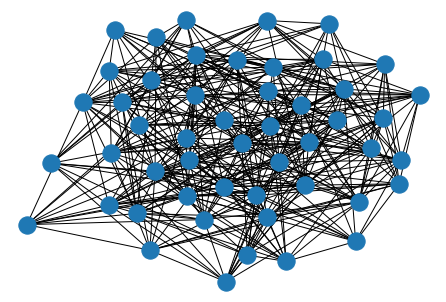

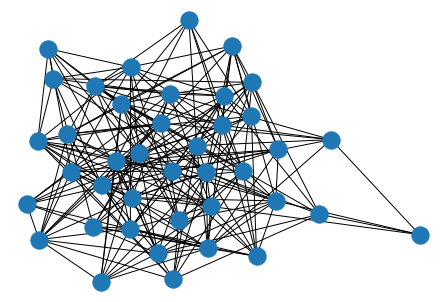

In [1]:
#Erdos-Renyi Graph in Networkx
import numpy as np
from statistics import mean
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 40 nodes (contact places) of Cities


#Graph = nx.gnm_random_graph(N, M)

P = .3      #Probabibilty for Node Connection in random graph
PP = .3
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 0 0 ... 0 1 0]
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 1 0]
 [1 0 0 ... 1 0 1]
 [0 0 0 ... 0 1 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]]


In [3]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
#print(Node)
print(len(Node))


{}
2000


In [4]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
#print(Node)
print(len(Node))


2000


In [5]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state, 'C' : 0})
    Agent[k].append({'State' : Rand_state, 'C' : 0 })
  else:
    Node[Rand_node*NN+Rand_nodeN][3]['R']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})

  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
#print(Node)
#print(Agent)

In [6]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [7]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load']*.5)})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(4,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  neighbors.append(Agent_next[a_id][1]['Home_node'])
                  neighbors.append(Agent_next[a_id][3]['First_node'])
                  neighbors.append(Agent_next[a_id][5]['Second_node'])

                  if len(neighbors) > 0:  
                      I1=(Node[Agent_next[a_id][4]['First_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][4]['First_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][4]['First_nodeN'][2]][2]['I'])
                      I2=(Node[Agent_next[a_id][6]['Second_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][6]['Second_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][6]['Second_nodeN'][2]][2]['I'])
                      IH=(Node[Agent_next[a_id][2]['Home_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][2]['Home_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][2]['Home_nodeN'][2]][2]['I'])
                      V1 = (Node[Agent_next[a_id][4]['First_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][4]['First_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][4]['First_nodeN'][2]][0]['Viral_load'])
                      V2 = (Node[Agent_next[a_id][6]['Second_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][6]['Second_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][6]['Second_nodeN'][2]][0]['Viral_load'])
                      VH = (Node[Agent_next[a_id][2]['Home_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][2]['Home_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][2]['Home_nodeN'][2]][0]['Viral_load'])
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      PH = IH/(IH**2 + .01) + VH/(VH**2+.01)
                      if max(P1,P2,PH) == PH:
                        PH = 3*PH
                        P1 = P1/3
                        P2 = P2/3
                      elif max(P1,P2,PH) == P1:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      else:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      P = P1 + P2 + PH                      
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1 = PH/P 
                        PNN2 = P1/P
                        PNN3 = P2/P 
                      #next = random.choices(neighbors,weights=(PNN1,PNN2,PNN3), k=1)[0] 
                      next = random.choices(neighbors,weights=(.95,.025,.025), k=1)[0]
                      if next == Agent_next[a_id][7]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][3]['First_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][3]['First_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][4]['First_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][4]['First_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][4]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][5]['Second_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][5]['Second_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][6]['Second_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][6]['Second_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][6]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][1]['Home_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][1]['Home_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][2]['Home_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][2]['Home_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][2]['Home_nodeN'][2]
                          count_stay_home+=1
                      I2 = Node[Agent_next[a_id][8]['Current_nodeN'][1]][2]['I']
                      I3 = Node[Agent_next[a_id][8]['Current_nodeN'][2]][2]['I']
                      I1 = Node[Agent_next[a_id][8]['Current_nodeN'][0]][2]['I']
                      V2 = Node[Agent_next[a_id][8]['Current_nodeN'][1]][0]['Viral_load']
                      V3 = Node[Agent_next[a_id][8]['Current_nodeN'][2]][0]['Viral_load']
                      V1 = Node[Agent_next[a_id][8]['Current_nodeN'][0]][0]['Viral_load']
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      P3 = I3/(I3**2 + .01) + V3/(V3**2+.01)
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      if max(P1,P2,P3) == P1:
                        P1 = 3*P1
                        P2 = P2
                        P3 = P3
                      elif max(P1,P2,P3) == P2:
                        P1 = 3*P1
                        P2 = 2*P2
                        P3 = P1
                      else:
                        P1 = 3*P1
                        P2 = P2
                        P3 = 2*P3
                      P = P1+P2+P3
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1=P1/P
                        PNN2=P2/P
                        PNN3=P3/P
                       
                      nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(PNN1,PNN2,PNN3),k=1)[0]
                      #nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(90,5,5),k=1)[0]
                      #if nextn == Agent_next[a_id][8]['Current_nodeN'][1]:
                      #  Agent_next[a_id][8]['Current_nodeN'][1],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][1]
                      #elif nextn == Agent_next[a_id][8]['Current_nodeN'][2] :
                      #  Agent_next[a_id][8]['Current_nodeN'][2],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][2]
                      #else:
                      #  Agent_next[a_id][8]['Current_nodeN'][0]=Agent_next[a_id][8]['Current_nodeN'][0]                      
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['C']+=1
            #if nex != cur:
            #  Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id] == 2:
            Node_next[nex][3]['R']+=1

          curr_walk.append(nex)
          walks.append(nex)

    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        W1 = Node_next[i*len(GraphN.nodes)+j][2]['I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load']
        W2 = Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1
        for agent in list(range(4,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'C' : 0})
              Agent_next[a_id][0]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent]['C'] == 4:   #Time-steps of 4 to get cured(I -> R)
              Node_next[i*len(GraphN.nodes)+j][agent][a_id] = 2
              count_IR+=1
              Agent_next[a_id][0]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('C') 
        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 
         
    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home) 

    return Node,Node_next,Agent,Agent_next

In [8]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  total_V=0.0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
    total_V+=Node[i][0]['Viral_load']
  return count_S,count_I,count_R,total_V

In [9]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][0]['State'] == 0:
      count_S+=1
    elif Agent[i][0]['State'] == 1:
      count_I+=1
    elif Agent[i][0]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895]
[193, 361, 642, 939, 1066, 1279, 1443, 1645, 1923, 2192, 2473, 2779, 2907, 2887, 2702, 2354, 2015, 1688, 1331, 1019, 737, 507, 378, 272, 204, 157, 111, 80, 50, 26, 19, 13, 9, 7, 5, 4, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 361, 642, 939, 1259, 1640, 2085, 2584, 3182, 3832, 4558, 5363, 6089, 6719, 7260, 7717, 8104, 8407, 8591, 8736, 8841, 8914, 8969, 9008, 9045, 9071, 9080, 9088, 9095, 9097, 9099, 9101, 9104, 9104, 9104, 9105]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 

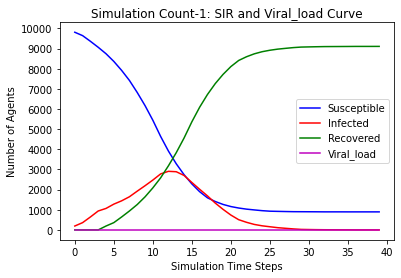

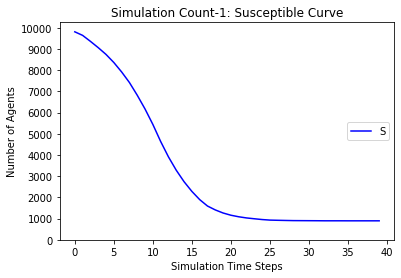

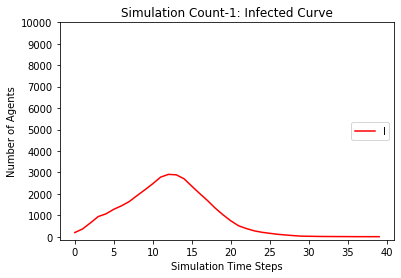

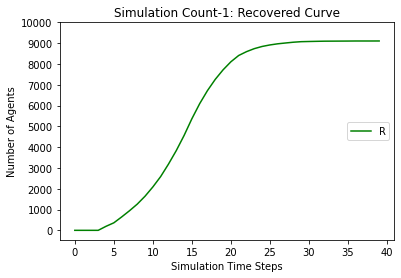

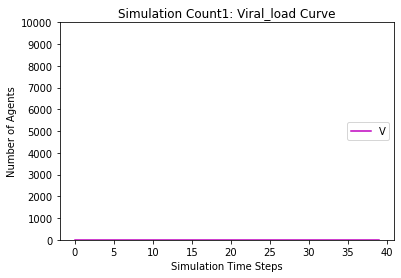

[9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7238, 6750, 6256, 5765, 5284, 4727, 4266, 3793, 3378, 3034, 2762, 2525, 2313, 2158, 2041, 1922, 1839, 1773, 1713, 1650, 1611, 1575, 1560, 1542, 1524, 1508, 1499, 1485, 1480, 1478, 1475, 1470, 1467, 1464, 1463, 1462, 1462, 1461, 1459, 1457, 1455, 1455, 1455, 1455, 1455]
[193, 365, 609, 916, 1071, 1222, 1338, 1419, 1498, 1663, 1797, 1900, 1954, 2023, 1990, 1972, 1906, 1693, 1504, 1268, 1065, 876, 721, 603, 474, 385, 328, 272, 228, 198, 153, 108, 87, 67, 61, 57, 44, 30, 24, 15, 13, 14, 12, 8, 5, 3, 4, 5, 7, 6, 4, 2, 0]
[0, 0, 0, 0, 193, 365, 609, 916, 1264, 1587, 1947, 2335, 2762, 3250, 3744, 4235, 4716, 5273, 5734, 6207, 6622, 6966, 7238, 7475, 7687, 7842, 7959, 8078, 8161, 8227, 8287, 8350, 8389, 8425, 8440, 8458, 8476, 8492, 8501, 8515, 8520, 8522, 8525, 8530, 8533, 8536, 8537, 8538, 8538, 8539, 8541, 8543, 8545]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

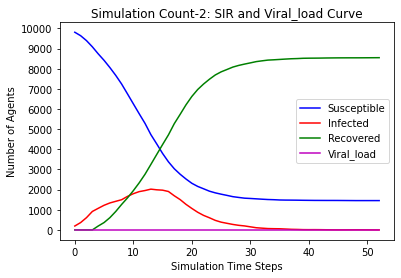

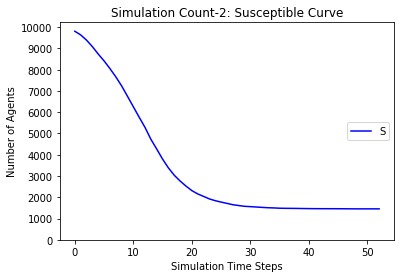

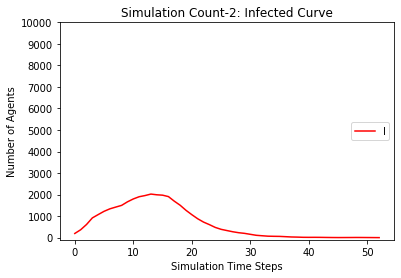

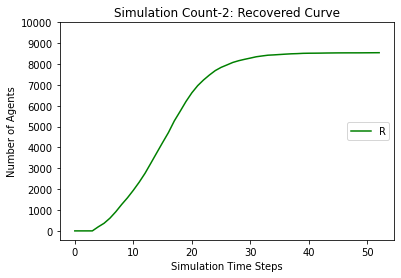

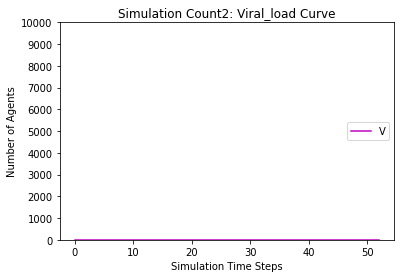

[9807, 9615, 9328, 8990, 8610, 8248, 7838, 7391, 6816, 6152, 5458, 4647, 3898, 3247, 2702, 2151, 1788, 1514, 1309, 1126, 1024, 942, 883, 837, 815, 796, 786, 778, 771, 763, 761, 760, 760, 760, 760, 760]
[193, 385, 672, 1010, 1197, 1367, 1490, 1599, 1794, 2096, 2380, 2744, 2918, 2905, 2756, 2496, 2110, 1733, 1393, 1025, 764, 572, 426, 289, 209, 146, 97, 59, 44, 33, 25, 18, 11, 3, 1, 0]
[0, 0, 0, 0, 193, 385, 672, 1010, 1390, 1752, 2162, 2609, 3184, 3848, 4542, 5353, 6102, 6753, 7298, 7849, 8212, 8486, 8691, 8874, 8976, 9058, 9117, 9163, 9185, 9204, 9214, 9222, 9229, 9237, 9239, 9240]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], 

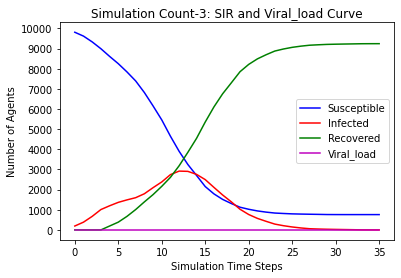

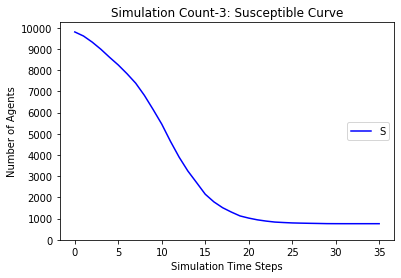

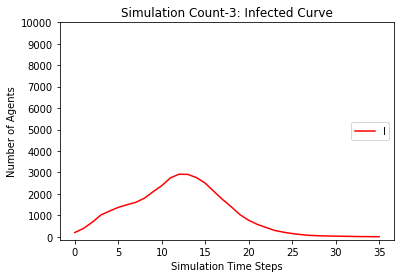

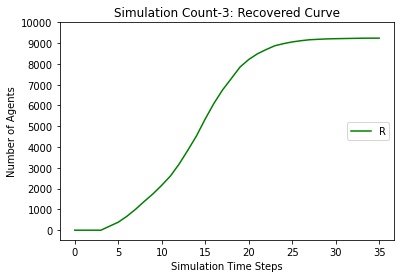

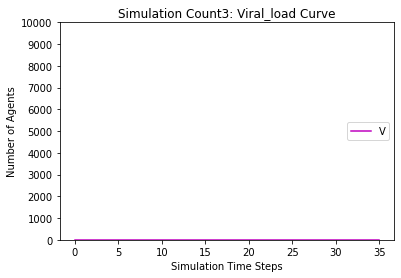

[9807, 9598, 9323, 8967, 8540, 8015, 7451, 6765, 6043, 5184, 4341, 3535, 2802, 2219, 1781, 1433, 1193, 1014, 903, 837, 794, 761, 742, 725, 717, 711, 709, 707, 707, 707, 706, 706, 706, 706, 706]
[193, 402, 677, 1033, 1267, 1583, 1872, 2202, 2497, 2831, 3110, 3230, 3241, 2965, 2560, 2102, 1609, 1205, 878, 596, 399, 253, 161, 112, 77, 50, 33, 18, 10, 4, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 402, 677, 1033, 1460, 1985, 2549, 3235, 3957, 4816, 5659, 6465, 7198, 7781, 8219, 8567, 8807, 8986, 9097, 9163, 9206, 9239, 9258, 9275, 9283, 9289, 9291, 9293, 9293, 9293, 9294]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736,

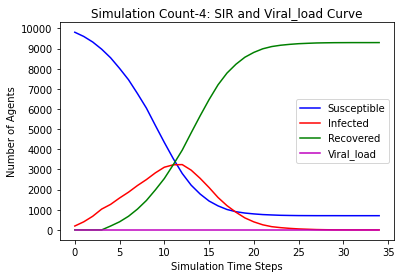

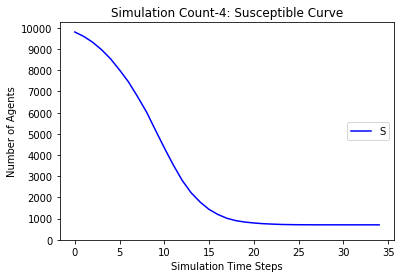

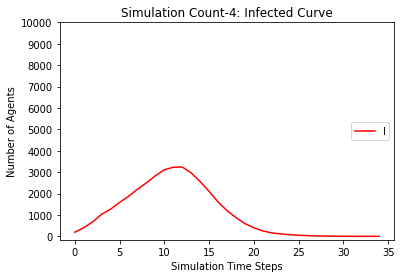

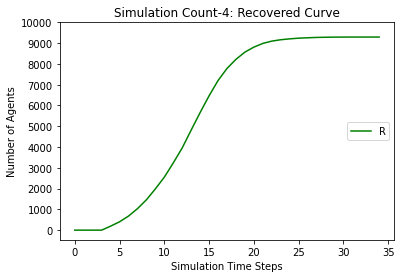

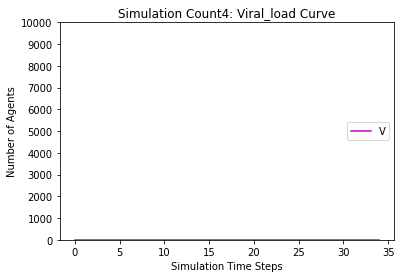

[9807, 9638, 9385, 9090, 8779, 8438, 8042, 7627, 7186, 6702, 6122, 5406, 4691, 3984, 3337, 2728, 2207, 1815, 1560, 1357, 1199, 1097, 1006, 957, 921, 901, 882, 868, 865, 862, 861, 860, 860, 860, 860, 860]
[193, 362, 615, 910, 1028, 1200, 1343, 1463, 1593, 1736, 1920, 2221, 2495, 2718, 2785, 2678, 2484, 2169, 1777, 1371, 1008, 718, 554, 400, 278, 196, 124, 89, 56, 39, 21, 8, 5, 2, 1, 0]
[0, 0, 0, 0, 193, 362, 615, 910, 1221, 1562, 1958, 2373, 2814, 3298, 3878, 4594, 5309, 6016, 6663, 7272, 7793, 8185, 8440, 8643, 8801, 8903, 8994, 9043, 9079, 9099, 9118, 9132, 9135, 9138, 9139, 9140]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], 

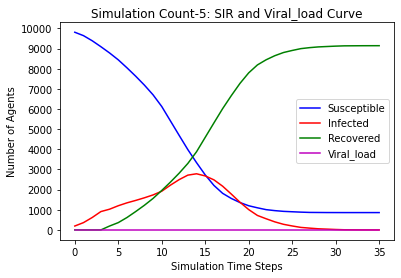

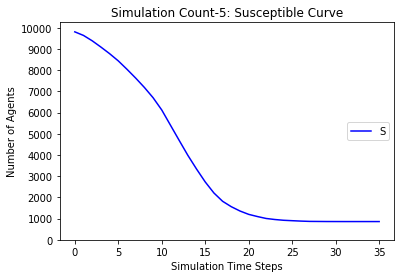

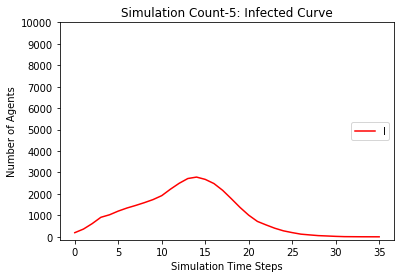

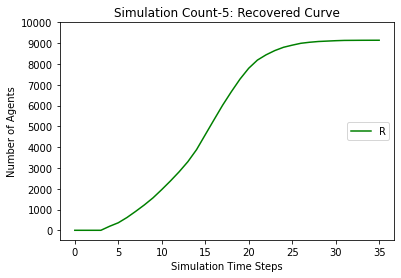

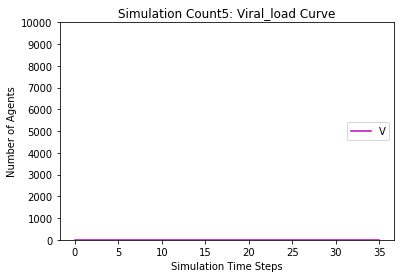

[9807, 9610, 9340, 9059, 8703, 8258, 7683, 7019, 6302, 5364, 4440, 3602, 2812, 2161, 1644, 1260, 975, 789, 677, 599, 557, 532, 517, 511, 508, 506, 506, 505, 505, 505, 505, 505]
[193, 390, 660, 941, 1104, 1352, 1657, 2040, 2401, 2894, 3243, 3417, 3490, 3203, 2796, 2342, 1837, 1372, 967, 661, 418, 257, 160, 88, 49, 26, 11, 6, 3, 1, 1, 0]
[0, 0, 0, 0, 193, 390, 660, 941, 1297, 1742, 2317, 2981, 3698, 4636, 5560, 6398, 7188, 7839, 8356, 8740, 9025, 9211, 9323, 9401, 9443, 9468, 9483, 9489, 9492, 9494, 9494, 9495]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7238, 6750, 6256, 5765, 5284, 4727, 4266, 379

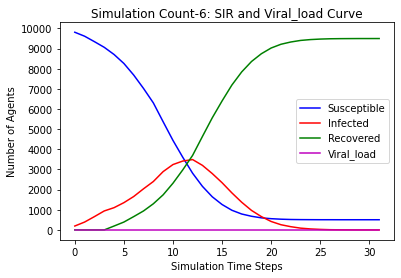

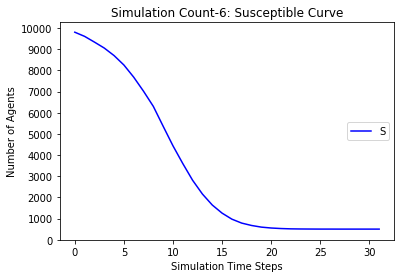

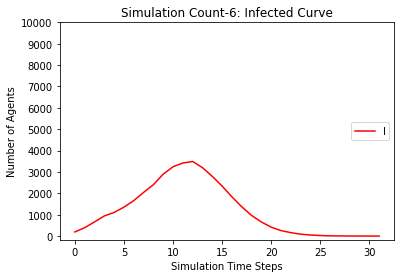

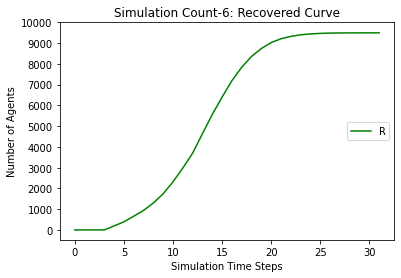

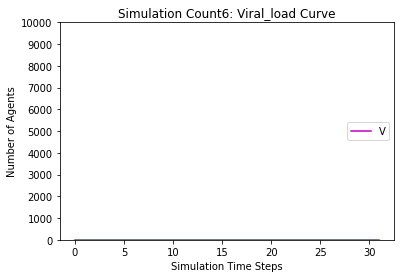

[9807, 9621, 9352, 9054, 8669, 8273, 7803, 7344, 6820, 6152, 5458, 4605, 3741, 2983, 2361, 1867, 1483, 1208, 1011, 855, 766, 715, 681, 656, 634, 626, 618, 615, 613, 611, 611, 611, 611, 611]
[193, 379, 648, 946, 1138, 1348, 1549, 1710, 1849, 2121, 2345, 2739, 3079, 3169, 3097, 2738, 2258, 1775, 1350, 1012, 717, 493, 330, 199, 132, 89, 63, 41, 21, 15, 7, 4, 2, 0]
[0, 0, 0, 0, 193, 379, 648, 946, 1331, 1727, 2197, 2656, 3180, 3848, 4542, 5395, 6259, 7017, 7639, 8133, 8517, 8792, 8989, 9145, 9234, 9285, 9319, 9344, 9366, 9374, 9382, 9385, 9387, 9389]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 766

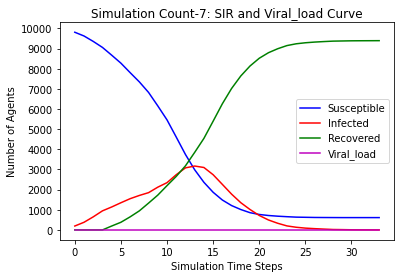

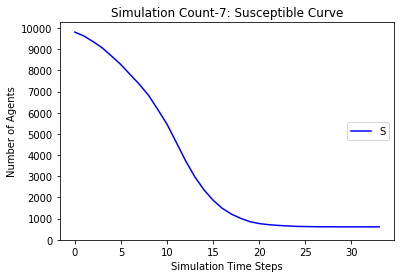

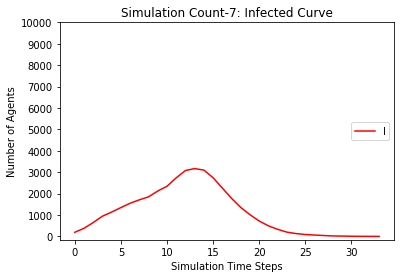

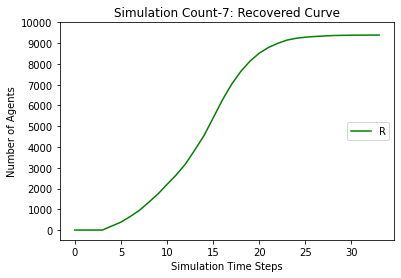

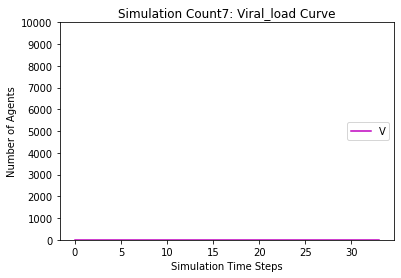

[9807, 9622, 9365, 9066, 8757, 8425, 8082, 7702, 7295, 6819, 6252, 5570, 4837, 4191, 3588, 3049, 2574, 2175, 1855, 1640, 1457, 1334, 1220, 1136, 1065, 1027, 1003, 984, 968, 961, 948, 944, 939, 937, 934, 934, 933, 933, 933, 933, 933]
[193, 378, 635, 934, 1050, 1197, 1283, 1364, 1462, 1606, 1830, 2132, 2458, 2628, 2664, 2521, 2263, 2016, 1733, 1409, 1117, 841, 635, 504, 392, 307, 217, 152, 97, 66, 55, 40, 29, 24, 14, 10, 6, 4, 1, 1, 0]
[0, 0, 0, 0, 193, 378, 635, 934, 1243, 1575, 1918, 2298, 2705, 3181, 3748, 4430, 5163, 5809, 6412, 6951, 7426, 7825, 8145, 8360, 8543, 8666, 8780, 8864, 8935, 8973, 8997, 9016, 9032, 9039, 9052, 9056, 9061, 9063, 9066, 9066, 9067]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264,

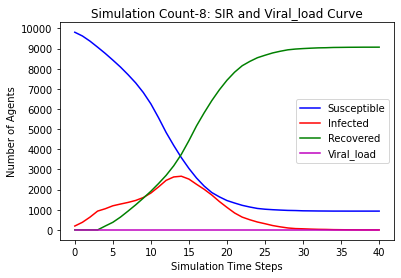

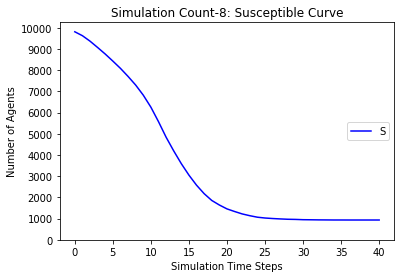

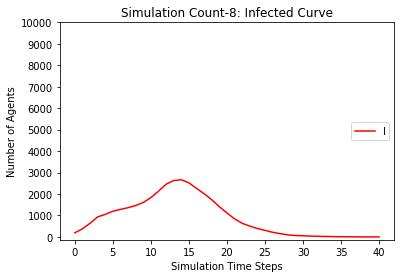

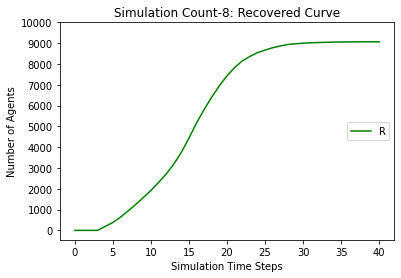

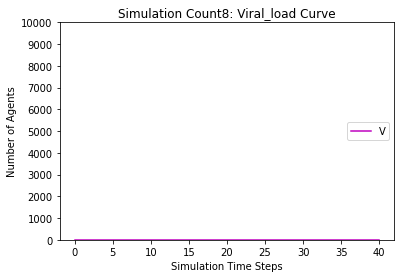

[9807, 9635, 9390, 9098, 8776, 8483, 8128, 7733, 7330, 6858, 6303, 5726, 5092, 4472, 3792, 3160, 2607, 2161, 1833, 1581, 1411, 1292, 1189, 1132, 1099, 1066, 1038, 1027, 1021, 1016, 1015, 1014, 1014, 1014, 1014, 1014]
[193, 365, 610, 902, 1031, 1152, 1262, 1365, 1446, 1625, 1825, 2007, 2238, 2386, 2511, 2566, 2485, 2311, 1959, 1579, 1196, 869, 644, 449, 312, 226, 151, 105, 78, 50, 23, 13, 7, 2, 1, 0]
[0, 0, 0, 0, 193, 365, 610, 902, 1224, 1517, 1872, 2267, 2670, 3142, 3697, 4274, 4908, 5528, 6208, 6840, 7393, 7839, 8167, 8419, 8589, 8708, 8811, 8868, 8901, 8934, 8962, 8973, 8979, 8984, 8985, 8986]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 8

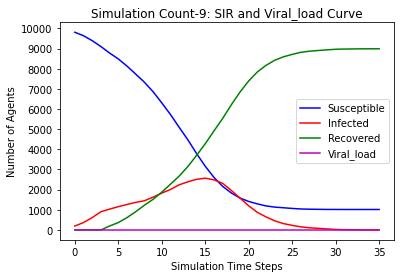

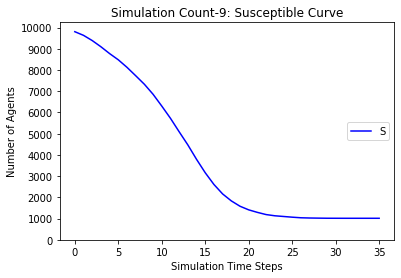

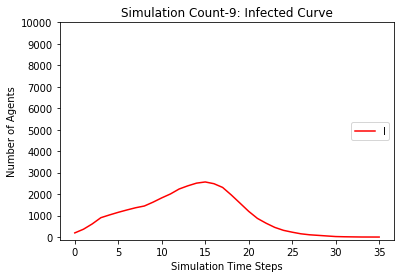

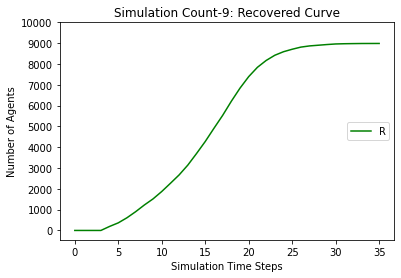

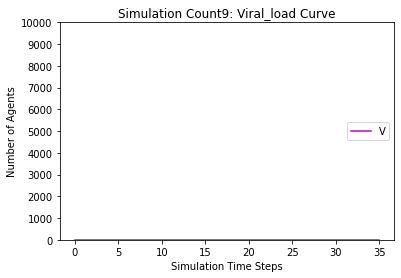

[9807, 9632, 9374, 9034, 8665, 8319, 7897, 7465, 6990, 6434, 5777, 5026, 4349, 3743, 3181, 2649, 2214, 1869, 1584, 1374, 1234, 1135, 1063, 1018, 990, 974, 959, 949, 939, 936, 933, 929, 926, 926, 926, 926, 926]
[193, 368, 626, 966, 1142, 1313, 1477, 1569, 1675, 1885, 2120, 2439, 2641, 2691, 2596, 2377, 2135, 1874, 1597, 1275, 980, 734, 521, 356, 244, 161, 104, 69, 51, 38, 26, 20, 13, 10, 7, 3, 0]
[0, 0, 0, 0, 193, 368, 626, 966, 1335, 1681, 2103, 2535, 3010, 3566, 4223, 4974, 5651, 6257, 6819, 7351, 7786, 8131, 8416, 8626, 8766, 8865, 8937, 8982, 9010, 9026, 9041, 9051, 9061, 9064, 9067, 9071, 9074]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895,

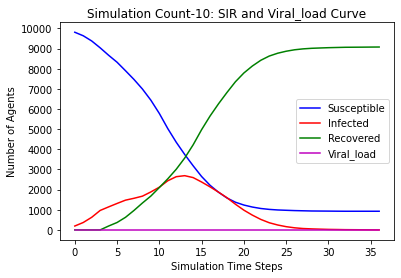

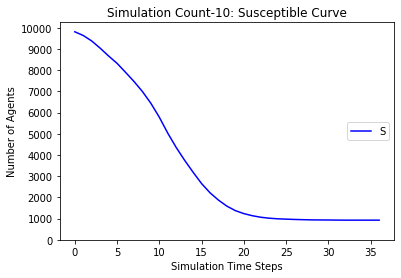

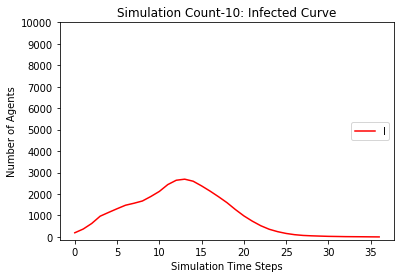

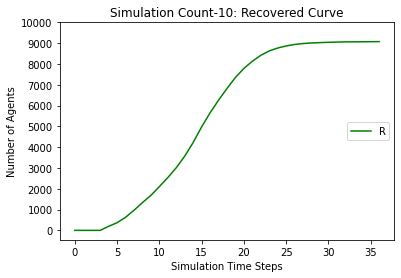

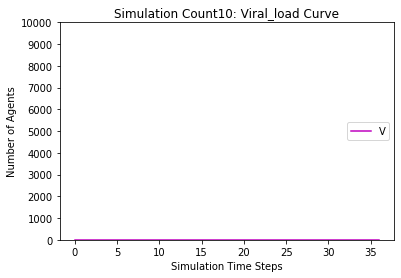

[9807, 9620, 9394, 9095, 8752, 8382, 7982, 7544, 7115, 6651, 6218, 5650, 5075, 4498, 3953, 3484, 2963, 2546, 2223, 1952, 1725, 1560, 1415, 1318, 1257, 1215, 1178, 1147, 1130, 1115, 1106, 1097, 1092, 1089, 1088, 1088, 1087, 1087, 1087, 1087, 1087]
[193, 380, 606, 905, 1055, 1238, 1412, 1551, 1637, 1731, 1764, 1894, 2040, 2153, 2265, 2166, 2112, 1952, 1730, 1532, 1238, 986, 808, 634, 468, 345, 237, 171, 127, 100, 72, 50, 38, 26, 18, 9, 5, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 380, 606, 905, 1248, 1618, 2018, 2456, 2885, 3349, 3782, 4350, 4925, 5502, 6047, 6516, 7037, 7454, 7777, 8048, 8275, 8440, 8585, 8682, 8743, 8785, 8822, 8853, 8870, 8885, 8894, 8903, 8908, 8911, 8912, 8912, 8913]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 15

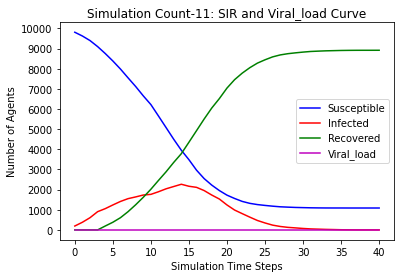

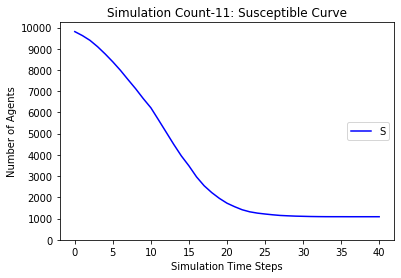

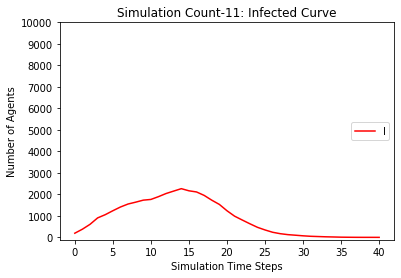

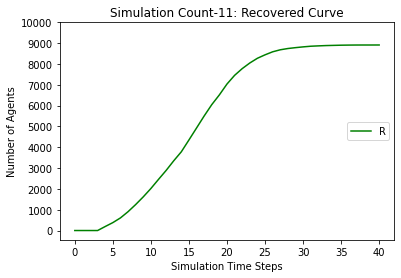

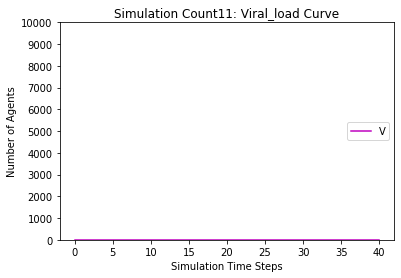

[9807, 9627, 9373, 9049, 8728, 8368, 7884, 7285, 6651, 5804, 4974, 4096, 3361, 2705, 2155, 1701, 1400, 1206, 1062, 960, 882, 835, 805, 788, 777, 770, 768, 762, 760, 759, 758, 757, 757, 757, 756, 756, 756, 756, 756]
[193, 373, 627, 951, 1079, 1259, 1489, 1764, 2077, 2564, 2910, 3189, 3290, 3099, 2819, 2395, 1961, 1499, 1093, 741, 518, 371, 257, 172, 105, 65, 37, 26, 17, 11, 10, 5, 3, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 373, 627, 951, 1272, 1632, 2116, 2715, 3349, 4196, 5026, 5904, 6639, 7295, 7845, 8299, 8600, 8794, 8938, 9040, 9118, 9165, 9195, 9212, 9223, 9230, 9232, 9238, 9240, 9241, 9242, 9243, 9243, 9243, 9244]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 90

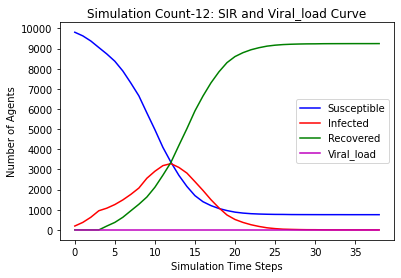

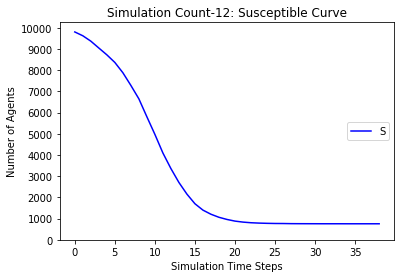

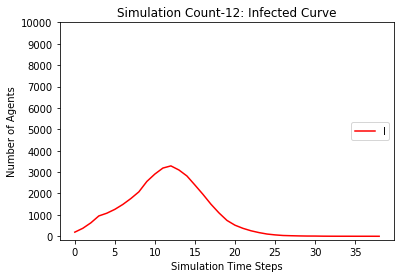

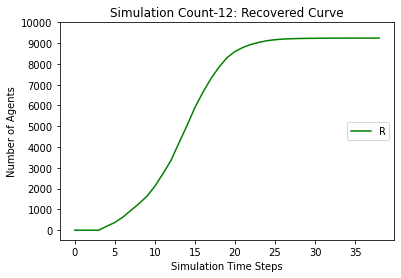

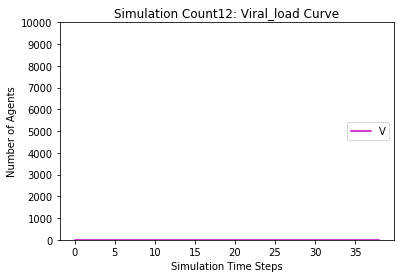

[9807, 9605, 9356, 9038, 8680, 8344, 7919, 7381, 6811, 6206, 5536, 4761, 3929, 3123, 2454, 1946, 1591, 1358, 1164, 1058, 979, 907, 861, 829, 804, 791, 778, 770, 764, 762, 758, 756, 755, 755, 755, 755, 755]
[193, 395, 644, 962, 1127, 1261, 1437, 1657, 1869, 2138, 2383, 2620, 2882, 3083, 3082, 2815, 2338, 1765, 1290, 888, 612, 451, 303, 229, 175, 116, 83, 59, 40, 29, 20, 14, 9, 7, 3, 1, 0]
[0, 0, 0, 0, 193, 395, 644, 962, 1320, 1656, 2081, 2619, 3189, 3794, 4464, 5239, 6071, 6877, 7546, 8054, 8409, 8642, 8836, 8942, 9021, 9093, 9139, 9171, 9196, 9209, 9222, 9230, 9236, 9238, 9242, 9244, 9245]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 89

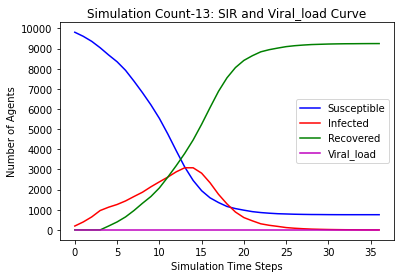

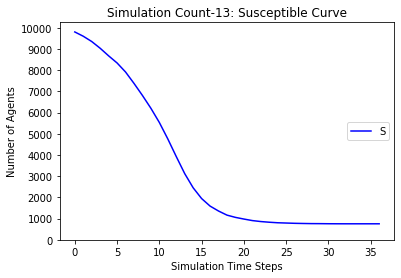

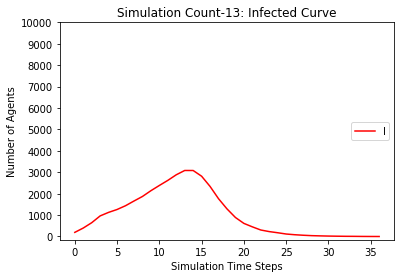

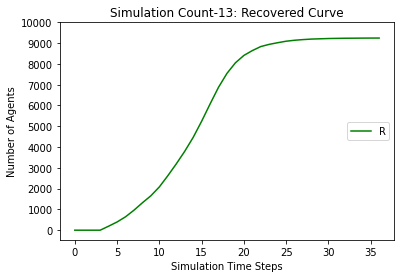

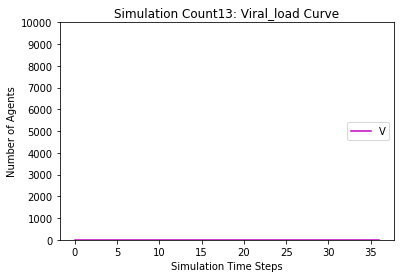

[9807, 9631, 9386, 9063, 8734, 8335, 7851, 7297, 6671, 5821, 5011, 4180, 3368, 2702, 2127, 1694, 1369, 1162, 966, 866, 793, 741, 713, 690, 679, 670, 664, 662, 659, 658, 657, 657, 657, 657, 656, 656, 656, 656, 656]
[193, 369, 614, 937, 1073, 1296, 1535, 1766, 2063, 2514, 2840, 3117, 3303, 3119, 2884, 2486, 1999, 1540, 1161, 828, 576, 421, 253, 176, 114, 71, 49, 28, 20, 12, 7, 5, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 369, 614, 937, 1266, 1665, 2149, 2703, 3329, 4179, 4989, 5820, 6632, 7298, 7873, 8306, 8631, 8838, 9034, 9134, 9207, 9259, 9287, 9310, 9321, 9330, 9336, 9338, 9341, 9342, 9343, 9343, 9343, 9343, 9344]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901,

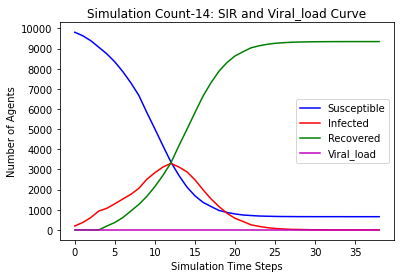

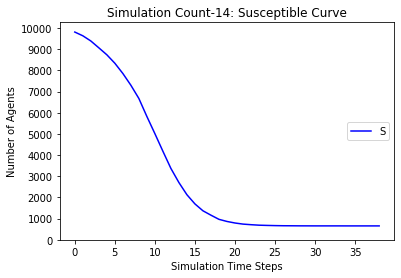

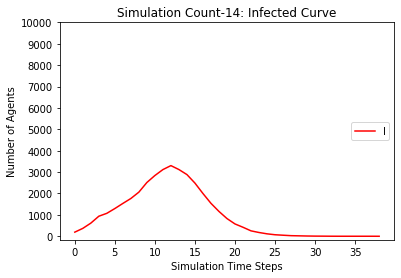

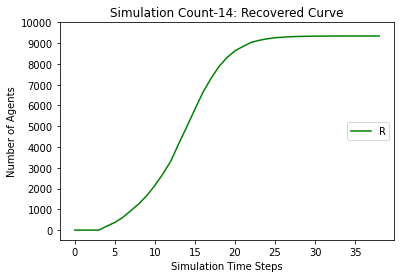

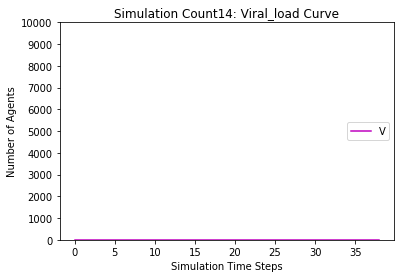

[9807, 9609, 9343, 9023, 8688, 8361, 8032, 7646, 7116, 6557, 5895, 5188, 4385, 3631, 2968, 2351, 1877, 1588, 1314, 1158, 1053, 974, 927, 893, 865, 847, 838, 830, 830, 830, 830, 830]
[193, 391, 657, 977, 1119, 1248, 1311, 1377, 1572, 1804, 2137, 2458, 2731, 2926, 2927, 2837, 2508, 2043, 1654, 1193, 824, 614, 387, 265, 188, 127, 89, 63, 35, 17, 8, 0]
[0, 0, 0, 0, 193, 391, 657, 977, 1312, 1639, 1968, 2354, 2884, 3443, 4105, 4812, 5615, 6369, 7032, 7649, 8123, 8412, 8686, 8842, 8947, 9026, 9073, 9107, 9135, 9153, 9162, 9170]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7238, 6750, 6256, 5765, 5284, 47

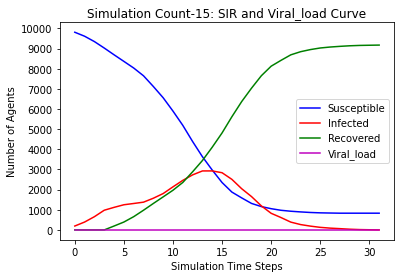

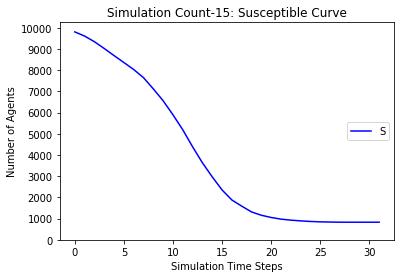

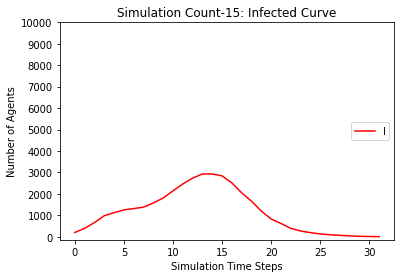

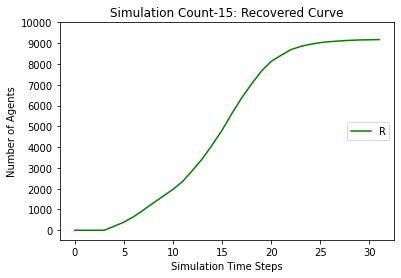

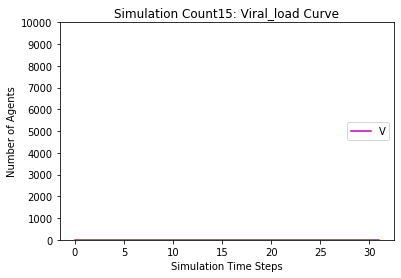

[9807, 9617, 9368, 9090, 8773, 8458, 8067, 7620, 7117, 6417, 5624, 4835, 3975, 3147, 2456, 1911, 1488, 1185, 970, 810, 725, 650, 612, 589, 575, 564, 562, 557, 549, 546, 543, 543, 543, 542, 541, 541, 541, 541, 541]
[193, 383, 632, 910, 1034, 1159, 1301, 1470, 1656, 2041, 2443, 2785, 3142, 3270, 3168, 2924, 2487, 1962, 1486, 1101, 763, 535, 358, 221, 150, 86, 50, 32, 26, 18, 19, 14, 6, 4, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 193, 383, 632, 910, 1227, 1542, 1933, 2380, 2883, 3583, 4376, 5165, 6025, 6853, 7544, 8089, 8512, 8815, 9030, 9190, 9275, 9350, 9388, 9411, 9425, 9436, 9438, 9443, 9451, 9454, 9457, 9457, 9457, 9458, 9459]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 9

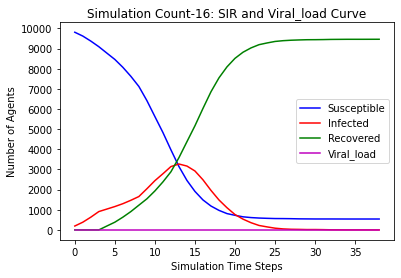

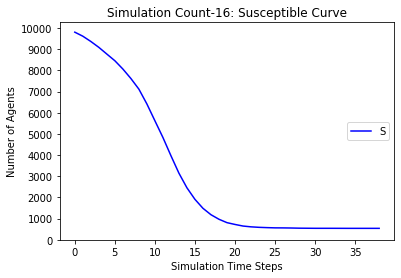

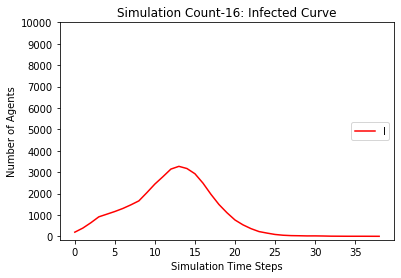

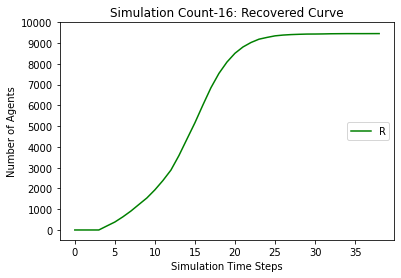

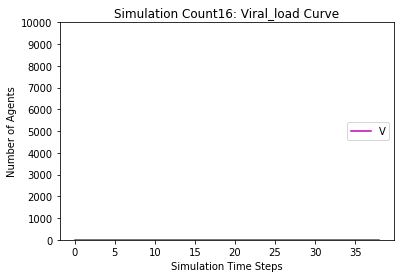

[9807, 9607, 9351, 9060, 8706, 8366, 7986, 7561, 7037, 6493, 5857, 5150, 4459, 3793, 3184, 2643, 2204, 1838, 1566, 1366, 1224, 1107, 1029, 968, 923, 895, 877, 871, 866, 864, 864, 862, 862, 860, 860, 860, 860, 860]
[193, 393, 649, 940, 1101, 1241, 1365, 1499, 1669, 1873, 2129, 2411, 2578, 2700, 2673, 2507, 2255, 1955, 1618, 1277, 980, 731, 537, 398, 301, 212, 152, 97, 57, 31, 13, 9, 4, 4, 4, 2, 2, 0]
[0, 0, 0, 0, 193, 393, 649, 940, 1294, 1634, 2014, 2439, 2963, 3507, 4143, 4850, 5541, 6207, 6816, 7357, 7796, 8162, 8434, 8634, 8776, 8893, 8971, 9032, 9077, 9105, 9123, 9129, 9134, 9136, 9136, 9138, 9138, 9140]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896,

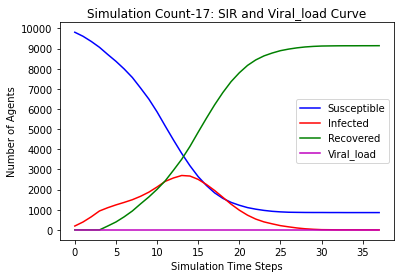

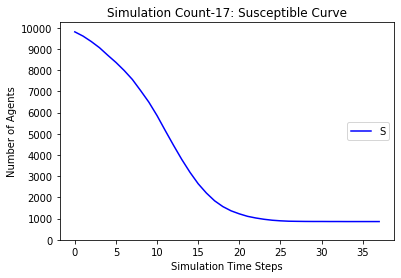

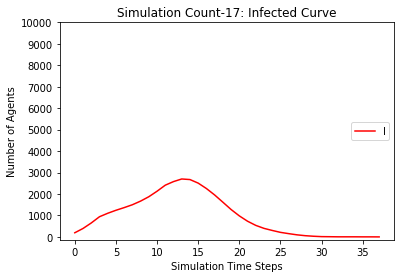

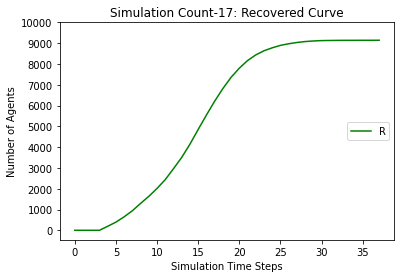

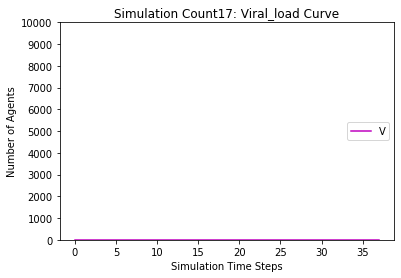

[9807, 9620, 9322, 8970, 8603, 8175, 7779, 7341, 6838, 6268, 5585, 4813, 4101, 3411, 2814, 2332, 1938, 1626, 1394, 1224, 1105, 1008, 931, 879, 850, 829, 815, 801, 796, 792, 790, 787, 786, 785, 785, 784, 784, 784, 784, 784]
[193, 380, 678, 1030, 1204, 1445, 1543, 1629, 1765, 1907, 2194, 2528, 2737, 2857, 2771, 2481, 2163, 1785, 1420, 1108, 833, 618, 463, 345, 255, 179, 116, 78, 54, 37, 25, 14, 10, 7, 5, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 380, 678, 1030, 1397, 1825, 2221, 2659, 3162, 3732, 4415, 5187, 5899, 6589, 7186, 7668, 8062, 8374, 8606, 8776, 8895, 8992, 9069, 9121, 9150, 9171, 9185, 9199, 9204, 9208, 9210, 9213, 9214, 9215, 9215, 9216]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955

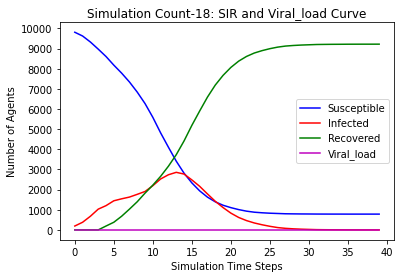

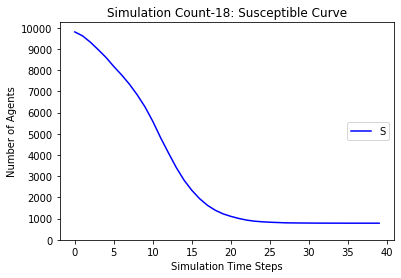

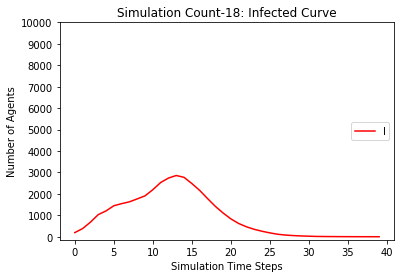

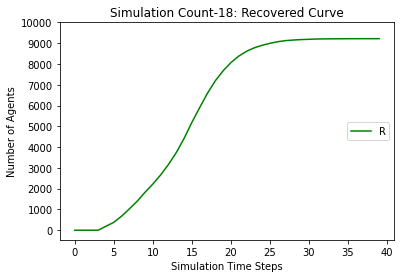

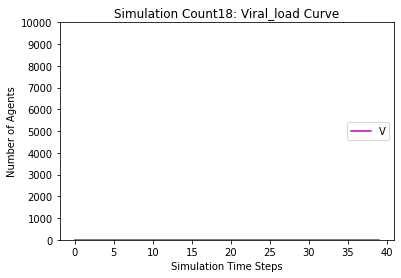

[9807, 9624, 9370, 9038, 8650, 8230, 7759, 7196, 6642, 6076, 5454, 4736, 4041, 3343, 2716, 2203, 1841, 1509, 1272, 1126, 1023, 931, 864, 835, 815, 790, 778, 772, 772, 771, 771, 771, 771, 771]
[193, 376, 630, 962, 1157, 1394, 1611, 1842, 2008, 2154, 2305, 2460, 2601, 2733, 2738, 2533, 2200, 1834, 1444, 1077, 818, 578, 408, 291, 208, 141, 86, 63, 43, 19, 7, 1, 1, 0]
[0, 0, 0, 0, 193, 376, 630, 962, 1350, 1770, 2241, 2804, 3358, 3924, 4546, 5264, 5959, 6657, 7284, 7797, 8159, 8491, 8728, 8874, 8977, 9069, 9136, 9165, 9185, 9210, 9222, 9228, 9228, 9229]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 

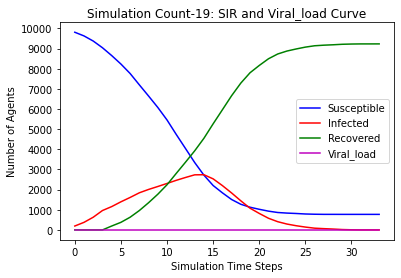

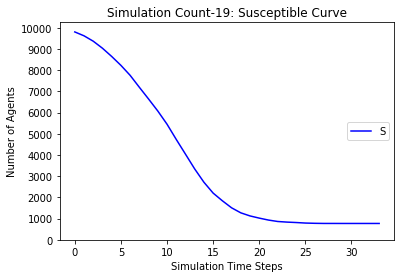

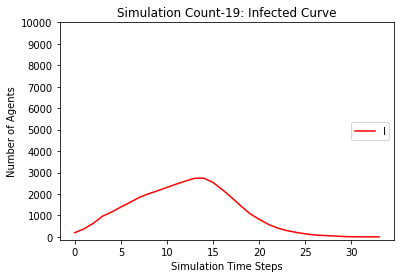

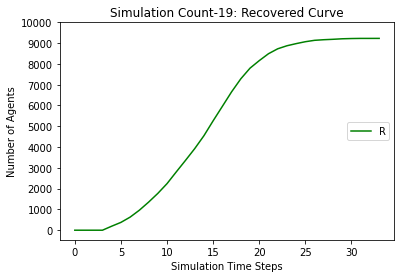

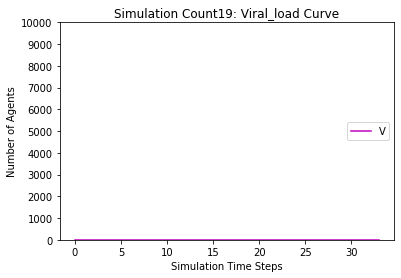

[9807, 9598, 9334, 9041, 8703, 8350, 7969, 7515, 6972, 6368, 5736, 5106, 4401, 3691, 3011, 2399, 1883, 1492, 1262, 1054, 949, 873, 816, 781, 761, 744, 732, 722, 718, 712, 710, 710, 710, 710, 710]
[193, 402, 666, 959, 1104, 1248, 1365, 1526, 1731, 1982, 2233, 2409, 2571, 2677, 2725, 2707, 2518, 2199, 1749, 1345, 934, 619, 446, 273, 188, 129, 84, 59, 43, 32, 22, 12, 8, 2, 0]
[0, 0, 0, 0, 193, 402, 666, 959, 1297, 1650, 2031, 2485, 3028, 3632, 4264, 4894, 5599, 6309, 6989, 7601, 8117, 8508, 8738, 8946, 9051, 9127, 9184, 9219, 9239, 9256, 9268, 9278, 9282, 9288, 9290]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084

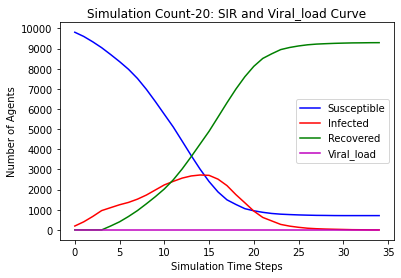

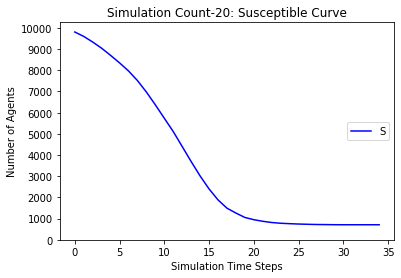

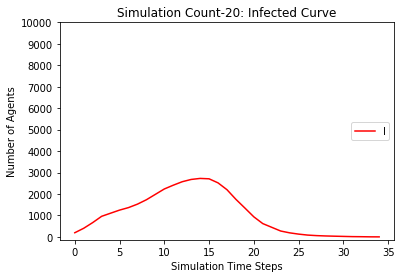

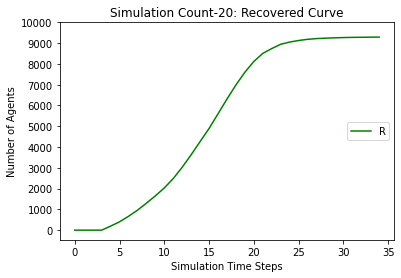

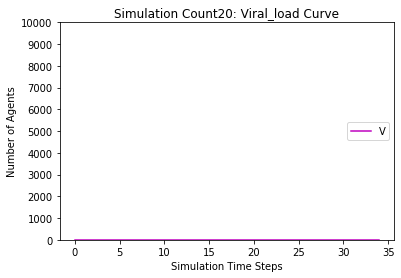

[9807, 9631, 9366, 9057, 8687, 8221, 7698, 7104, 6468, 5885, 5138, 4386, 3673, 3052, 2421, 1944, 1591, 1299, 1155, 1013, 920, 862, 811, 768, 745, 728, 723, 717, 712, 711, 711, 709, 709, 709, 709, 709]
[193, 369, 634, 943, 1120, 1410, 1668, 1953, 2219, 2336, 2560, 2718, 2795, 2833, 2717, 2442, 2082, 1753, 1266, 931, 671, 437, 344, 245, 175, 134, 88, 51, 33, 17, 12, 8, 3, 2, 2, 0]
[0, 0, 0, 0, 193, 369, 634, 943, 1313, 1779, 2302, 2896, 3532, 4115, 4862, 5614, 6327, 6948, 7579, 8056, 8409, 8701, 8845, 8987, 9080, 9138, 9189, 9232, 9255, 9272, 9277, 9283, 9288, 9289, 9289, 9291]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807,

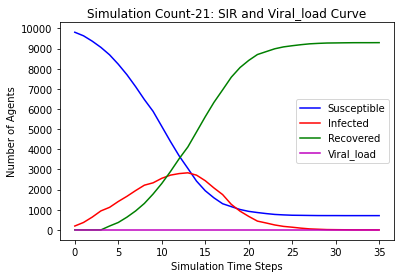

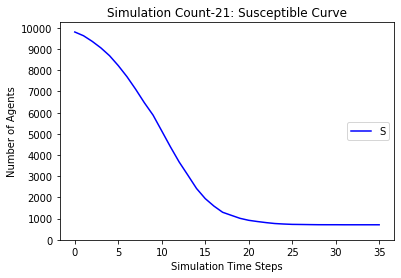

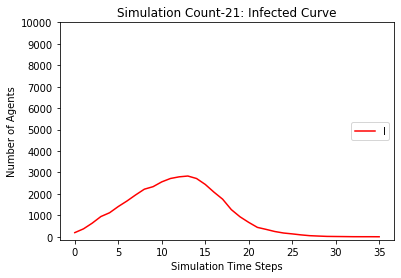

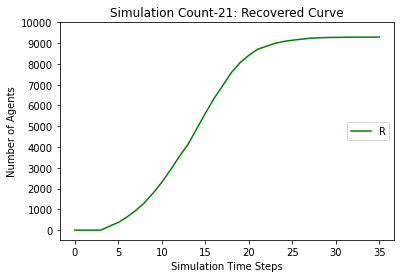

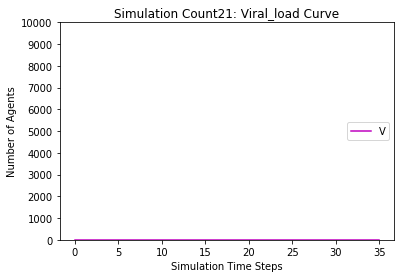

[9807, 9626, 9367, 9068, 8716, 8335, 7967, 7513, 6958, 6227, 5535, 4854, 4234, 3663, 3039, 2517, 2068, 1749, 1482, 1321, 1215, 1125, 1062, 1011, 977, 951, 944, 938, 934, 931, 930, 926, 924, 923, 922, 920, 919, 919, 919, 919, 919]
[193, 374, 633, 932, 1091, 1291, 1400, 1555, 1758, 2108, 2432, 2659, 2724, 2564, 2496, 2337, 2166, 1914, 1557, 1196, 853, 624, 420, 310, 238, 174, 118, 73, 43, 20, 14, 12, 10, 8, 8, 6, 5, 4, 3, 1, 0]
[0, 0, 0, 0, 193, 374, 633, 932, 1284, 1665, 2033, 2487, 3042, 3773, 4465, 5146, 5766, 6337, 6961, 7483, 7932, 8251, 8518, 8679, 8785, 8875, 8938, 8989, 9023, 9049, 9056, 9062, 9066, 9069, 9070, 9074, 9076, 9077, 9078, 9080, 9081]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1

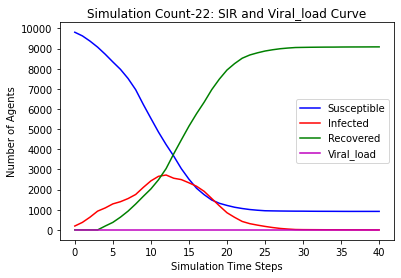

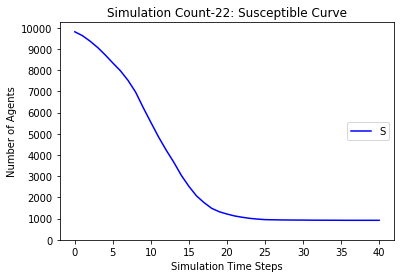

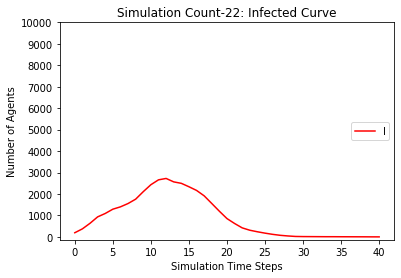

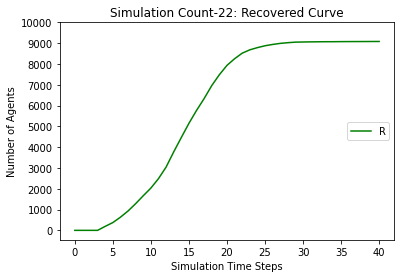

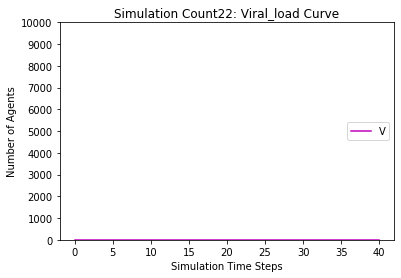

[9807, 9630, 9369, 9073, 8692, 8357, 7969, 7548, 7071, 6505, 5916, 5304, 4736, 4205, 3677, 3208, 2830, 2457, 2163, 1914, 1749, 1606, 1486, 1398, 1302, 1231, 1191, 1161, 1138, 1132, 1119, 1114, 1108, 1105, 1100, 1097, 1097, 1097, 1096, 1096, 1096, 1096, 1096]
[193, 370, 631, 927, 1115, 1273, 1400, 1525, 1621, 1852, 2053, 2244, 2335, 2300, 2239, 2096, 1906, 1748, 1514, 1294, 1081, 851, 677, 516, 447, 375, 295, 237, 164, 99, 72, 47, 30, 27, 19, 17, 11, 8, 4, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 370, 631, 927, 1308, 1643, 2031, 2452, 2929, 3495, 4084, 4696, 5264, 5795, 6323, 6792, 7170, 7543, 7837, 8086, 8251, 8394, 8514, 8602, 8698, 8769, 8809, 8839, 8862, 8868, 8881, 8886, 8892, 8895, 8900, 8903, 8903, 8903, 8904]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 544

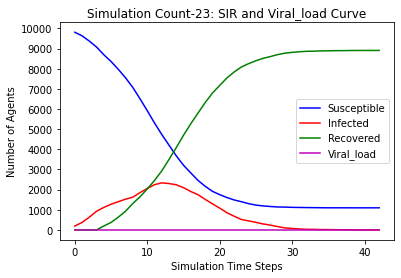

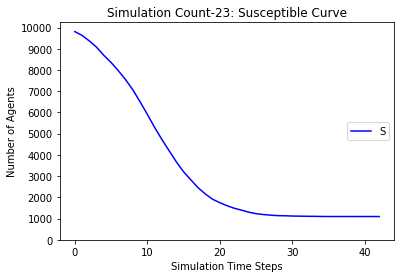

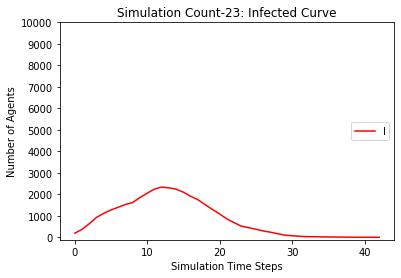

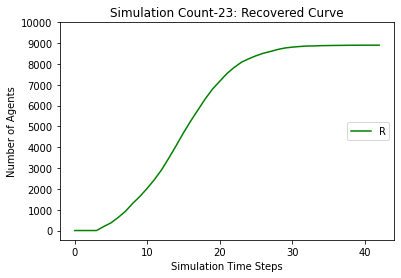

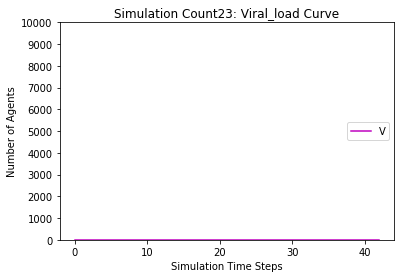

[9807, 9634, 9409, 9122, 8754, 8398, 8009, 7538, 7031, 6478, 5928, 5304, 4638, 3915, 3242, 2745, 2284, 1947, 1674, 1500, 1360, 1244, 1134, 1053, 988, 940, 916, 895, 880, 870, 862, 856, 852, 852, 848, 843, 841, 841, 841, 841, 841]
[193, 366, 591, 878, 1053, 1236, 1400, 1584, 1723, 1920, 2081, 2234, 2393, 2563, 2686, 2559, 2354, 1968, 1568, 1245, 924, 703, 540, 447, 372, 304, 218, 158, 108, 70, 54, 39, 28, 18, 14, 13, 11, 11, 7, 2, 0]
[0, 0, 0, 0, 193, 366, 591, 878, 1246, 1602, 1991, 2462, 2969, 3522, 4072, 4696, 5362, 6085, 6758, 7255, 7716, 8053, 8326, 8500, 8640, 8756, 8866, 8947, 9012, 9060, 9084, 9105, 9120, 9130, 9138, 9144, 9148, 9148, 9152, 9157, 9159]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 

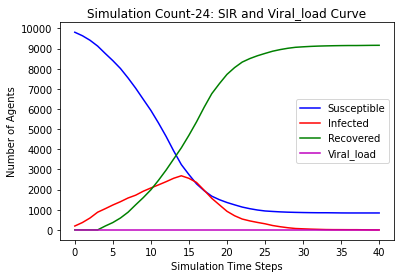

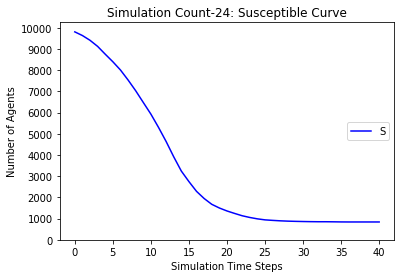

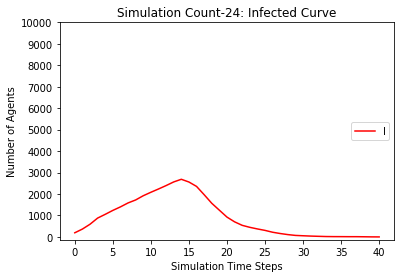

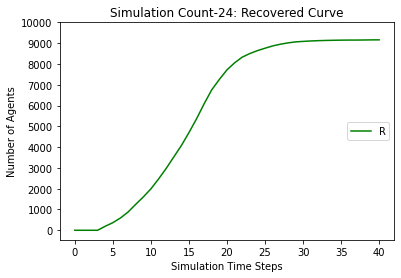

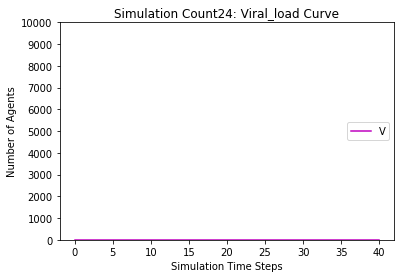

[9807, 9620, 9346, 9032, 8668, 8281, 7769, 7213, 6571, 5907, 5173, 4435, 3654, 2880, 2276, 1818, 1458, 1195, 1020, 901, 843, 784, 753, 737, 726, 720, 716, 713, 710, 707, 707, 707, 707, 707]
[193, 380, 654, 968, 1139, 1339, 1577, 1819, 2097, 2374, 2596, 2778, 2917, 3027, 2897, 2617, 2196, 1685, 1256, 917, 615, 411, 267, 164, 117, 64, 37, 24, 16, 13, 9, 6, 3, 0]
[0, 0, 0, 0, 193, 380, 654, 968, 1332, 1719, 2231, 2787, 3429, 4093, 4827, 5565, 6346, 7120, 7724, 8182, 8542, 8805, 8980, 9099, 9157, 9216, 9247, 9263, 9274, 9280, 9284, 9287, 9290, 9293]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665

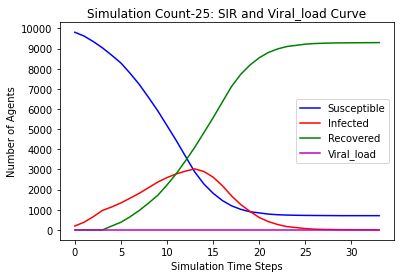

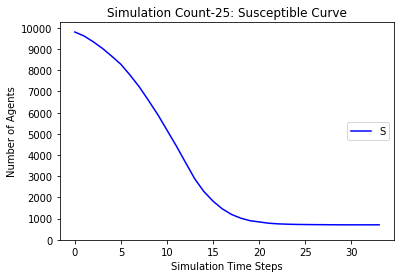

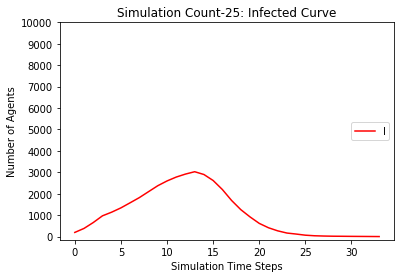

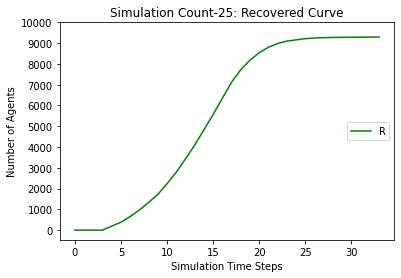

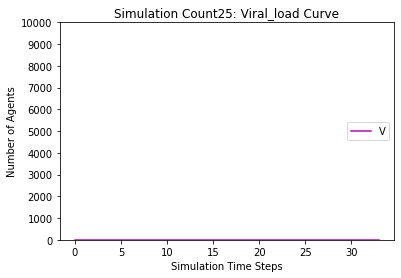

[9807, 9620, 9376, 9106, 8776, 8438, 8029, 7601, 7109, 6530, 5851, 5206, 4506, 3774, 3102, 2579, 2135, 1799, 1545, 1364, 1213, 1100, 1035, 980, 947, 922, 911, 895, 881, 875, 874, 872, 871, 871, 871, 871, 871]
[193, 380, 624, 894, 1031, 1182, 1347, 1505, 1667, 1908, 2178, 2395, 2603, 2756, 2749, 2627, 2371, 1975, 1557, 1215, 922, 699, 510, 384, 266, 178, 124, 85, 66, 47, 37, 23, 10, 4, 3, 1, 0]
[0, 0, 0, 0, 193, 380, 624, 894, 1224, 1562, 1971, 2399, 2891, 3470, 4149, 4794, 5494, 6226, 6898, 7421, 7865, 8201, 8455, 8636, 8787, 8900, 8965, 9020, 9053, 9078, 9089, 9105, 9119, 9125, 9126, 9128, 9129]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 8

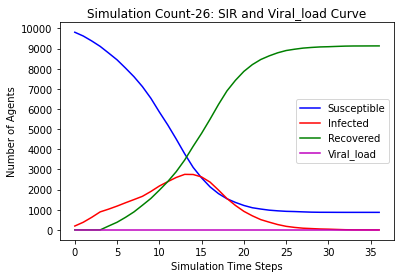

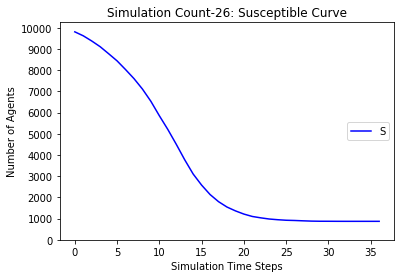

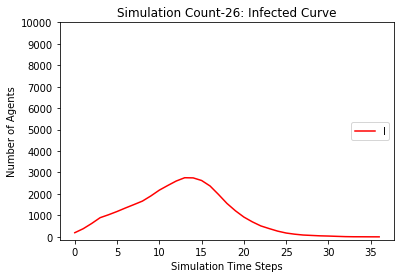

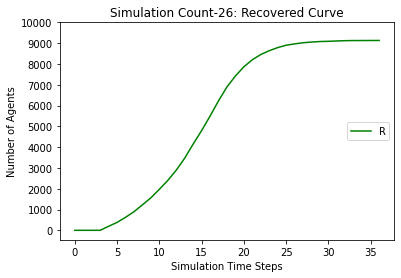

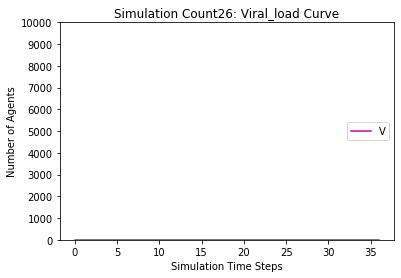

[9807, 9607, 9344, 9023, 8660, 8295, 7933, 7468, 6903, 6285, 5600, 4856, 4035, 3348, 2803, 2361, 1980, 1669, 1453, 1283, 1167, 1071, 1000, 966, 934, 899, 879, 865, 859, 853, 851, 842, 841, 838, 837, 837, 837, 836, 836, 836, 836, 836]
[193, 393, 656, 977, 1147, 1312, 1411, 1555, 1757, 2010, 2333, 2612, 2868, 2937, 2797, 2495, 2055, 1679, 1350, 1078, 813, 598, 453, 317, 233, 172, 121, 101, 75, 46, 28, 23, 18, 15, 14, 5, 4, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 393, 656, 977, 1340, 1705, 2067, 2532, 3097, 3715, 4400, 5144, 5965, 6652, 7197, 7639, 8020, 8331, 8547, 8717, 8833, 8929, 9000, 9034, 9066, 9101, 9121, 9135, 9141, 9147, 9149, 9158, 9159, 9162, 9163, 9163, 9163, 9164]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593

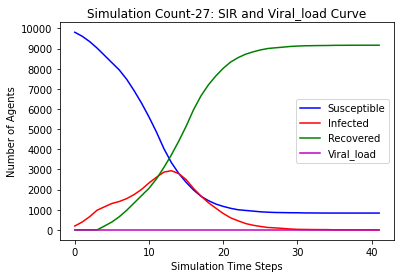

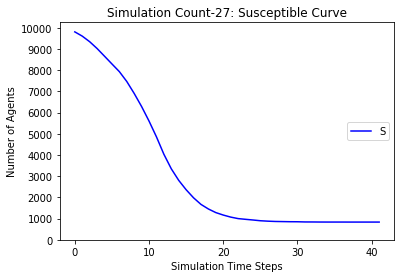

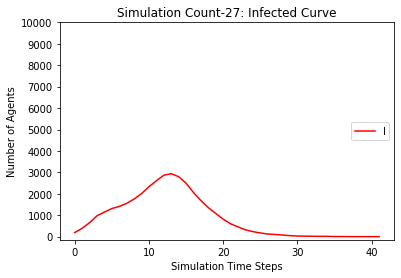

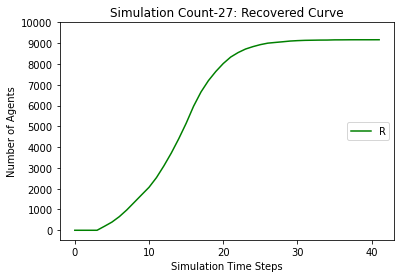

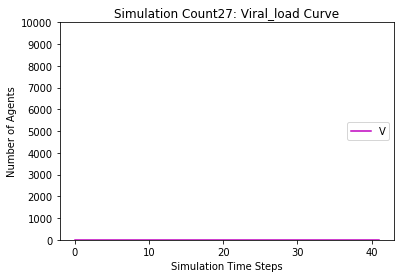

[9807, 9620, 9371, 9057, 8701, 8355, 7957, 7494, 7043, 6456, 5684, 4921, 4129, 3343, 2659, 2108, 1679, 1367, 1138, 970, 881, 821, 780, 761, 736, 723, 714, 709, 697, 695, 693, 693, 693, 693, 692, 692, 692, 692, 692]
[193, 380, 629, 943, 1106, 1265, 1414, 1563, 1658, 1899, 2273, 2573, 2914, 3113, 3025, 2813, 2450, 1976, 1521, 1138, 798, 546, 358, 209, 145, 98, 66, 52, 39, 28, 21, 16, 4, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 380, 629, 943, 1299, 1645, 2043, 2506, 2957, 3544, 4316, 5079, 5871, 6657, 7341, 7892, 8321, 8633, 8862, 9030, 9119, 9179, 9220, 9239, 9264, 9277, 9286, 9291, 9303, 9305, 9307, 9307, 9307, 9307, 9308]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 

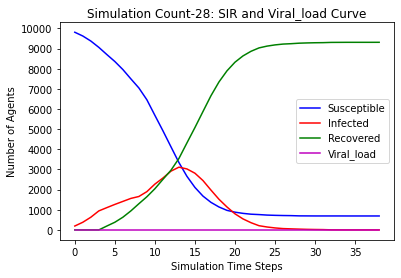

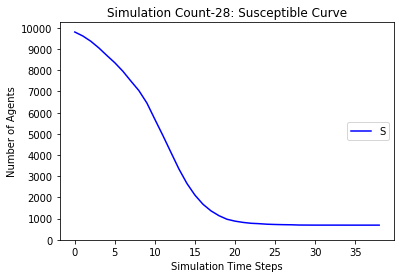

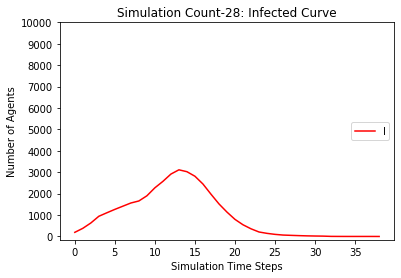

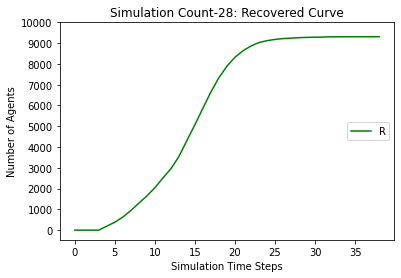

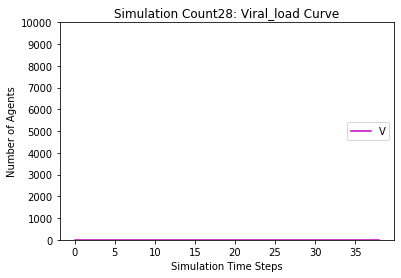

[9807, 9603, 9336, 9014, 8670, 8269, 7825, 7249, 6630, 5994, 5337, 4618, 3913, 3295, 2719, 2208, 1796, 1504, 1298, 1146, 1044, 975, 916, 884, 854, 839, 831, 820, 816, 811, 809, 806, 806, 804, 804, 803, 803, 803, 803, 803]
[193, 397, 664, 986, 1137, 1334, 1511, 1765, 2040, 2275, 2488, 2631, 2717, 2699, 2618, 2410, 2117, 1791, 1421, 1062, 752, 529, 382, 262, 190, 136, 85, 64, 38, 28, 22, 14, 10, 7, 5, 3, 3, 1, 1, 0]
[0, 0, 0, 0, 193, 397, 664, 986, 1330, 1731, 2175, 2751, 3370, 4006, 4663, 5382, 6087, 6705, 7281, 7792, 8204, 8496, 8702, 8854, 8956, 9025, 9084, 9116, 9146, 9161, 9169, 9180, 9184, 9189, 9191, 9194, 9194, 9196, 9196, 9197]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 92

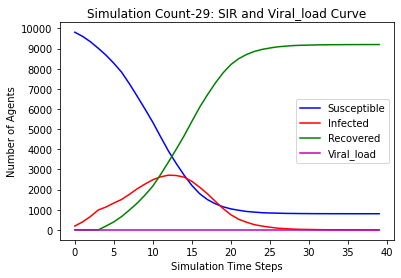

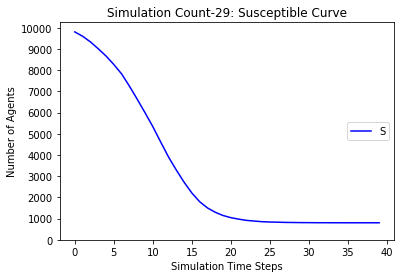

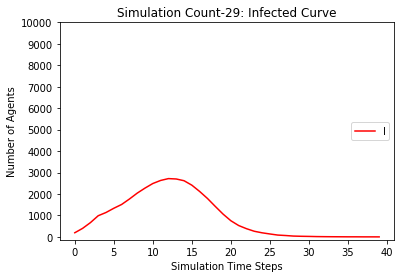

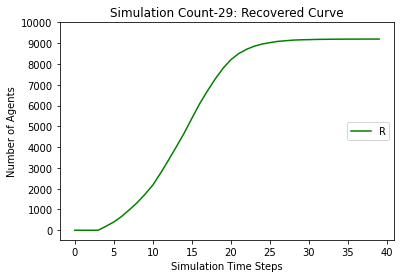

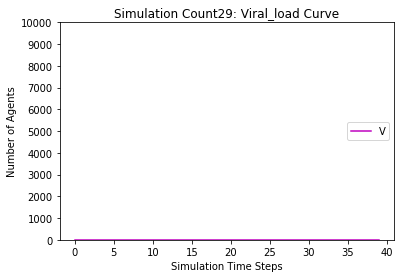

[9807, 9620, 9353, 9023, 8629, 8238, 7726, 7059, 6332, 5521, 4548, 3683, 2974, 2473, 2114, 1716, 1472, 1287, 1157, 1049, 983, 946, 914, 889, 873, 864, 849, 838, 832, 829, 822, 820, 818, 818, 818, 818, 818]
[193, 380, 647, 977, 1178, 1382, 1627, 1964, 2297, 2717, 3178, 3376, 3358, 3048, 2434, 1967, 1502, 1186, 957, 667, 489, 341, 243, 160, 110, 82, 65, 51, 41, 35, 27, 18, 14, 11, 4, 2, 0]
[0, 0, 0, 0, 193, 380, 647, 977, 1371, 1762, 2274, 2941, 3668, 4479, 5452, 6317, 7026, 7527, 7886, 8284, 8528, 8713, 8843, 8951, 9017, 9054, 9086, 9111, 9127, 9136, 9151, 9162, 9168, 9171, 9178, 9180, 9182]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 89

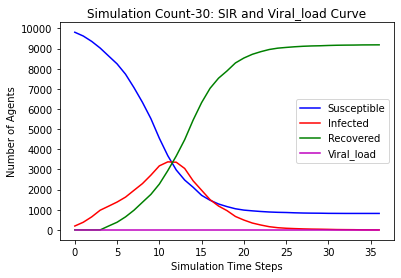

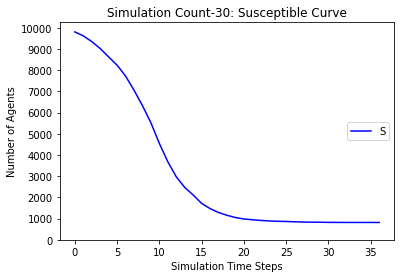

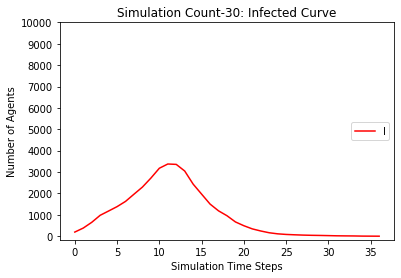

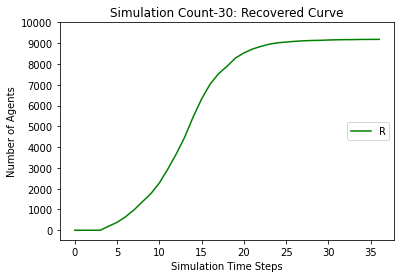

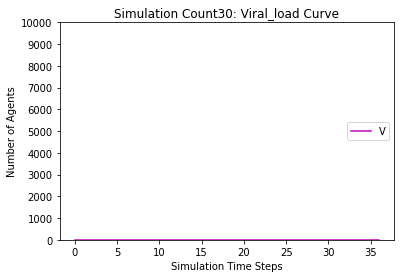

[9807, 9614, 9344, 9015, 8627, 8246, 7811, 7374, 6896, 6332, 5596, 4848, 4123, 3444, 2907, 2450, 2128, 1852, 1646, 1479, 1351, 1256, 1195, 1150, 1113, 1083, 1068, 1058, 1052, 1043, 1038, 1037, 1036, 1036, 1036, 1036, 1036]
[193, 386, 656, 985, 1180, 1368, 1533, 1641, 1731, 1914, 2215, 2526, 2773, 2888, 2689, 2398, 1995, 1592, 1261, 971, 777, 596, 451, 329, 238, 173, 127, 92, 61, 40, 30, 21, 16, 7, 2, 1, 0]
[0, 0, 0, 0, 193, 386, 656, 985, 1373, 1754, 2189, 2626, 3104, 3668, 4404, 5152, 5877, 6556, 7093, 7550, 7872, 8148, 8354, 8521, 8649, 8744, 8805, 8850, 8887, 8917, 8932, 8942, 8948, 8957, 8962, 8963, 8964]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896

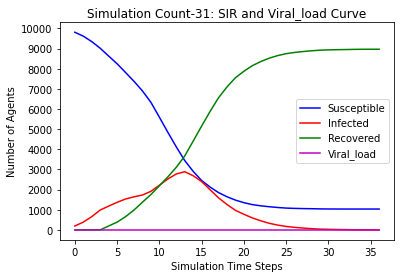

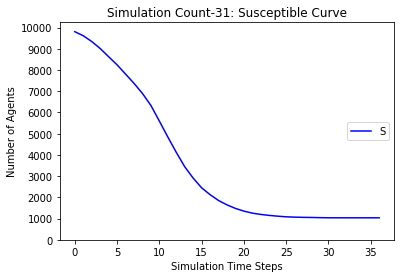

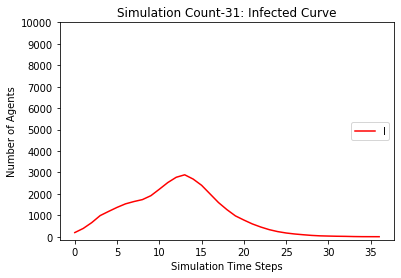

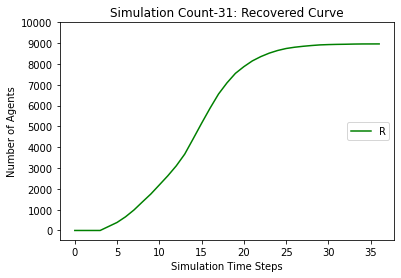

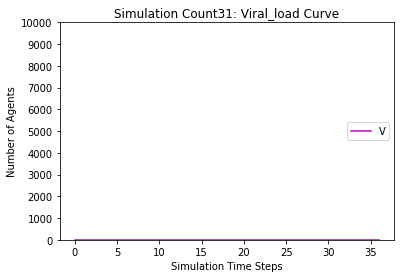

[9807, 9607, 9339, 9033, 8693, 8362, 8050, 7733, 7340, 6918, 6408, 5866, 5278, 4613, 3900, 3296, 2735, 2278, 1851, 1566, 1342, 1209, 1089, 998, 943, 919, 900, 888, 880, 873, 869, 863, 861, 858, 857, 856, 856, 856, 856, 856]
[193, 393, 661, 967, 1114, 1245, 1289, 1300, 1353, 1444, 1642, 1867, 2062, 2305, 2508, 2570, 2543, 2335, 2049, 1730, 1393, 1069, 762, 568, 399, 290, 189, 110, 63, 46, 31, 25, 19, 15, 12, 7, 5, 2, 1, 0]
[0, 0, 0, 0, 193, 393, 661, 967, 1307, 1638, 1950, 2267, 2660, 3082, 3592, 4134, 4722, 5387, 6100, 6704, 7265, 7722, 8149, 8434, 8658, 8791, 8911, 9002, 9057, 9081, 9100, 9112, 9120, 9127, 9131, 9137, 9139, 9142, 9143, 9144]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992,

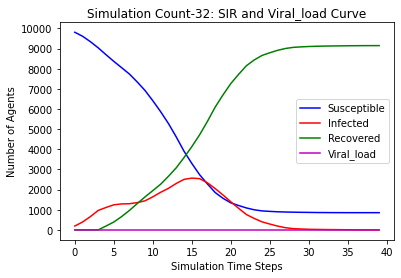

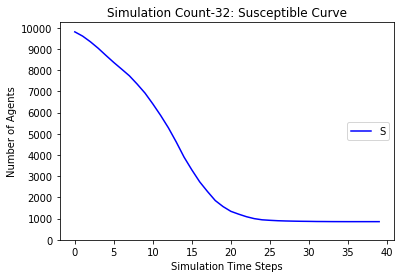

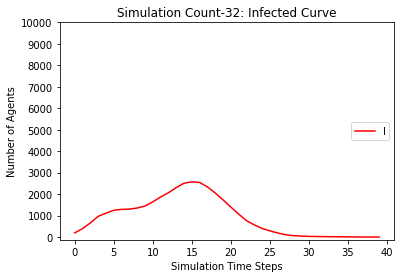

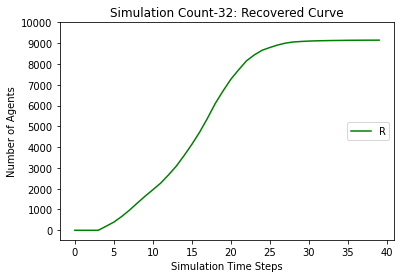

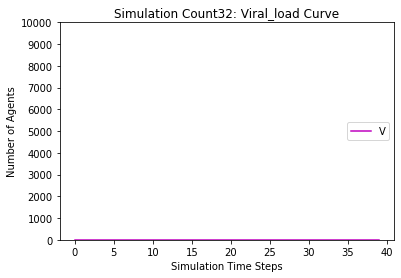

[9807, 9608, 9362, 9062, 8725, 8395, 8031, 7594, 7083, 6483, 5868, 5238, 4609, 4059, 3442, 2957, 2523, 2142, 1820, 1607, 1436, 1299, 1185, 1117, 1067, 1029, 1008, 992, 978, 966, 964, 962, 961, 958, 955, 955, 955, 955, 955]
[193, 392, 638, 938, 1082, 1213, 1331, 1468, 1642, 1912, 2163, 2356, 2474, 2424, 2426, 2281, 2086, 1917, 1622, 1350, 1087, 843, 635, 490, 369, 270, 177, 125, 89, 63, 44, 30, 17, 8, 9, 7, 6, 3, 0]
[0, 0, 0, 0, 193, 392, 638, 938, 1275, 1605, 1969, 2406, 2917, 3517, 4132, 4762, 5391, 5941, 6558, 7043, 7477, 7858, 8180, 8393, 8564, 8701, 8815, 8883, 8933, 8971, 8992, 9008, 9022, 9034, 9036, 9038, 9039, 9042, 9045]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 91

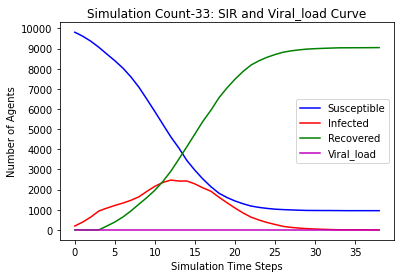

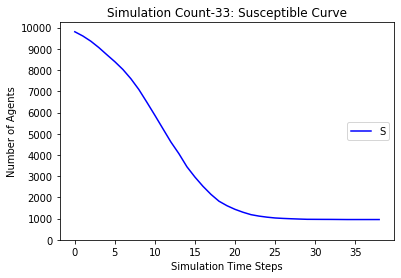

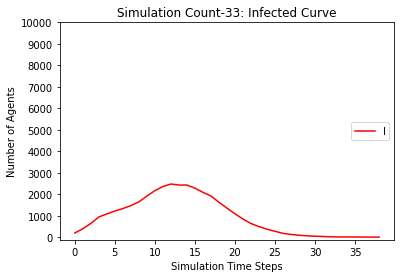

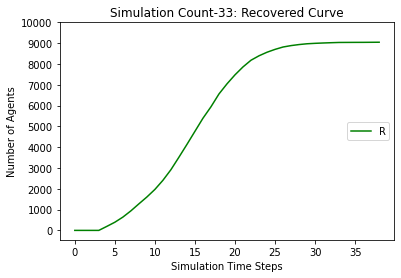

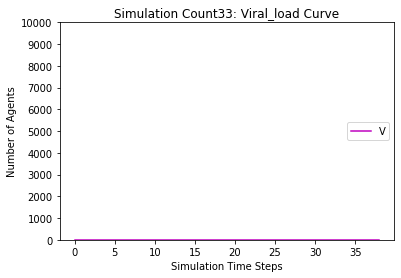

[9807, 9631, 9360, 9028, 8660, 8282, 7847, 7314, 6727, 6056, 5323, 4566, 3804, 3078, 2496, 1984, 1633, 1293, 1099, 985, 886, 796, 735, 688, 666, 652, 639, 632, 630, 629, 629, 628, 627, 627, 627, 627, 627]
[193, 369, 640, 972, 1147, 1349, 1513, 1714, 1933, 2226, 2524, 2748, 2923, 2978, 2827, 2582, 2171, 1785, 1397, 999, 747, 497, 364, 297, 220, 144, 96, 56, 36, 23, 10, 4, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 193, 369, 640, 972, 1340, 1718, 2153, 2686, 3273, 3944, 4677, 5434, 6196, 6922, 7504, 8016, 8367, 8707, 8901, 9015, 9114, 9204, 9265, 9312, 9334, 9348, 9361, 9368, 9370, 9371, 9371, 9372, 9373]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895,

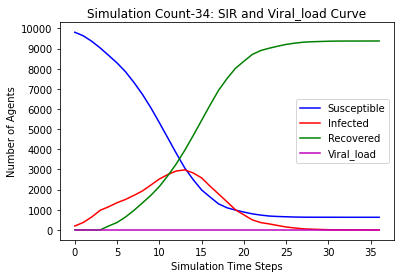

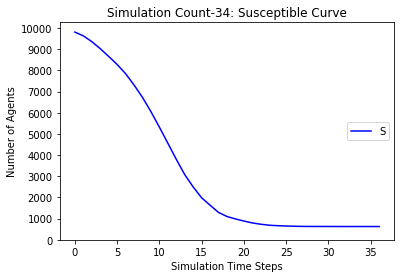

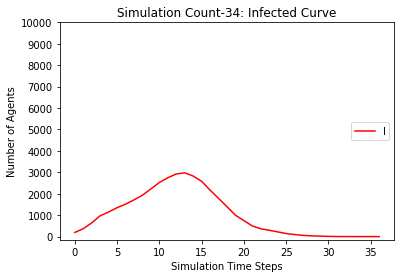

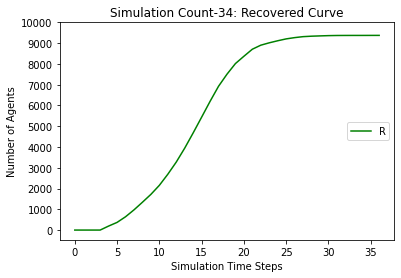

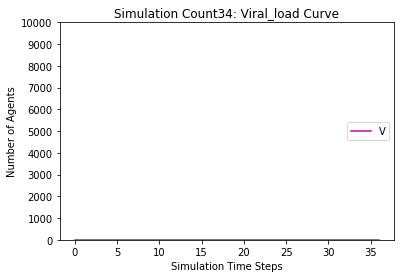

[9807, 9625, 9358, 9063, 8734, 8397, 7977, 7469, 6917, 6344, 5727, 5101, 4430, 3862, 3338, 2877, 2475, 2117, 1810, 1633, 1492, 1377, 1307, 1255, 1218, 1183, 1171, 1155, 1146, 1137, 1133, 1129, 1129, 1128, 1127, 1127, 1127, 1127, 1127]
[193, 375, 642, 937, 1073, 1228, 1381, 1594, 1817, 2053, 2250, 2368, 2487, 2482, 2389, 2224, 1955, 1745, 1528, 1244, 983, 740, 503, 378, 274, 194, 136, 100, 72, 46, 38, 26, 17, 9, 6, 2, 2, 1, 0]
[0, 0, 0, 0, 193, 375, 642, 937, 1266, 1603, 2023, 2531, 3083, 3656, 4273, 4899, 5570, 6138, 6662, 7123, 7525, 7883, 8190, 8367, 8508, 8623, 8693, 8745, 8782, 8817, 8829, 8845, 8854, 8863, 8867, 8871, 8871, 8872, 8873]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 9

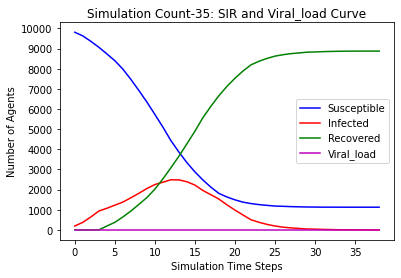

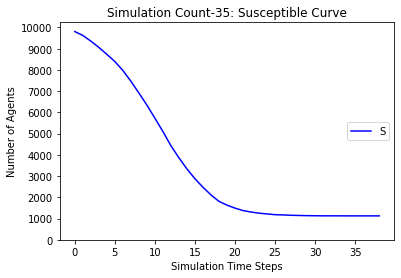

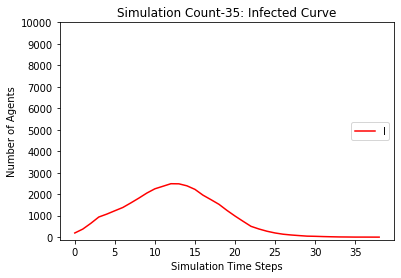

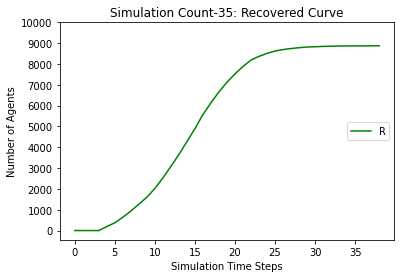

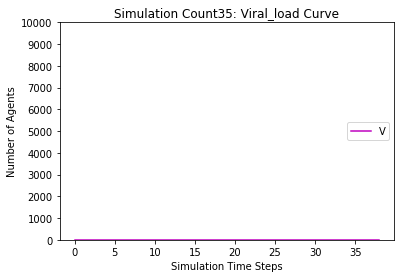

[9807, 9615, 9369, 9064, 8726, 8381, 7976, 7437, 6849, 6207, 5508, 4746, 3945, 3247, 2630, 2083, 1642, 1367, 1120, 966, 873, 807, 759, 733, 720, 708, 702, 694, 694, 692, 692, 692, 692, 692]
[193, 385, 631, 936, 1081, 1234, 1393, 1627, 1877, 2174, 2468, 2691, 2904, 2960, 2878, 2663, 2303, 1880, 1510, 1117, 769, 560, 361, 233, 153, 99, 57, 39, 26, 16, 10, 2, 2, 0]
[0, 0, 0, 0, 193, 385, 631, 936, 1274, 1619, 2024, 2563, 3151, 3793, 4492, 5254, 6055, 6753, 7370, 7917, 8358, 8633, 8880, 9034, 9127, 9193, 9241, 9267, 9280, 9292, 9298, 9306, 9306, 9308]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 76

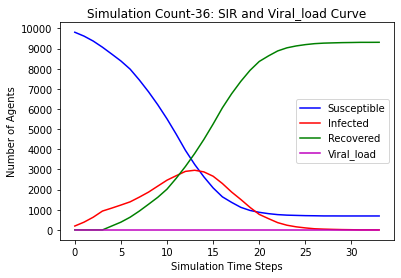

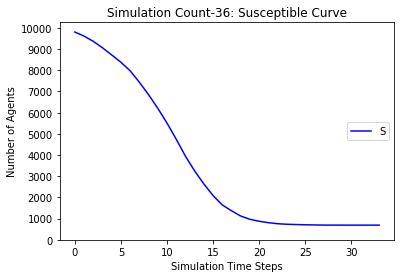

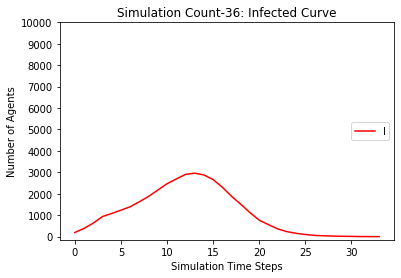

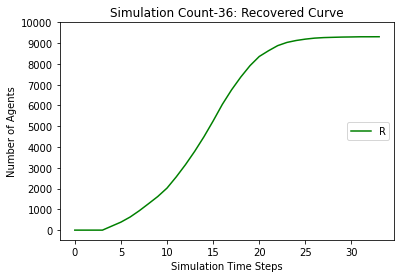

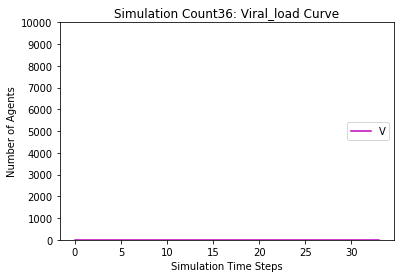

[9807, 9622, 9355, 9013, 8618, 8211, 7751, 7156, 6452, 5736, 4957, 4103, 3316, 2617, 2027, 1552, 1244, 1035, 868, 765, 707, 671, 654, 643, 628, 625, 623, 621, 620, 620, 619, 619, 619, 619, 619]
[193, 378, 645, 987, 1189, 1411, 1604, 1857, 2166, 2475, 2794, 3053, 3136, 3119, 2930, 2551, 2072, 1582, 1159, 787, 537, 364, 214, 122, 79, 46, 31, 22, 8, 5, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 378, 645, 987, 1382, 1789, 2249, 2844, 3548, 4264, 5043, 5897, 6684, 7383, 7973, 8448, 8756, 8965, 9132, 9235, 9293, 9329, 9346, 9357, 9372, 9375, 9377, 9379, 9380, 9380, 9381]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8

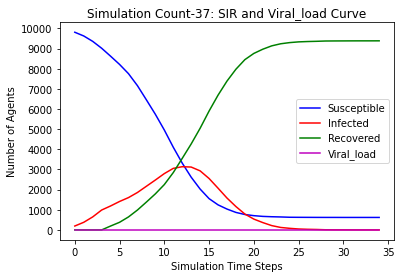

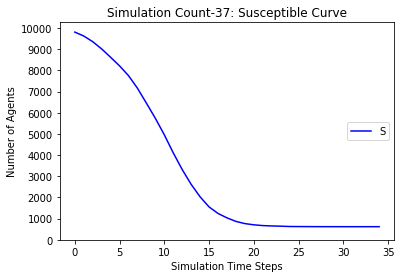

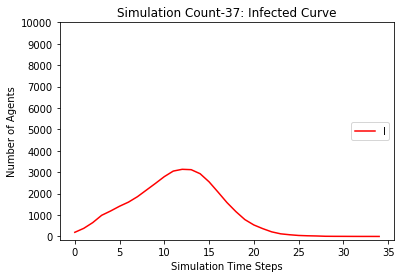

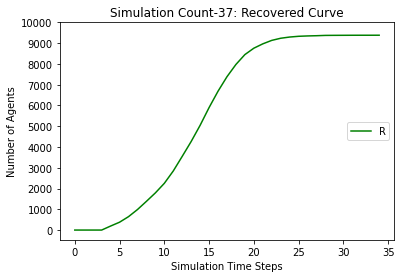

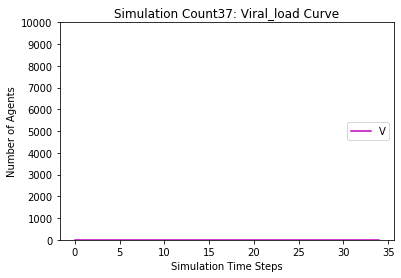

[9807, 9626, 9368, 9042, 8661, 8266, 7864, 7330, 6628, 5827, 5004, 4257, 3433, 2730, 2157, 1753, 1399, 1138, 962, 868, 796, 746, 710, 684, 669, 661, 654, 652, 652, 652, 652, 652]
[193, 374, 632, 958, 1146, 1360, 1504, 1712, 2033, 2439, 2860, 3073, 3195, 3097, 2847, 2504, 2034, 1592, 1195, 885, 603, 392, 252, 184, 127, 85, 56, 32, 17, 9, 2, 0]
[0, 0, 0, 0, 193, 374, 632, 958, 1339, 1734, 2136, 2670, 3372, 4173, 4996, 5743, 6567, 7270, 7843, 8247, 8601, 8862, 9038, 9132, 9204, 9254, 9290, 9316, 9331, 9339, 9346, 9348]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7238, 6750, 6256, 5765, 5284, 4727, 42

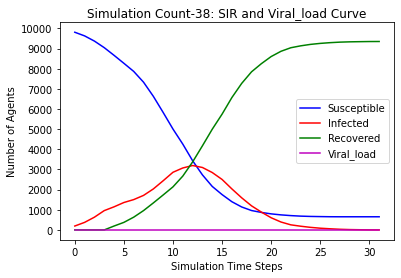

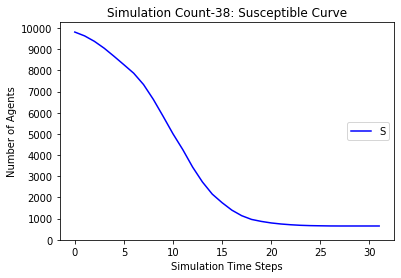

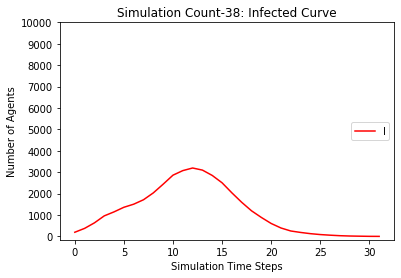

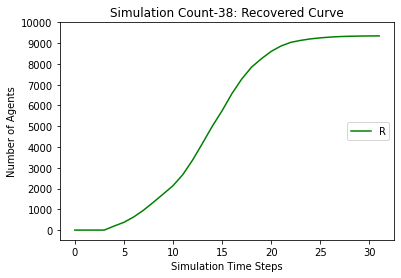

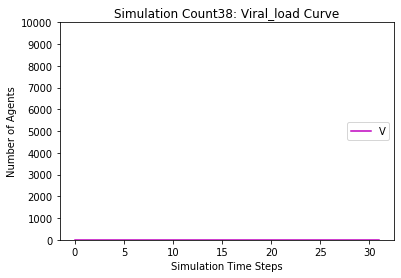

[9807, 9615, 9350, 9029, 8624, 8220, 7700, 7068, 6403, 5686, 4861, 3982, 3239, 2517, 1938, 1511, 1250, 1041, 898, 795, 729, 688, 649, 632, 621, 613, 610, 603, 601, 600, 597, 596, 595, 595, 594, 594, 594, 594, 594]
[193, 385, 650, 971, 1183, 1395, 1650, 1961, 2221, 2534, 2839, 3086, 3164, 3169, 2923, 2471, 1989, 1476, 1040, 716, 521, 353, 249, 163, 108, 75, 39, 29, 20, 13, 13, 7, 6, 5, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 385, 650, 971, 1376, 1780, 2300, 2932, 3597, 4314, 5139, 6018, 6761, 7483, 8062, 8489, 8750, 8959, 9102, 9205, 9271, 9312, 9351, 9368, 9379, 9387, 9390, 9397, 9399, 9400, 9403, 9404, 9405, 9405, 9406]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901

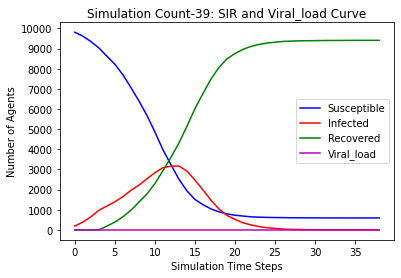

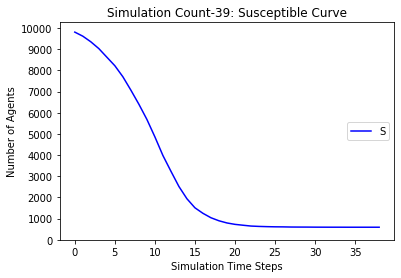

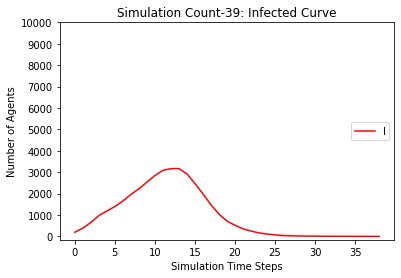

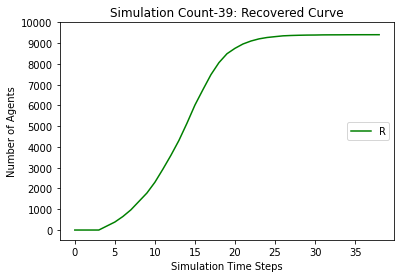

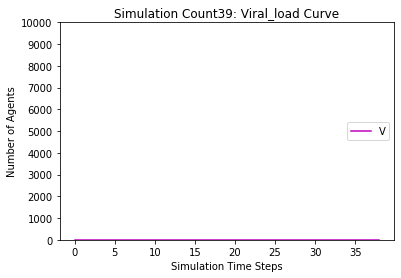

[9807, 9624, 9376, 9050, 8673, 8252, 7797, 7234, 6600, 5811, 5042, 4168, 3434, 2799, 2278, 1862, 1557, 1325, 1152, 1008, 907, 859, 831, 805, 790, 783, 776, 770, 766, 763, 763, 763, 762, 760, 759, 759, 758, 757, 757, 757, 757, 757]
[193, 376, 624, 950, 1134, 1372, 1579, 1816, 2073, 2441, 2755, 3066, 3166, 3012, 2764, 2306, 1877, 1474, 1126, 854, 650, 466, 321, 203, 117, 76, 55, 35, 24, 20, 13, 7, 4, 3, 4, 4, 4, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 193, 376, 624, 950, 1327, 1748, 2203, 2766, 3400, 4189, 4958, 5832, 6566, 7201, 7722, 8138, 8443, 8675, 8848, 8992, 9093, 9141, 9169, 9195, 9210, 9217, 9224, 9230, 9234, 9237, 9237, 9237, 9238, 9240, 9241, 9241, 9242, 9243]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 126

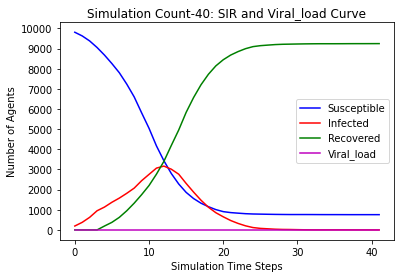

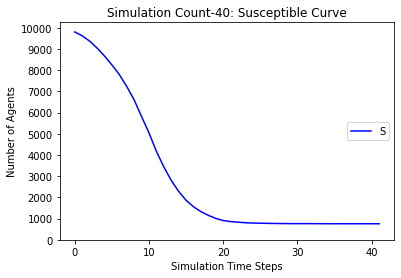

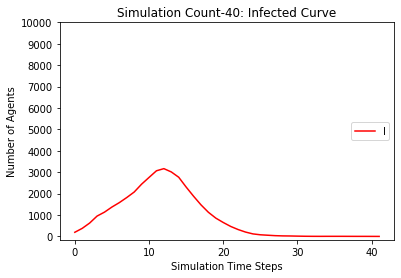

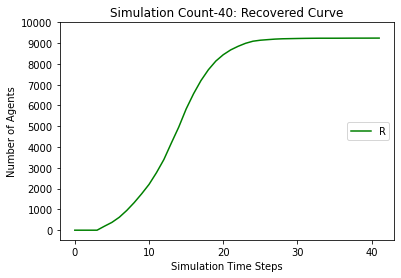

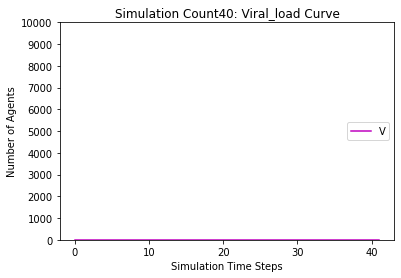

[9807, 9622, 9352, 9052, 8738, 8418, 7970, 7425, 6803, 6134, 5404, 4704, 3966, 3253, 2600, 2114, 1713, 1436, 1205, 1047, 937, 849, 800, 761, 742, 728, 720, 714, 708, 706, 703, 703, 702, 702, 702, 702, 702]
[193, 378, 648, 948, 1069, 1204, 1382, 1627, 1935, 2284, 2566, 2721, 2837, 2881, 2804, 2590, 2253, 1817, 1395, 1067, 776, 587, 405, 286, 195, 121, 80, 47, 34, 22, 17, 11, 6, 4, 1, 1, 0]
[0, 0, 0, 0, 193, 378, 648, 948, 1262, 1582, 2030, 2575, 3197, 3866, 4596, 5296, 6034, 6747, 7400, 7886, 8287, 8564, 8795, 8953, 9063, 9151, 9200, 9239, 9258, 9272, 9280, 9286, 9292, 9294, 9297, 9297, 9298]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 8

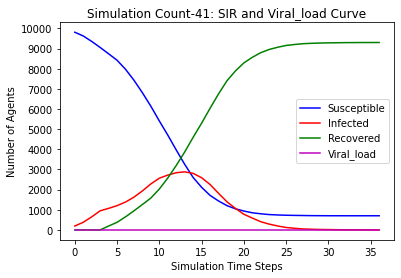

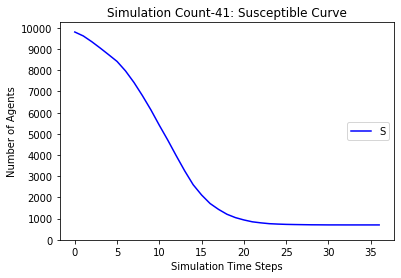

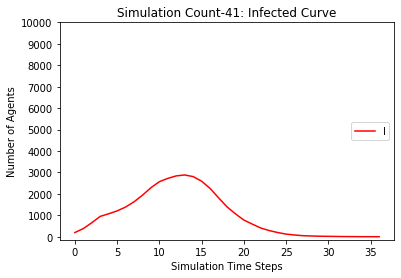

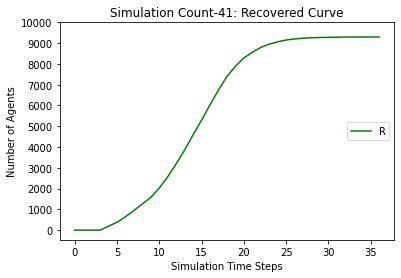

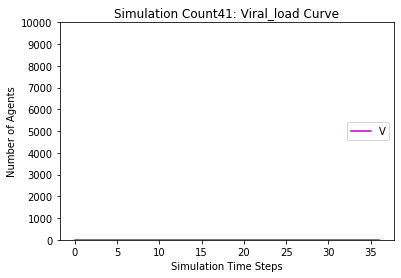

[9807, 9635, 9386, 9060, 8690, 8304, 7850, 7344, 6725, 5929, 5127, 4300, 3458, 2799, 2266, 1865, 1544, 1298, 1167, 1084, 1016, 978, 958, 942, 916, 902, 895, 890, 887, 886, 885, 884, 883, 883, 883, 883, 883]
[193, 365, 614, 940, 1117, 1331, 1536, 1716, 1965, 2375, 2723, 3044, 3267, 3130, 2861, 2435, 1914, 1501, 1099, 781, 528, 320, 209, 142, 100, 76, 63, 52, 29, 16, 10, 6, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 193, 365, 614, 940, 1310, 1696, 2150, 2656, 3275, 4071, 4873, 5700, 6542, 7201, 7734, 8135, 8456, 8702, 8833, 8916, 8984, 9022, 9042, 9058, 9084, 9098, 9105, 9110, 9113, 9114, 9115, 9116, 9117]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895

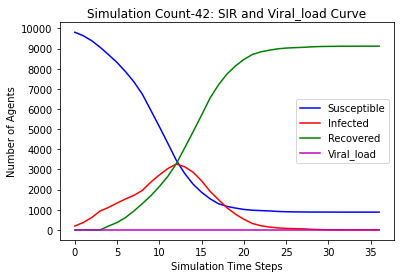

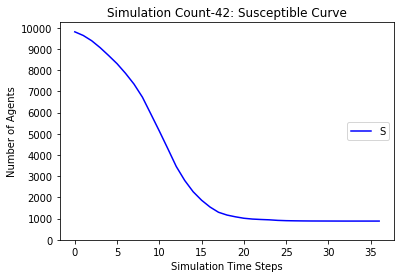

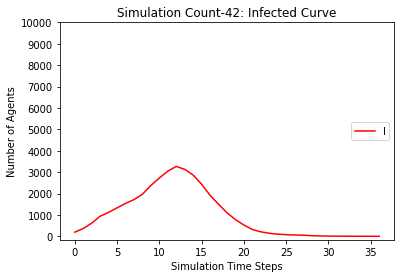

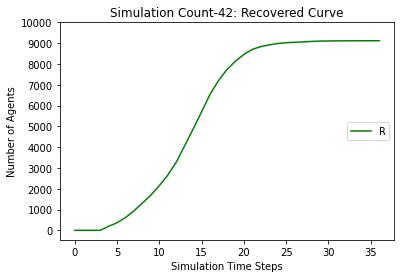

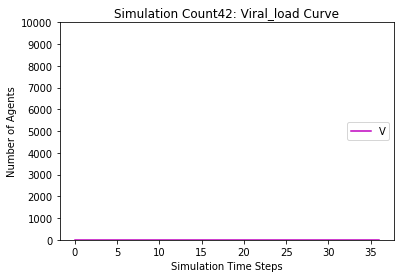

[9807, 9616, 9358, 9030, 8587, 8051, 7429, 6807, 6071, 5200, 4240, 3392, 2679, 2031, 1612, 1323, 1058, 905, 793, 725, 690, 673, 663, 656, 653, 647, 645, 643, 641, 641, 640, 640, 640, 639, 639, 639, 639, 639]
[193, 384, 642, 970, 1220, 1565, 1929, 2223, 2516, 2851, 3189, 3415, 3392, 3169, 2628, 2069, 1621, 1126, 819, 598, 368, 232, 130, 69, 37, 26, 18, 13, 12, 6, 5, 3, 1, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 384, 642, 970, 1413, 1949, 2571, 3193, 3929, 4800, 5760, 6608, 7321, 7969, 8388, 8677, 8942, 9095, 9207, 9275, 9310, 9327, 9337, 9344, 9347, 9353, 9355, 9357, 9359, 9359, 9360, 9360, 9360, 9361]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895

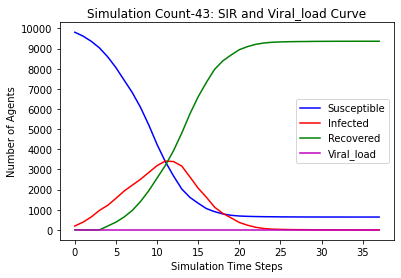

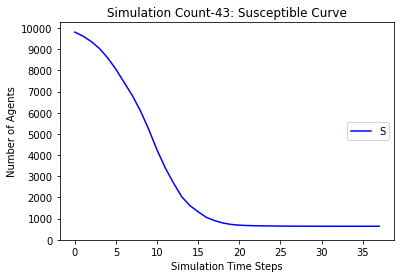

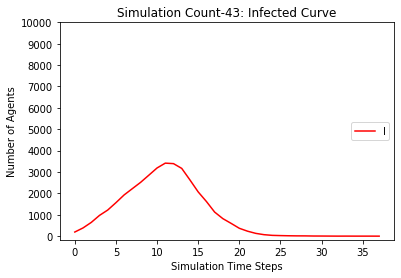

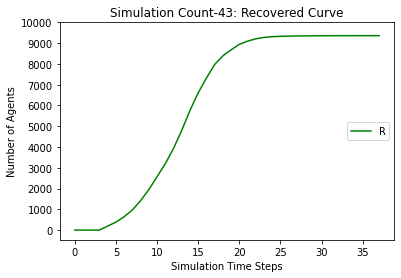

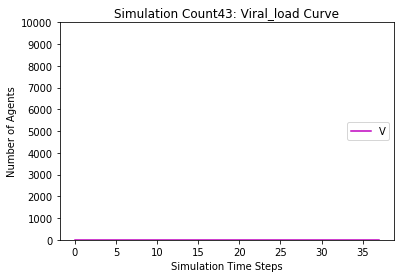

[9807, 9603, 9347, 9049, 8729, 8400, 8010, 7586, 6999, 6369, 5769, 5142, 4431, 3856, 3295, 2813, 2378, 2007, 1743, 1562, 1380, 1272, 1177, 1118, 1071, 1024, 1000, 989, 977, 967, 962, 958, 957, 955, 954, 953, 951, 951, 951, 951, 951]
[193, 397, 653, 951, 1078, 1203, 1337, 1463, 1730, 2031, 2241, 2444, 2568, 2513, 2474, 2329, 2053, 1849, 1552, 1251, 998, 735, 566, 444, 309, 248, 177, 129, 94, 57, 38, 31, 20, 12, 8, 5, 6, 4, 3, 2, 0]
[0, 0, 0, 0, 193, 397, 653, 951, 1271, 1600, 1990, 2414, 3001, 3631, 4231, 4858, 5569, 6144, 6705, 7187, 7622, 7993, 8257, 8438, 8620, 8728, 8823, 8882, 8929, 8976, 9000, 9011, 9023, 9033, 9038, 9042, 9043, 9045, 9046, 9047, 9049]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 11

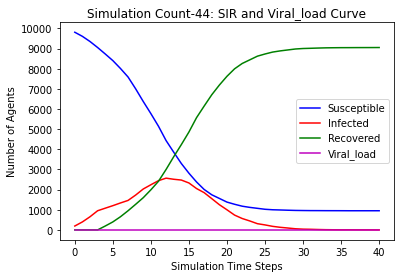

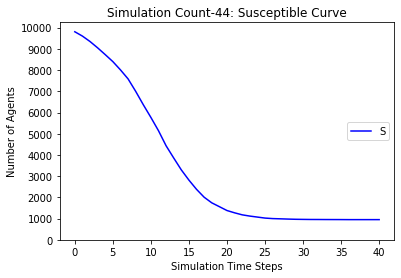

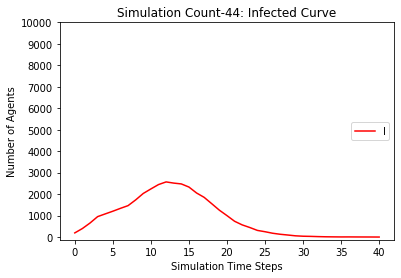

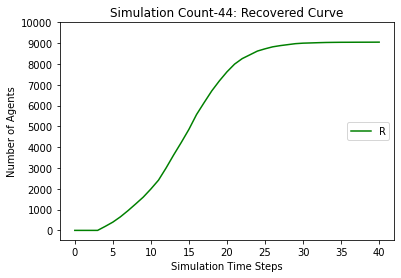

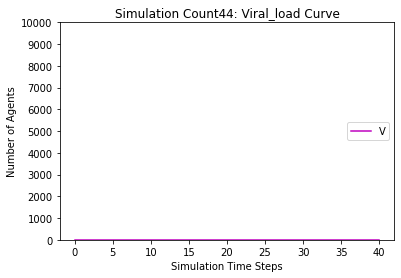

[9807, 9627, 9377, 9046, 8714, 8373, 7937, 7455, 6816, 6110, 5387, 4622, 3969, 3363, 2772, 2296, 1921, 1633, 1458, 1315, 1189, 1104, 1043, 1005, 976, 962, 952, 944, 940, 938, 936, 936, 935, 935, 934, 933, 932, 932, 932, 932, 931, 931, 931, 931, 931]
[193, 373, 623, 954, 1093, 1254, 1440, 1591, 1898, 2263, 2550, 2833, 2847, 2747, 2615, 2326, 2048, 1730, 1314, 981, 732, 529, 415, 310, 213, 142, 91, 61, 36, 24, 16, 8, 5, 3, 2, 3, 3, 3, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 373, 623, 954, 1286, 1627, 2063, 2545, 3184, 3890, 4613, 5378, 6031, 6637, 7228, 7704, 8079, 8367, 8542, 8685, 8811, 8896, 8957, 8995, 9024, 9038, 9048, 9056, 9060, 9062, 9064, 9064, 9065, 9065, 9066, 9067, 9068, 9068, 9068, 9068, 9069]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6

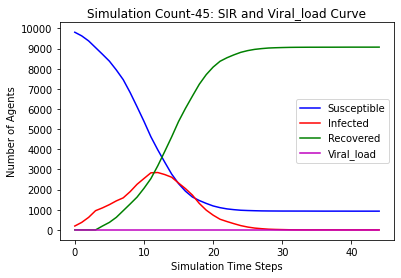

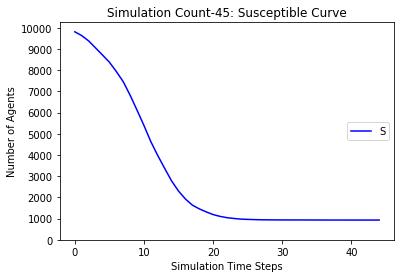

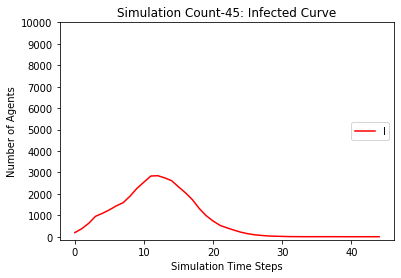

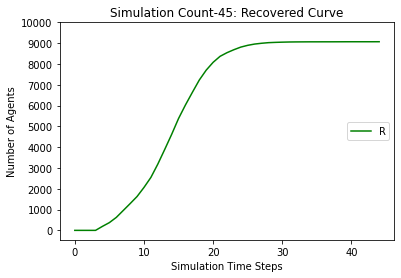

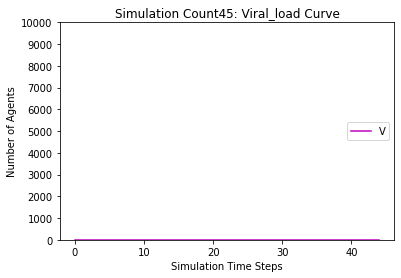

[9807, 9625, 9367, 9038, 8665, 8274, 7805, 7265, 6656, 5955, 5218, 4518, 3782, 3078, 2493, 2046, 1659, 1412, 1254, 1120, 1018, 949, 912, 878, 853, 838, 828, 824, 822, 820, 820, 820, 820, 820]
[193, 375, 633, 962, 1142, 1351, 1562, 1773, 2009, 2319, 2587, 2747, 2874, 2877, 2725, 2472, 2123, 1666, 1239, 926, 641, 463, 342, 242, 165, 111, 84, 54, 31, 18, 8, 4, 2, 0]
[0, 0, 0, 0, 193, 375, 633, 962, 1335, 1726, 2195, 2735, 3344, 4045, 4782, 5482, 6218, 6922, 7507, 7954, 8341, 8588, 8746, 8880, 8982, 9051, 9088, 9122, 9147, 9162, 9172, 9176, 9178, 9180]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7

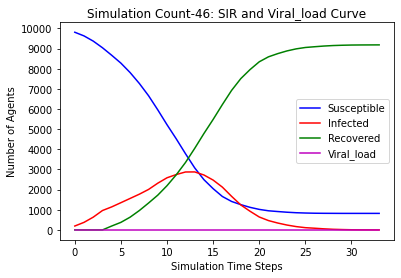

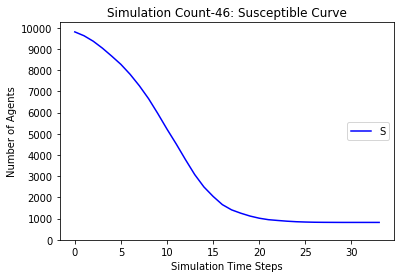

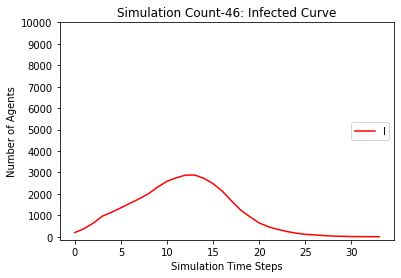

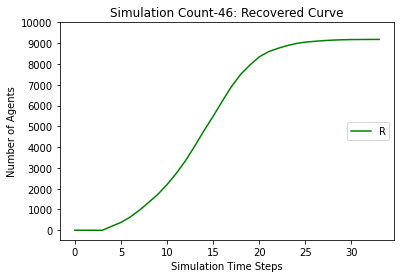

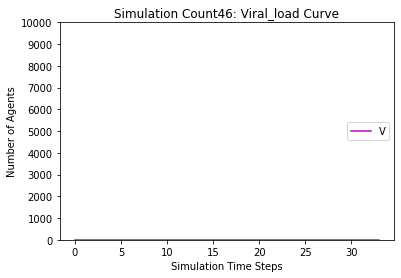

[9807, 9632, 9377, 9094, 8746, 8379, 7900, 7346, 6717, 6006, 5284, 4539, 3825, 3121, 2567, 2205, 1839, 1587, 1381, 1225, 1122, 1055, 1002, 964, 937, 913, 899, 886, 878, 874, 873, 870, 869, 869, 869, 869, 869]
[193, 368, 623, 906, 1061, 1253, 1477, 1748, 2029, 2373, 2616, 2807, 2892, 2885, 2717, 2334, 1986, 1534, 1186, 980, 717, 532, 379, 261, 185, 142, 103, 78, 59, 39, 26, 16, 9, 5, 4, 1, 0]
[0, 0, 0, 0, 193, 368, 623, 906, 1254, 1621, 2100, 2654, 3283, 3994, 4716, 5461, 6175, 6879, 7433, 7795, 8161, 8413, 8619, 8775, 8878, 8945, 8998, 9036, 9063, 9087, 9101, 9114, 9122, 9126, 9127, 9130, 9131]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895

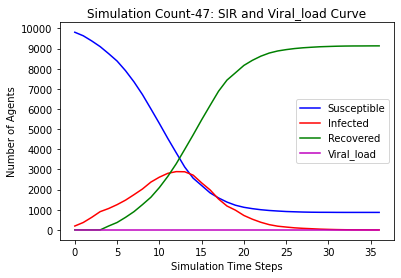

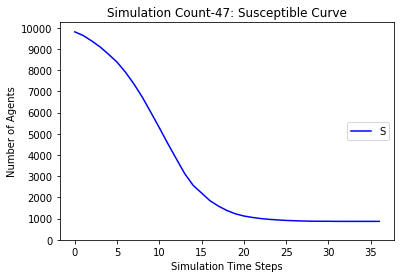

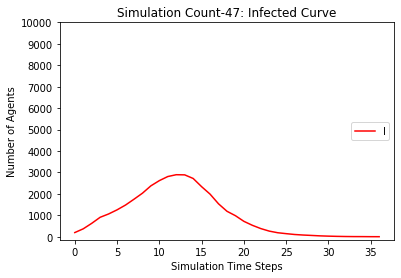

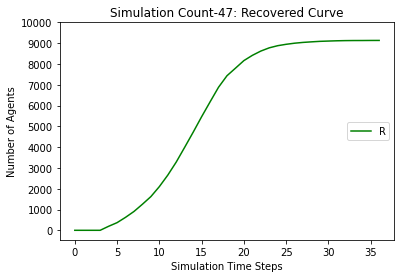

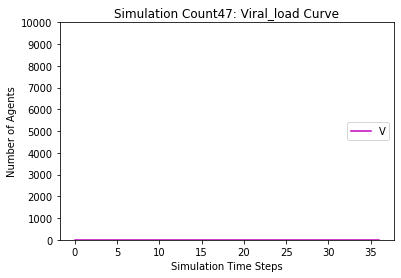

[9807, 9625, 9356, 9055, 8697, 8352, 7915, 7397, 6786, 6056, 5344, 4576, 3823, 3095, 2457, 1982, 1616, 1349, 1164, 1032, 929, 876, 831, 798, 772, 751, 748, 744, 744, 744, 743, 743, 743, 743, 743]
[193, 375, 644, 945, 1110, 1273, 1441, 1658, 1911, 2296, 2571, 2821, 2963, 2961, 2887, 2594, 2207, 1746, 1293, 950, 687, 473, 333, 234, 157, 125, 83, 54, 28, 7, 5, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 375, 644, 945, 1303, 1648, 2085, 2603, 3214, 3944, 4656, 5424, 6177, 6905, 7543, 8018, 8384, 8651, 8836, 8968, 9071, 9124, 9169, 9202, 9228, 9249, 9252, 9256, 9256, 9256, 9257]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 87

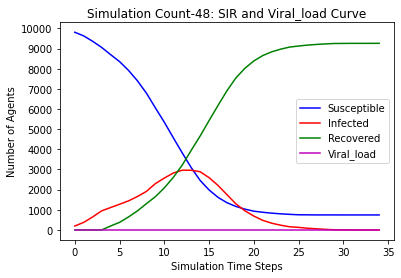

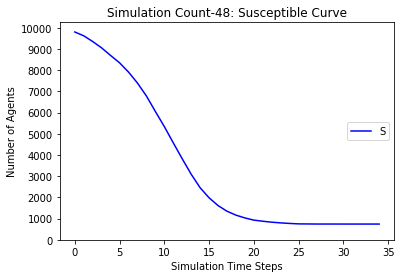

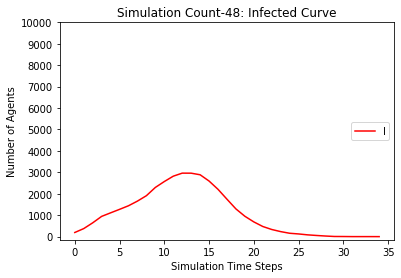

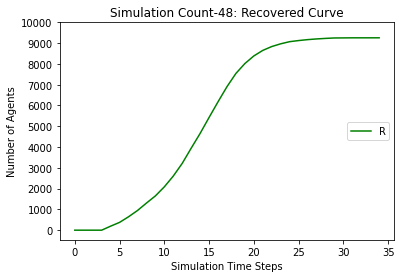

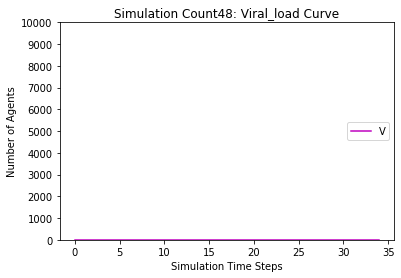

[9807, 9629, 9375, 9044, 8626, 8235, 7801, 7140, 6468, 5737, 4868, 4140, 3398, 2655, 2089, 1706, 1388, 1187, 1039, 953, 888, 835, 799, 783, 770, 766, 762, 760, 758, 757, 756, 756, 756, 756, 756]
[193, 371, 625, 956, 1181, 1394, 1574, 1904, 2158, 2498, 2933, 3000, 3070, 3082, 2779, 2434, 2010, 1468, 1050, 753, 500, 352, 240, 170, 118, 69, 37, 23, 12, 9, 6, 4, 2, 1, 0]
[0, 0, 0, 0, 193, 371, 625, 956, 1374, 1765, 2199, 2860, 3532, 4263, 5132, 5860, 6602, 7345, 7911, 8294, 8612, 8813, 8961, 9047, 9112, 9165, 9201, 9217, 9230, 9234, 9238, 9240, 9242, 9243, 9244]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736

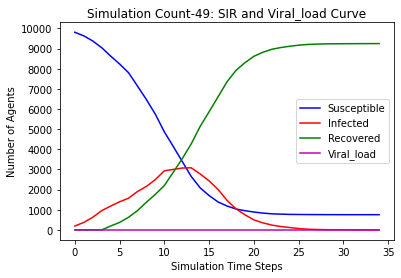

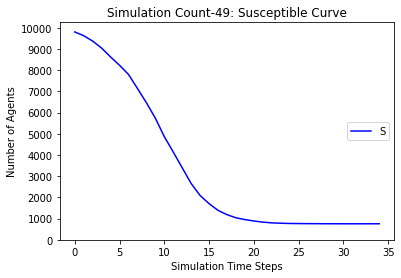

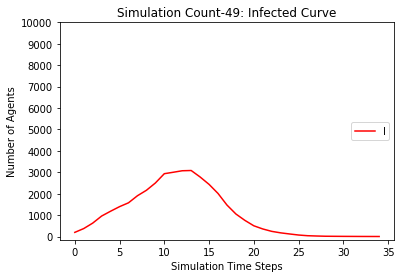

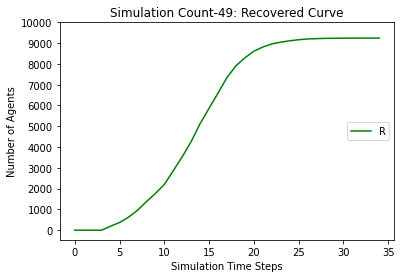

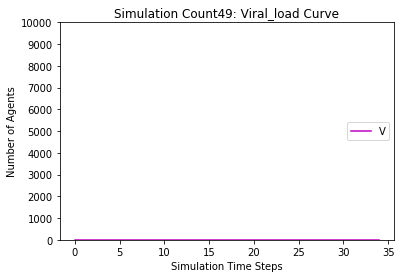

[9807, 9621, 9360, 9061, 8687, 8335, 7916, 7417, 6874, 6230, 5497, 4729, 4008, 3224, 2631, 2119, 1720, 1423, 1205, 1047, 958, 892, 841, 815, 789, 766, 756, 751, 745, 742, 739, 739, 739, 737, 735, 732, 732, 732, 732, 732]
[193, 379, 640, 939, 1120, 1286, 1444, 1644, 1813, 2105, 2419, 2688, 2866, 3006, 2866, 2610, 2288, 1801, 1426, 1072, 762, 531, 364, 232, 169, 126, 85, 64, 44, 24, 17, 12, 6, 5, 4, 7, 7, 5, 3, 0]
[0, 0, 0, 0, 193, 379, 640, 939, 1313, 1665, 2084, 2583, 3126, 3770, 4503, 5271, 5992, 6776, 7369, 7881, 8280, 8577, 8795, 8953, 9042, 9108, 9159, 9185, 9211, 9234, 9244, 9249, 9255, 9258, 9261, 9261, 9261, 9263, 9265, 9268]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929,

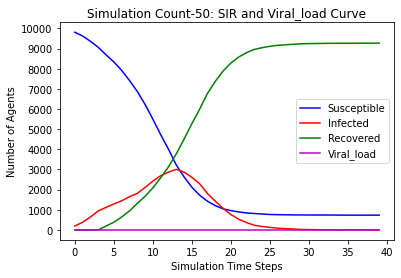

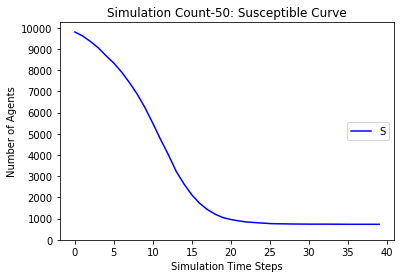

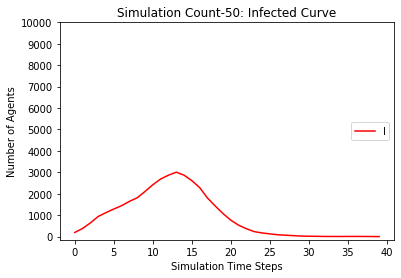

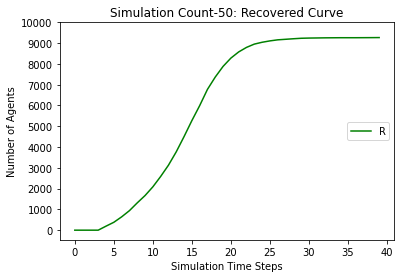

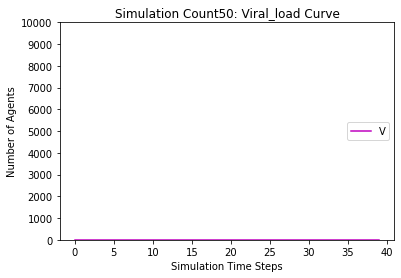

[9807, 9652, 9393, 9076, 8709, 8306, 7877, 7451, 6844, 6082, 5350, 4633, 3982, 3391, 2878, 2436, 2072, 1765, 1516, 1328, 1199, 1111, 1058, 997, 962, 934, 918, 904, 899, 893, 888, 885, 884, 884, 884, 884, 884]
[193, 348, 607, 924, 1098, 1346, 1516, 1625, 1865, 2224, 2527, 2818, 2862, 2691, 2472, 2197, 1910, 1626, 1362, 1108, 873, 654, 458, 331, 237, 177, 140, 93, 63, 41, 30, 19, 15, 9, 4, 1, 0]
[0, 0, 0, 0, 193, 348, 607, 924, 1291, 1694, 2123, 2549, 3156, 3918, 4650, 5367, 6018, 6609, 7122, 7564, 7928, 8235, 8484, 8672, 8801, 8889, 8942, 9003, 9038, 9066, 9082, 9096, 9101, 9107, 9112, 9115, 9116]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 8

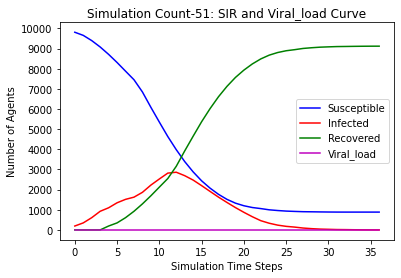

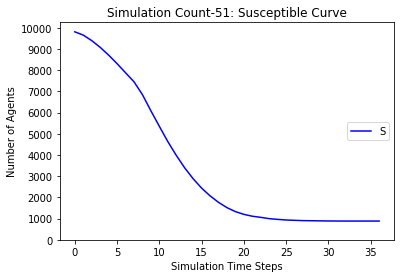

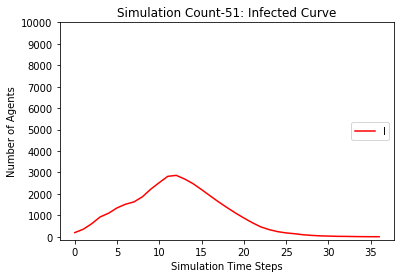

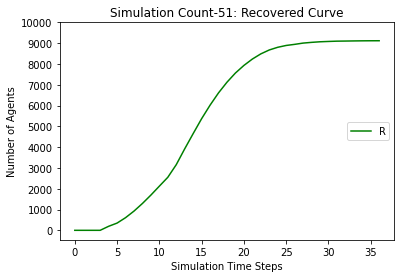

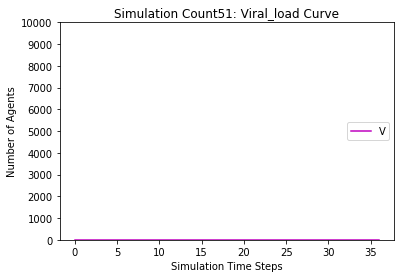

[9807, 9624, 9379, 9051, 8694, 8340, 7929, 7477, 7009, 6480, 5885, 5216, 4537, 3911, 3238, 2686, 2211, 1880, 1633, 1418, 1264, 1132, 1062, 1002, 951, 920, 896, 880, 868, 859, 857, 857, 856, 856, 856, 856, 856]
[193, 376, 621, 949, 1113, 1284, 1450, 1574, 1685, 1860, 2044, 2261, 2472, 2569, 2647, 2530, 2326, 2031, 1605, 1268, 947, 748, 571, 416, 313, 212, 166, 122, 83, 61, 39, 23, 12, 3, 1, 1, 0]
[0, 0, 0, 0, 193, 376, 621, 949, 1306, 1660, 2071, 2523, 2991, 3520, 4115, 4784, 5463, 6089, 6762, 7314, 7789, 8120, 8367, 8582, 8736, 8868, 8938, 8998, 9049, 9080, 9104, 9120, 9132, 9141, 9143, 9143, 9144]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895,

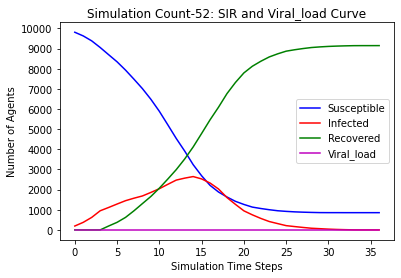

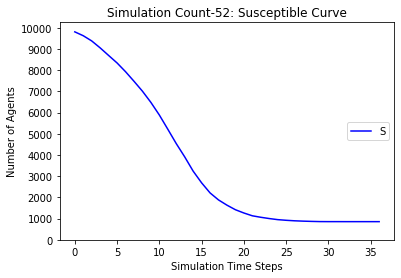

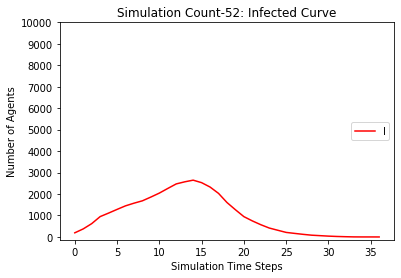

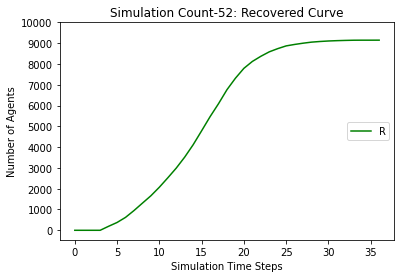

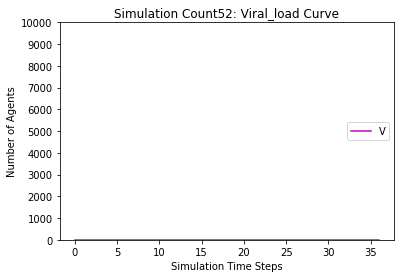

[9807, 9628, 9370, 9050, 8711, 8383, 7954, 7499, 7022, 6423, 5700, 4925, 4176, 3450, 2876, 2390, 2004, 1683, 1437, 1271, 1148, 1073, 1006, 957, 922, 903, 892, 878, 870, 869, 867, 863, 863, 863, 863, 863]
[193, 372, 630, 950, 1096, 1245, 1416, 1551, 1689, 1960, 2254, 2574, 2846, 2973, 2824, 2535, 2172, 1767, 1439, 1119, 856, 610, 431, 314, 226, 170, 114, 79, 52, 34, 25, 15, 7, 6, 4, 0]
[0, 0, 0, 0, 193, 372, 630, 950, 1289, 1617, 2046, 2501, 2978, 3577, 4300, 5075, 5824, 6550, 7124, 7610, 7996, 8317, 8563, 8729, 8852, 8927, 8994, 9043, 9078, 9097, 9108, 9122, 9130, 9131, 9133, 9137]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], 

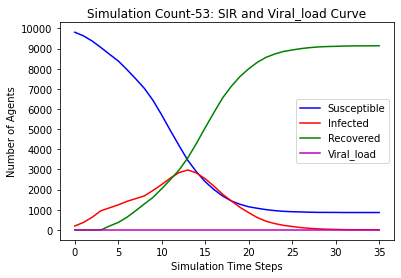

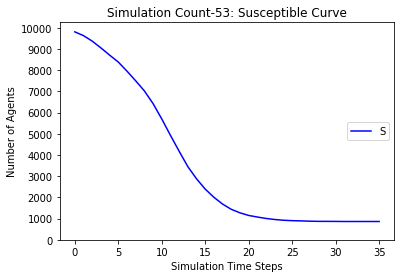

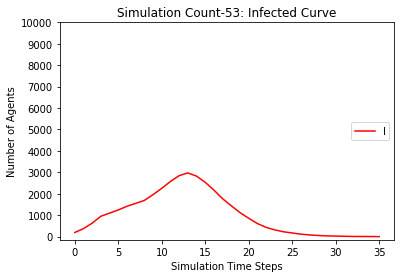

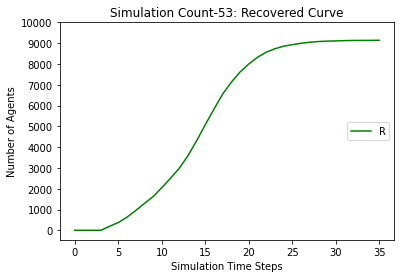

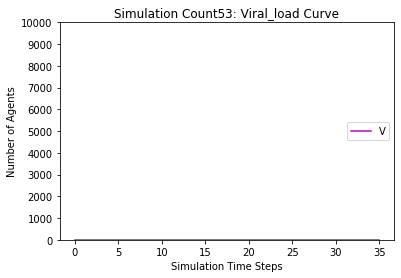

[9807, 9635, 9353, 9010, 8628, 8236, 7829, 7320, 6763, 6191, 5564, 4930, 4264, 3567, 2950, 2429, 1988, 1642, 1412, 1269, 1148, 1030, 963, 912, 868, 838, 817, 805, 799, 794, 792, 789, 787, 787, 787, 785, 785, 785, 785, 785]
[193, 365, 647, 990, 1179, 1399, 1524, 1690, 1865, 2045, 2265, 2390, 2499, 2624, 2614, 2501, 2276, 1925, 1538, 1160, 840, 612, 449, 357, 280, 192, 146, 107, 69, 44, 25, 16, 12, 7, 5, 4, 2, 2, 2, 0]
[0, 0, 0, 0, 193, 365, 647, 990, 1372, 1764, 2171, 2680, 3237, 3809, 4436, 5070, 5736, 6433, 7050, 7571, 8012, 8358, 8588, 8731, 8852, 8970, 9037, 9088, 9132, 9162, 9183, 9195, 9201, 9206, 9208, 9211, 9213, 9213, 9213, 9215]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955,

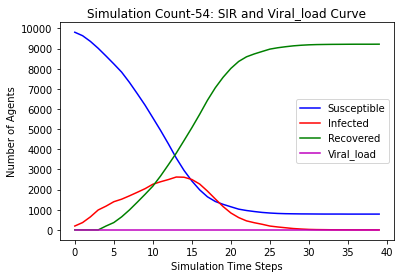

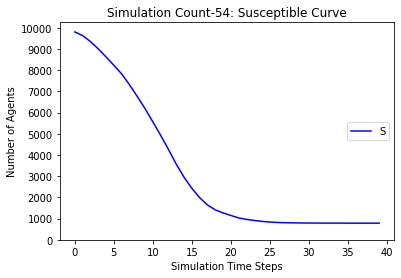

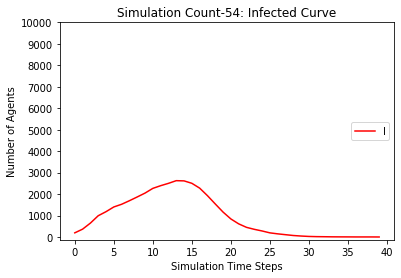

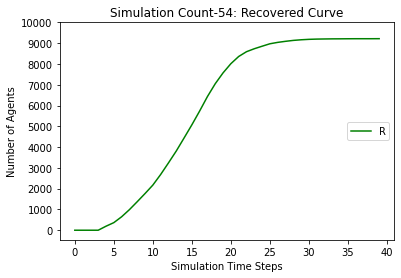

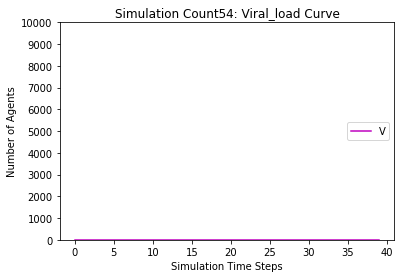

[9807, 9617, 9344, 9036, 8707, 8362, 8045, 7683, 7273, 6667, 6031, 5361, 4679, 3944, 3287, 2680, 2232, 1842, 1601, 1415, 1270, 1169, 1093, 1040, 999, 967, 953, 939, 923, 909, 905, 903, 900, 897, 895, 895, 893, 893, 893, 893, 893]
[193, 383, 656, 964, 1100, 1255, 1299, 1353, 1434, 1695, 2014, 2322, 2594, 2723, 2744, 2681, 2447, 2102, 1686, 1265, 962, 673, 508, 375, 271, 202, 140, 101, 76, 58, 48, 36, 23, 12, 10, 8, 7, 4, 2, 2, 0]
[0, 0, 0, 0, 193, 383, 656, 964, 1293, 1638, 1955, 2317, 2727, 3333, 3969, 4639, 5321, 6056, 6713, 7320, 7768, 8158, 8399, 8585, 8730, 8831, 8907, 8960, 9001, 9033, 9047, 9061, 9077, 9091, 9095, 9097, 9100, 9103, 9105, 9105, 9107]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159

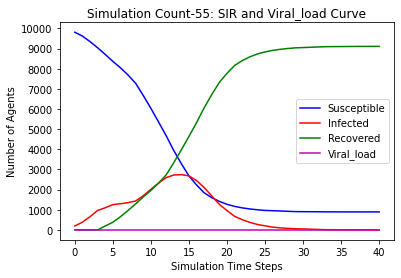

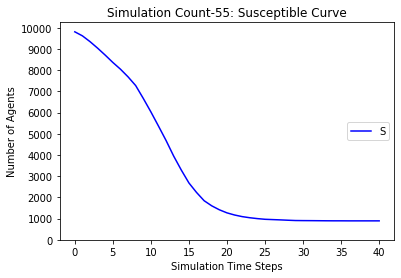

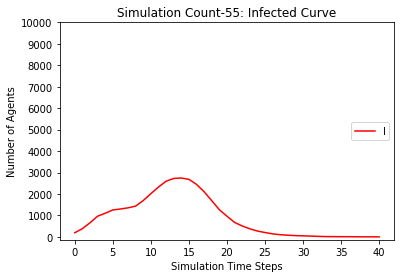

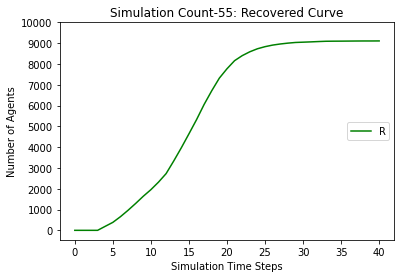

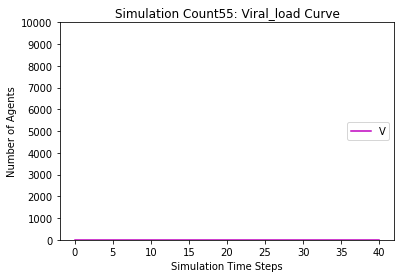

[9807, 9615, 9365, 9014, 8615, 8226, 7784, 7280, 6709, 6135, 5474, 4736, 3970, 3277, 2640, 2169, 1827, 1577, 1384, 1221, 1093, 1020, 965, 918, 889, 875, 869, 863, 862, 861, 861, 861, 860, 860, 860, 860, 860]
[193, 385, 635, 986, 1192, 1389, 1581, 1734, 1906, 2091, 2310, 2544, 2739, 2858, 2834, 2567, 2143, 1700, 1256, 948, 734, 557, 419, 303, 204, 145, 96, 55, 27, 14, 8, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 385, 635, 986, 1385, 1774, 2216, 2720, 3291, 3865, 4526, 5264, 6030, 6723, 7360, 7831, 8173, 8423, 8616, 8779, 8907, 8980, 9035, 9082, 9111, 9125, 9131, 9137, 9138, 9139, 9139, 9139, 9140]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 89

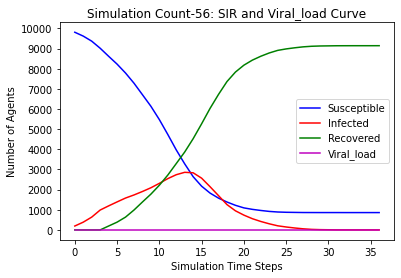

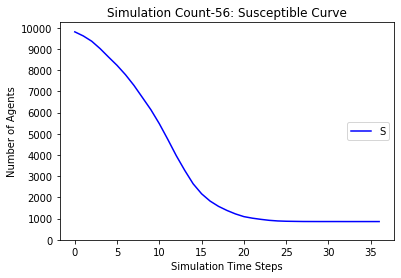

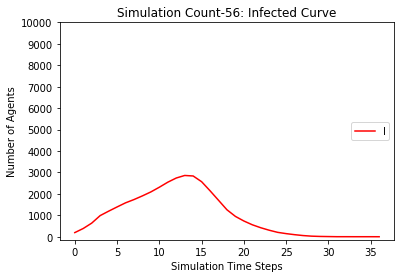

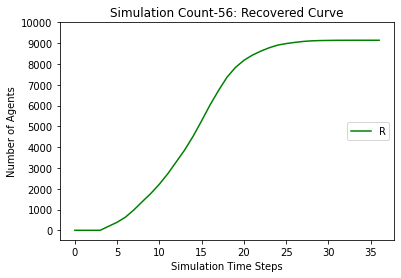

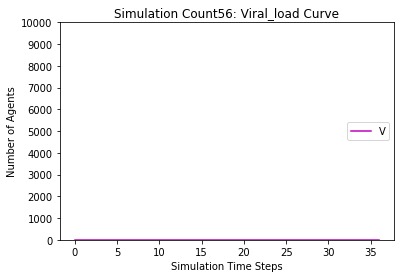

[9807, 9624, 9371, 9052, 8695, 8340, 7946, 7526, 6977, 6342, 5695, 5062, 4343, 3600, 2877, 2295, 1845, 1481, 1205, 1000, 894, 794, 742, 712, 687, 676, 669, 664, 661, 661, 659, 657, 657, 656, 656, 655, 655, 655, 655, 655]
[193, 376, 629, 948, 1112, 1284, 1425, 1526, 1718, 1998, 2251, 2464, 2634, 2742, 2818, 2767, 2498, 2119, 1672, 1295, 951, 687, 463, 288, 207, 118, 73, 48, 26, 15, 10, 7, 4, 5, 3, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 376, 629, 948, 1305, 1660, 2054, 2474, 3023, 3658, 4305, 4938, 5657, 6400, 7123, 7705, 8155, 8519, 8795, 9000, 9106, 9206, 9258, 9288, 9313, 9324, 9331, 9336, 9339, 9339, 9341, 9343, 9343, 9344, 9344, 9345]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 

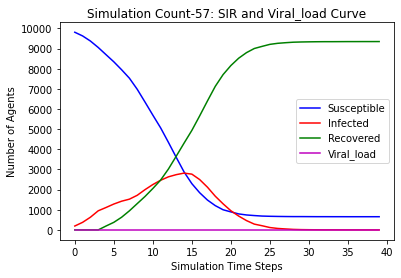

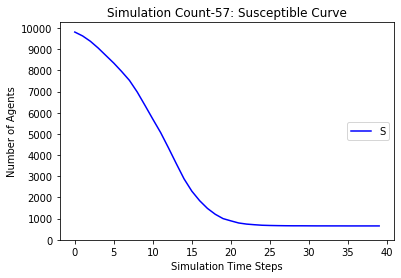

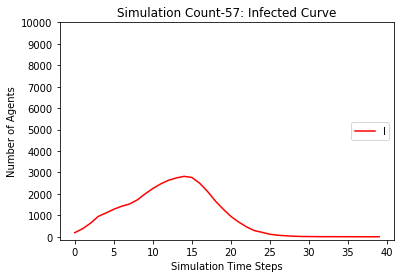

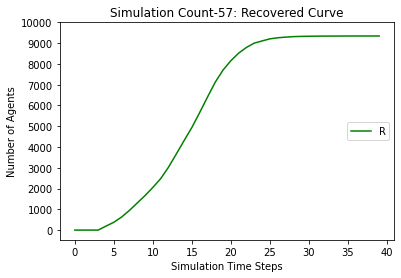

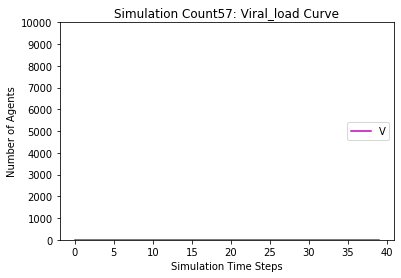

[9807, 9599, 9326, 8958, 8490, 8000, 7434, 6832, 6211, 5493, 4735, 3886, 3140, 2487, 1981, 1594, 1335, 1135, 1007, 919, 857, 794, 761, 745, 736, 716, 707, 697, 693, 689, 688, 688, 688, 688, 688]
[193, 401, 674, 1042, 1317, 1599, 1892, 2126, 2279, 2507, 2699, 2946, 3071, 3006, 2754, 2292, 1805, 1352, 974, 675, 478, 341, 246, 174, 121, 78, 54, 48, 43, 27, 19, 9, 5, 1, 0]
[0, 0, 0, 0, 193, 401, 674, 1042, 1510, 2000, 2566, 3168, 3789, 4507, 5265, 6114, 6860, 7513, 8019, 8406, 8665, 8865, 8993, 9081, 9143, 9206, 9239, 9255, 9264, 9284, 9293, 9303, 9307, 9311, 9312]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8

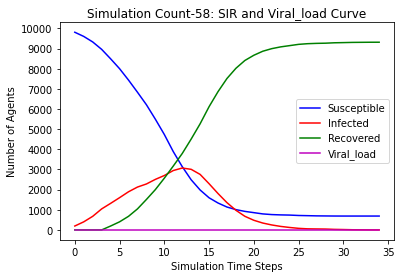

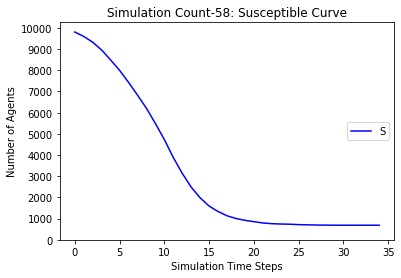

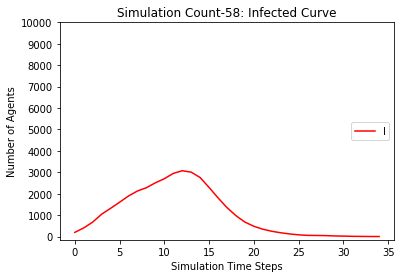

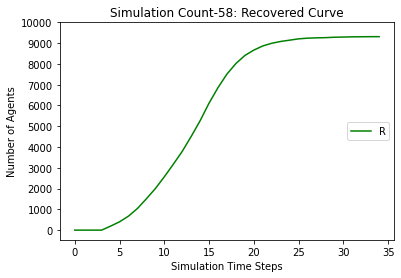

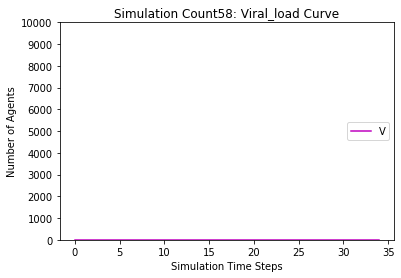

[9807, 9627, 9357, 9050, 8713, 8372, 7957, 7514, 6970, 6313, 5660, 4947, 4280, 3635, 3050, 2554, 2119, 1783, 1542, 1380, 1228, 1137, 1061, 1000, 946, 922, 894, 873, 862, 855, 850, 849, 847, 845, 844, 843, 843, 843, 843, 843]
[193, 373, 643, 950, 1094, 1255, 1400, 1536, 1743, 2059, 2297, 2567, 2690, 2678, 2610, 2393, 2161, 1852, 1508, 1174, 891, 646, 481, 380, 282, 215, 167, 127, 84, 67, 44, 24, 15, 10, 6, 6, 4, 2, 1, 0]
[0, 0, 0, 0, 193, 373, 643, 950, 1287, 1628, 2043, 2486, 3030, 3687, 4340, 5053, 5720, 6365, 6950, 7446, 7881, 8217, 8458, 8620, 8772, 8863, 8939, 9000, 9054, 9078, 9106, 9127, 9138, 9145, 9150, 9151, 9153, 9155, 9156, 9157]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 9

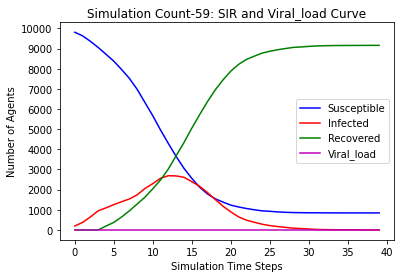

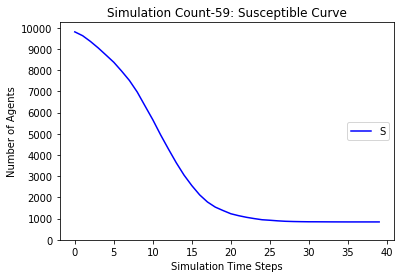

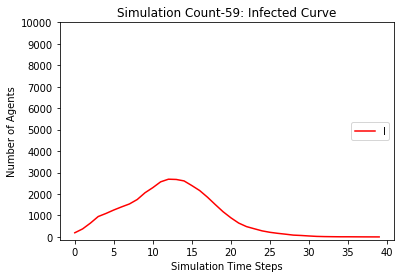

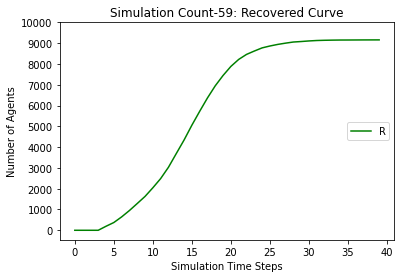

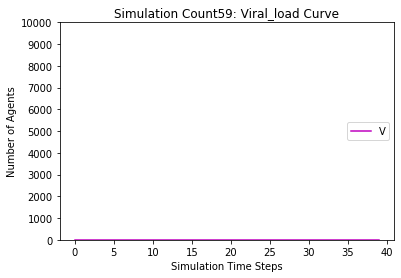

[9807, 9634, 9368, 9049, 8649, 8243, 7683, 7087, 6447, 5643, 4738, 3862, 3073, 2371, 1810, 1451, 1175, 990, 892, 839, 771, 743, 725, 714, 702, 696, 692, 688, 686, 684, 683, 683, 682, 682, 682, 682, 682]
[193, 366, 632, 951, 1158, 1391, 1685, 1962, 2202, 2600, 2945, 3225, 3374, 3272, 2928, 2411, 1898, 1381, 918, 612, 404, 247, 167, 125, 69, 47, 33, 26, 16, 12, 9, 5, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 366, 632, 951, 1351, 1757, 2317, 2913, 3553, 4357, 5262, 6138, 6927, 7629, 8190, 8549, 8825, 9010, 9108, 9161, 9229, 9257, 9275, 9286, 9298, 9304, 9308, 9312, 9314, 9316, 9317, 9317, 9318]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 

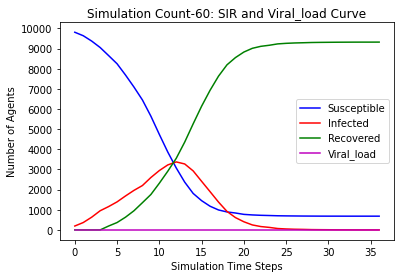

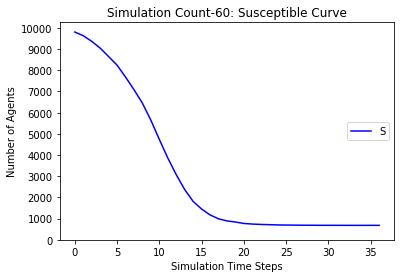

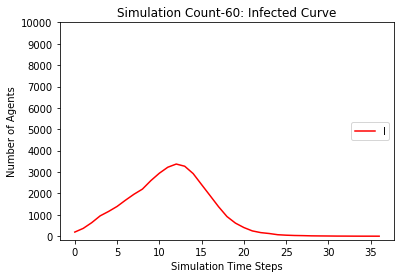

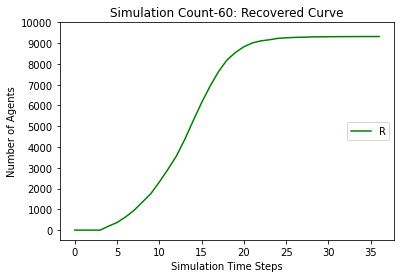

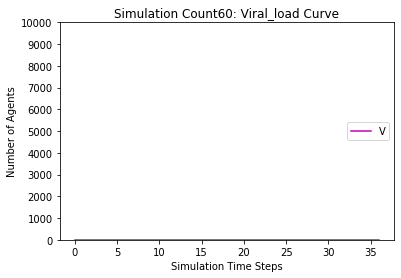

[9807, 9629, 9384, 9067, 8734, 8383, 7925, 7421, 6862, 6188, 5479, 4770, 4043, 3375, 2835, 2344, 1983, 1755, 1546, 1390, 1291, 1217, 1161, 1114, 1082, 1065, 1046, 1031, 1021, 1013, 1011, 1009, 1008, 1006, 1005, 1005, 1005, 1004, 1004, 1004, 1004, 1004]
[193, 371, 616, 933, 1073, 1246, 1459, 1646, 1872, 2195, 2446, 2651, 2819, 2813, 2644, 2426, 2060, 1620, 1289, 954, 692, 538, 385, 276, 209, 152, 115, 83, 61, 52, 35, 22, 13, 7, 6, 4, 3, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 371, 616, 933, 1266, 1617, 2075, 2579, 3138, 3812, 4521, 5230, 5957, 6625, 7165, 7656, 8017, 8245, 8454, 8610, 8709, 8783, 8839, 8886, 8918, 8935, 8954, 8969, 8979, 8987, 8989, 8991, 8992, 8994, 8995, 8995, 8995, 8996]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2

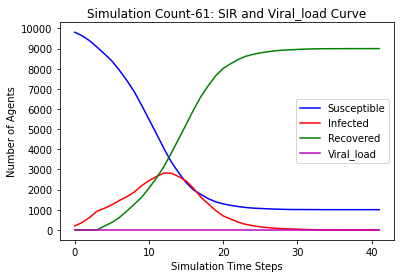

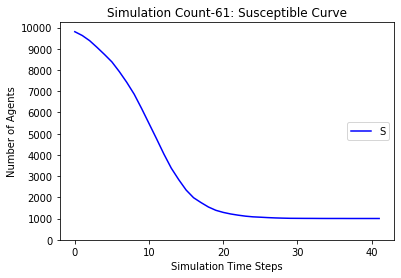

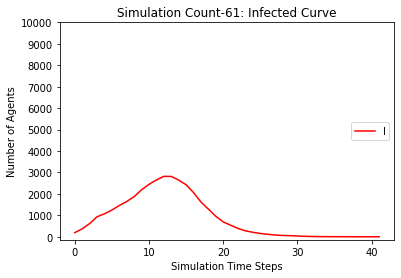

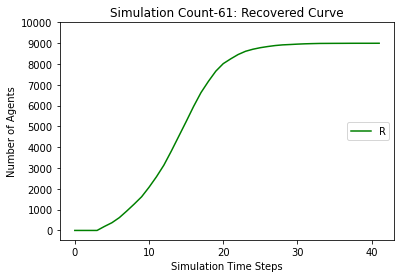

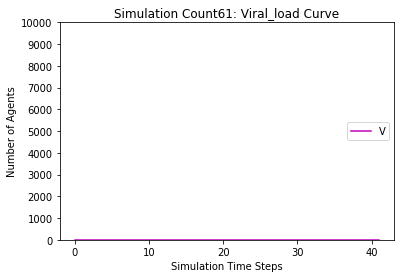

[9807, 9622, 9357, 9050, 8704, 8358, 7940, 7487, 6968, 6416, 5763, 5092, 4340, 3636, 3026, 2514, 2110, 1841, 1581, 1400, 1258, 1169, 1096, 1052, 1012, 985, 972, 954, 942, 938, 934, 932, 927, 927, 926, 926, 926, 926, 926]
[193, 378, 643, 950, 1103, 1264, 1417, 1563, 1736, 1942, 2177, 2395, 2628, 2780, 2737, 2578, 2230, 1795, 1445, 1114, 852, 672, 485, 348, 246, 184, 124, 98, 70, 47, 38, 22, 15, 11, 8, 6, 1, 1, 0]
[0, 0, 0, 0, 193, 378, 643, 950, 1296, 1642, 2060, 2513, 3032, 3584, 4237, 4908, 5660, 6364, 6974, 7486, 7890, 8159, 8419, 8600, 8742, 8831, 8904, 8948, 8988, 9015, 9028, 9046, 9058, 9062, 9066, 9068, 9073, 9073, 9074]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 

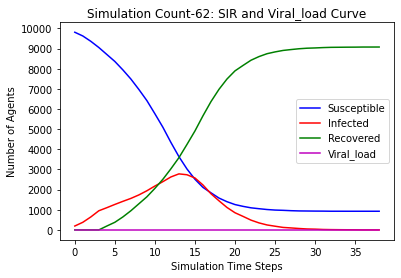

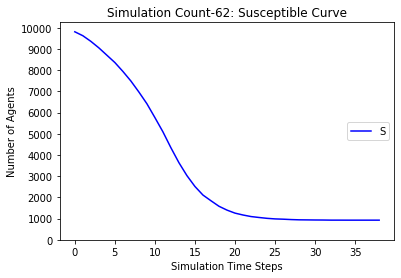

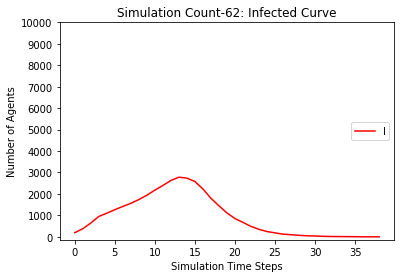

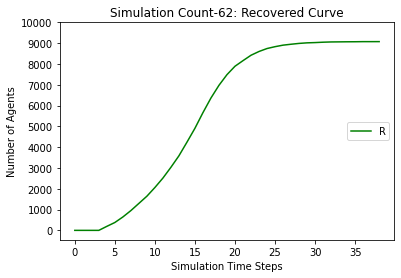

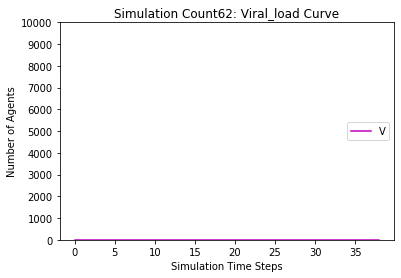

[9807, 9616, 9337, 9012, 8682, 8315, 7872, 7388, 6871, 6271, 5639, 5060, 4448, 3862, 3290, 2805, 2400, 2061, 1792, 1607, 1473, 1379, 1315, 1263, 1228, 1201, 1187, 1176, 1173, 1170, 1165, 1160, 1159, 1157, 1154, 1153, 1153, 1153, 1153, 1153]
[193, 384, 663, 988, 1125, 1301, 1465, 1624, 1811, 2044, 2233, 2328, 2423, 2409, 2349, 2255, 2048, 1801, 1498, 1198, 927, 682, 477, 344, 245, 178, 128, 87, 55, 31, 22, 16, 14, 13, 11, 7, 6, 4, 1, 0]
[0, 0, 0, 0, 193, 384, 663, 988, 1318, 1685, 2128, 2612, 3129, 3729, 4361, 4940, 5552, 6138, 6710, 7195, 7600, 7939, 8208, 8393, 8527, 8621, 8685, 8737, 8772, 8799, 8813, 8824, 8827, 8830, 8835, 8840, 8841, 8843, 8846, 8847]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 10

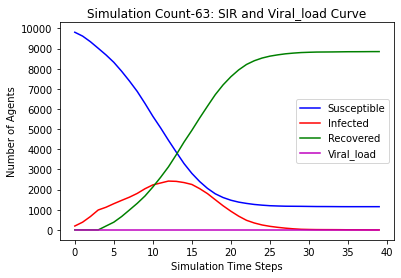

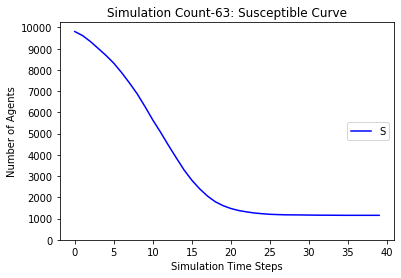

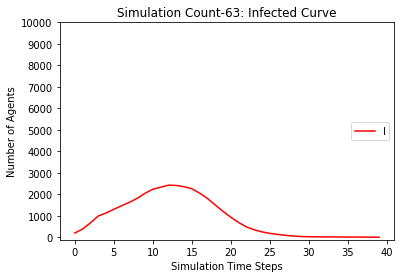

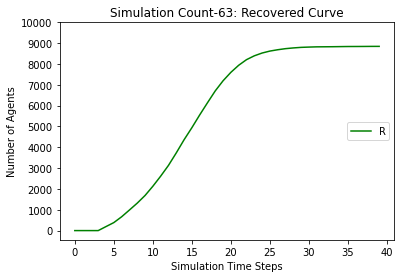

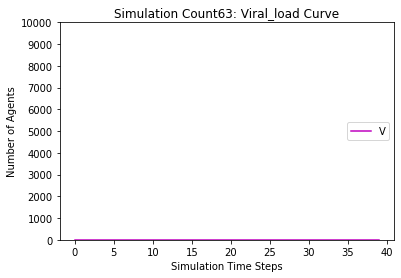

[9807, 9633, 9404, 9117, 8792, 8490, 8133, 7753, 7319, 6830, 6326, 5769, 5183, 4605, 4048, 3414, 2892, 2432, 2038, 1740, 1473, 1286, 1147, 1050, 974, 905, 851, 808, 791, 774, 765, 755, 752, 750, 749, 746, 745, 745, 745, 745, 745]
[193, 367, 596, 883, 1015, 1143, 1271, 1364, 1473, 1660, 1807, 1984, 2136, 2225, 2278, 2355, 2291, 2173, 2010, 1674, 1419, 1146, 891, 690, 499, 381, 296, 242, 183, 131, 86, 53, 39, 24, 16, 9, 7, 5, 4, 1, 0]
[0, 0, 0, 0, 193, 367, 596, 883, 1208, 1510, 1867, 2247, 2681, 3170, 3674, 4231, 4817, 5395, 5952, 6586, 7108, 7568, 7962, 8260, 8527, 8714, 8853, 8950, 9026, 9095, 9149, 9192, 9209, 9226, 9235, 9245, 9248, 9250, 9251, 9254, 9255]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 

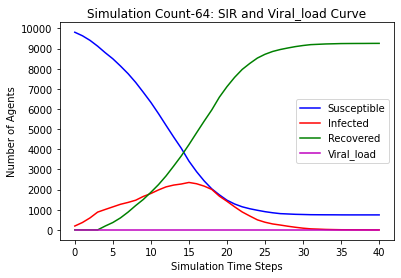

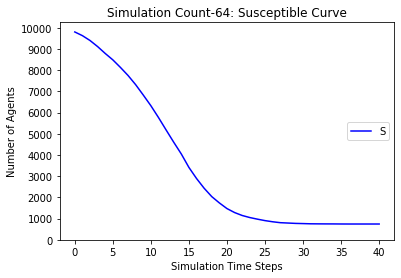

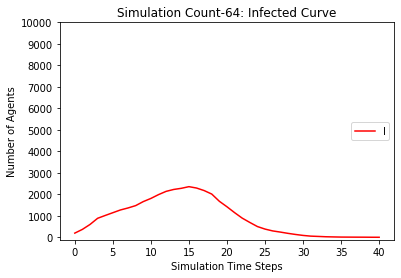

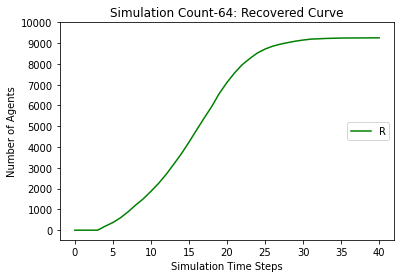

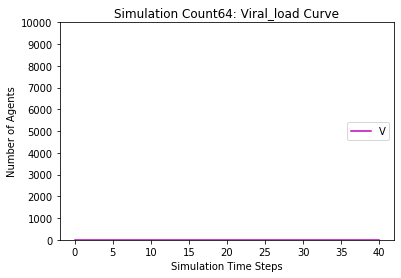

[9807, 9622, 9356, 9046, 8704, 8343, 7842, 7246, 6590, 5917, 5245, 4589, 3898, 3241, 2637, 2129, 1770, 1477, 1262, 1136, 1020, 961, 907, 871, 844, 829, 826, 816, 812, 810, 808, 808, 807, 805, 805, 805, 805, 805]
[193, 378, 644, 954, 1103, 1279, 1514, 1800, 2114, 2426, 2597, 2657, 2692, 2676, 2608, 2460, 2128, 1764, 1375, 993, 750, 516, 355, 265, 176, 132, 81, 55, 32, 19, 18, 8, 5, 5, 3, 3, 2, 0]
[0, 0, 0, 0, 193, 378, 644, 954, 1296, 1657, 2158, 2754, 3410, 4083, 4755, 5411, 6102, 6759, 7363, 7871, 8230, 8523, 8738, 8864, 8980, 9039, 9093, 9129, 9156, 9171, 9174, 9184, 9188, 9190, 9192, 9192, 9193, 9195]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896

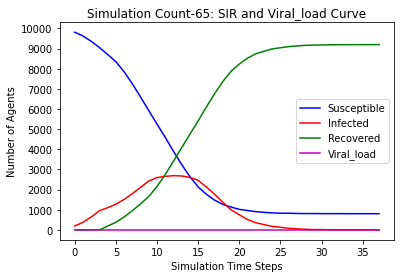

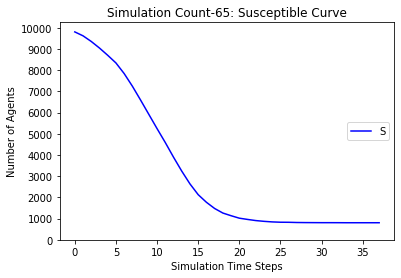

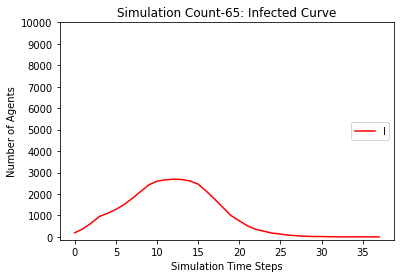

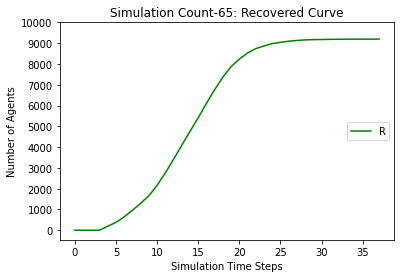

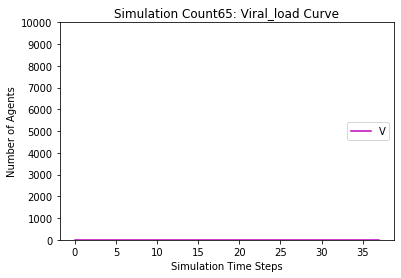

[9807, 9624, 9353, 9040, 8659, 8282, 7839, 7315, 6748, 6125, 5350, 4558, 3879, 3256, 2747, 2316, 1934, 1658, 1435, 1292, 1186, 1095, 1026, 986, 956, 935, 915, 905, 897, 892, 887, 886, 883, 882, 882, 882, 882, 882]
[193, 376, 647, 960, 1148, 1342, 1514, 1725, 1911, 2157, 2489, 2757, 2869, 2869, 2603, 2242, 1945, 1598, 1312, 1024, 748, 563, 409, 306, 230, 160, 111, 81, 59, 43, 28, 19, 14, 10, 5, 4, 1, 0]
[0, 0, 0, 0, 193, 376, 647, 960, 1341, 1718, 2161, 2685, 3252, 3875, 4650, 5442, 6121, 6744, 7253, 7684, 8066, 8342, 8565, 8708, 8814, 8905, 8974, 9014, 9044, 9065, 9085, 9095, 9103, 9108, 9113, 9114, 9117, 9118]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 8

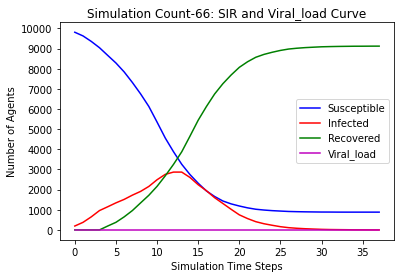

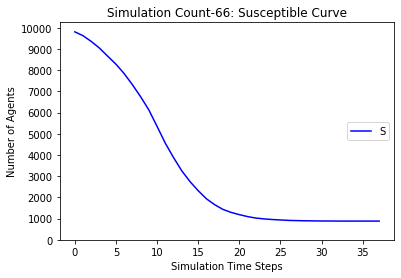

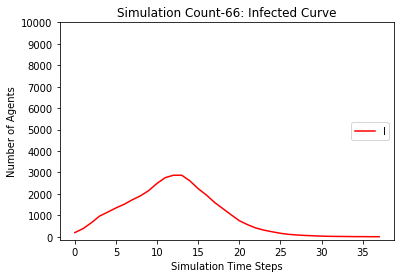

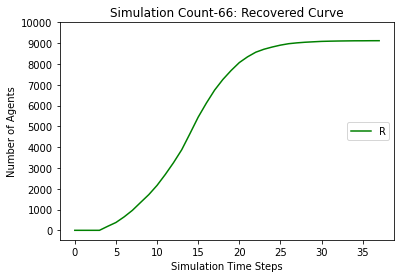

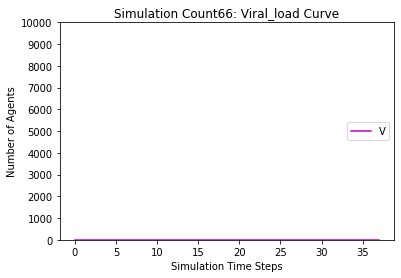

[9807, 9631, 9387, 9081, 8703, 8310, 7888, 7429, 6881, 6343, 5712, 4997, 4260, 3579, 3003, 2478, 2053, 1699, 1428, 1210, 1024, 911, 838, 795, 763, 745, 735, 729, 725, 721, 717, 711, 710, 709, 709, 709, 709, 709]
[193, 369, 613, 919, 1104, 1321, 1499, 1652, 1822, 1967, 2176, 2432, 2621, 2764, 2709, 2519, 2207, 1880, 1575, 1268, 1029, 788, 590, 415, 261, 166, 103, 66, 38, 24, 18, 18, 15, 12, 8, 2, 1, 0]
[0, 0, 0, 0, 193, 369, 613, 919, 1297, 1690, 2112, 2571, 3119, 3657, 4288, 5003, 5740, 6421, 6997, 7522, 7947, 8301, 8572, 8790, 8976, 9089, 9162, 9205, 9237, 9255, 9265, 9271, 9275, 9279, 9283, 9289, 9290, 9291]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 89

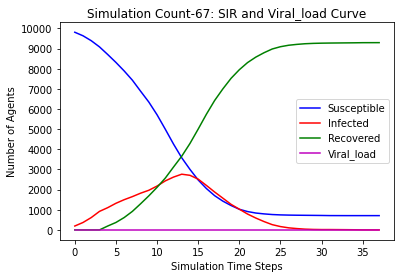

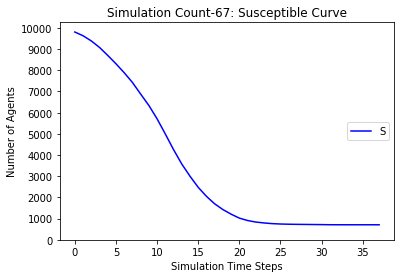

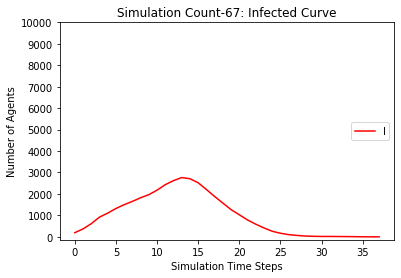

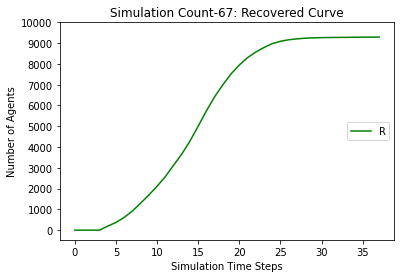

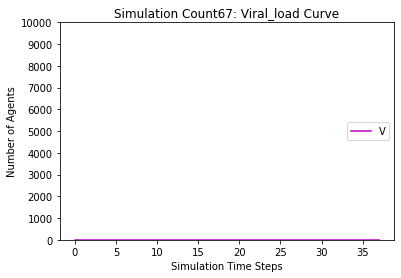

[9807, 9651, 9410, 9113, 8787, 8455, 8075, 7702, 7265, 6740, 6182, 5505, 4842, 4166, 3552, 3026, 2566, 2173, 1871, 1625, 1443, 1292, 1177, 1113, 1043, 997, 952, 928, 915, 903, 894, 891, 889, 887, 885, 885, 885, 885, 885]
[193, 349, 590, 887, 1020, 1196, 1335, 1411, 1522, 1715, 1893, 2197, 2423, 2574, 2630, 2479, 2276, 1993, 1681, 1401, 1123, 881, 694, 512, 400, 295, 225, 185, 128, 94, 58, 37, 26, 16, 9, 6, 4, 2, 0]
[0, 0, 0, 0, 193, 349, 590, 887, 1213, 1545, 1925, 2298, 2735, 3260, 3818, 4495, 5158, 5834, 6448, 6974, 7434, 7827, 8129, 8375, 8557, 8708, 8823, 8887, 8957, 9003, 9048, 9072, 9085, 9097, 9106, 9109, 9111, 9113, 9115]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 91

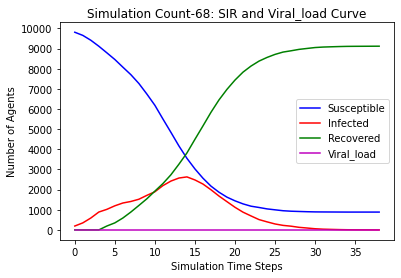

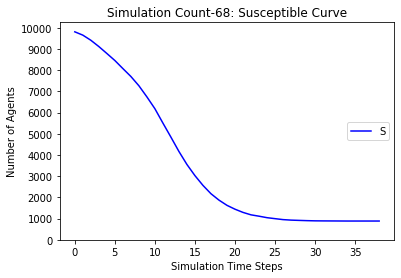

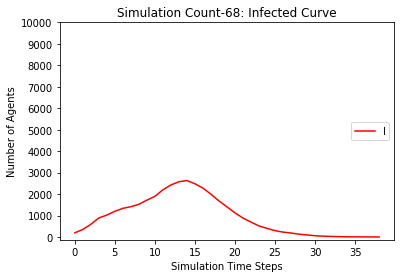

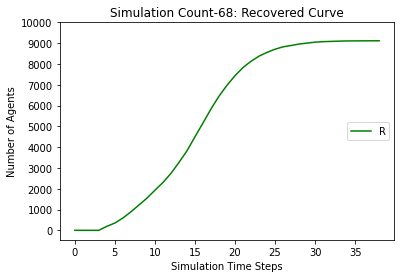

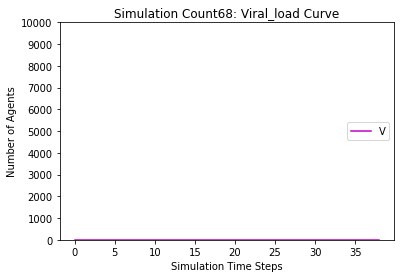

[9807, 9622, 9369, 9052, 8698, 8243, 7724, 7158, 6565, 5963, 5307, 4629, 3932, 3273, 2687, 2179, 1786, 1525, 1343, 1214, 1119, 1046, 1000, 966, 943, 931, 917, 909, 907, 900, 898, 898, 896, 895, 894, 894, 894, 894, 894]
[193, 378, 631, 948, 1109, 1379, 1645, 1894, 2133, 2280, 2417, 2529, 2633, 2690, 2620, 2450, 2146, 1748, 1344, 965, 667, 479, 343, 248, 176, 115, 83, 57, 36, 31, 19, 11, 11, 5, 4, 4, 2, 1, 0]
[0, 0, 0, 0, 193, 378, 631, 948, 1302, 1757, 2276, 2842, 3435, 4037, 4693, 5371, 6068, 6727, 7313, 7821, 8214, 8475, 8657, 8786, 8881, 8954, 9000, 9034, 9057, 9069, 9083, 9091, 9093, 9100, 9102, 9102, 9104, 9105, 9106]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 

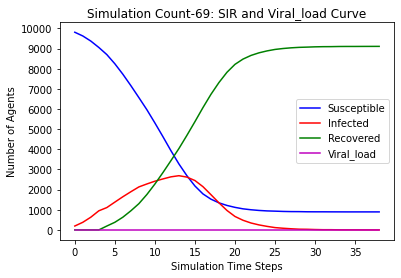

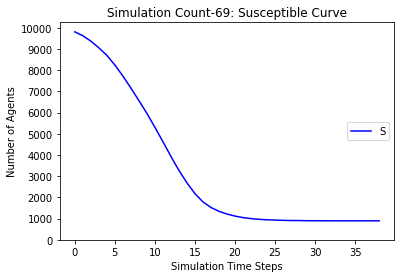

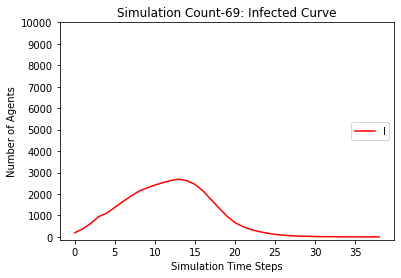

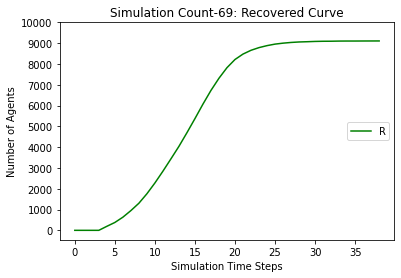

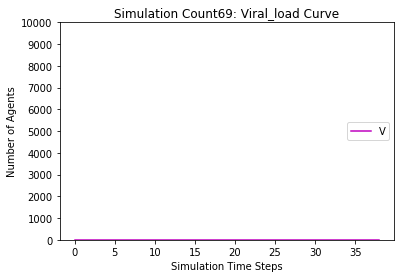

[9807, 9622, 9367, 9056, 8700, 8323, 7883, 7408, 6883, 6328, 5623, 4988, 4192, 3477, 2799, 2279, 1831, 1538, 1293, 1146, 1046, 981, 921, 877, 851, 829, 816, 808, 804, 802, 800, 800, 800, 800, 800]
[193, 378, 633, 944, 1107, 1299, 1484, 1648, 1817, 1995, 2260, 2420, 2691, 2851, 2824, 2709, 2361, 1939, 1506, 1133, 785, 557, 372, 269, 195, 152, 105, 69, 47, 27, 16, 8, 4, 2, 0]
[0, 0, 0, 0, 193, 378, 633, 944, 1300, 1677, 2117, 2592, 3117, 3672, 4377, 5012, 5808, 6523, 7201, 7721, 8169, 8462, 8707, 8854, 8954, 9019, 9079, 9123, 9149, 9171, 9184, 9192, 9196, 9198, 9200]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 908

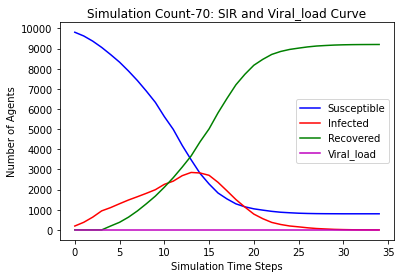

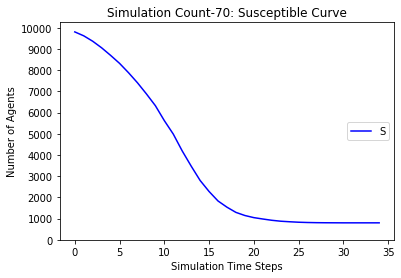

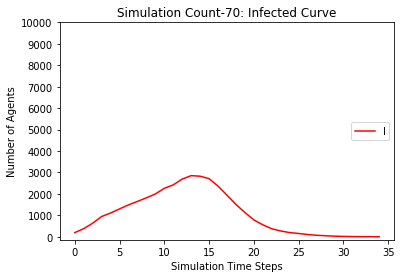

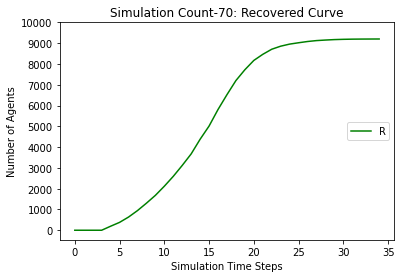

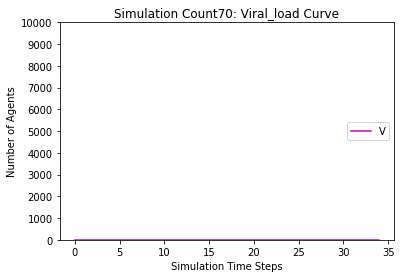

[9807, 9621, 9357, 9051, 8679, 8249, 7790, 7275, 6673, 6020, 5380, 4734, 4102, 3404, 2842, 2361, 1967, 1662, 1412, 1243, 1128, 1045, 970, 922, 884, 854, 830, 812, 805, 803, 797, 793, 789, 787, 785, 784, 783, 783, 783, 781, 781, 781, 781, 780, 780, 780, 780, 780]
[193, 379, 643, 949, 1128, 1372, 1567, 1776, 2006, 2229, 2410, 2541, 2571, 2616, 2538, 2373, 2135, 1742, 1430, 1118, 839, 617, 442, 321, 244, 191, 140, 110, 79, 51, 33, 19, 16, 16, 12, 9, 6, 4, 2, 3, 2, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 193, 379, 643, 949, 1321, 1751, 2210, 2725, 3327, 3980, 4620, 5266, 5898, 6596, 7158, 7639, 8033, 8338, 8588, 8757, 8872, 8955, 9030, 9078, 9116, 9146, 9170, 9188, 9195, 9197, 9203, 9207, 9211, 9213, 9215, 9216, 9217, 9217, 9217, 9219, 9219, 9219, 9219, 9220]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

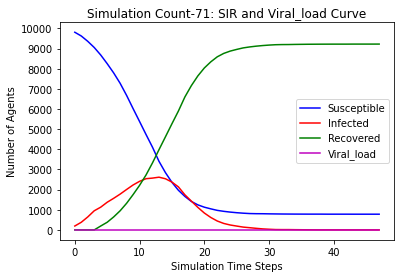

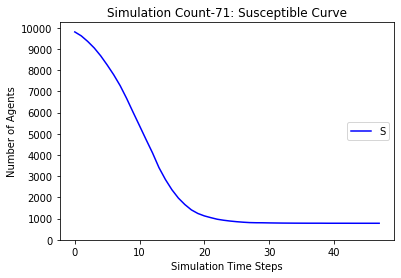

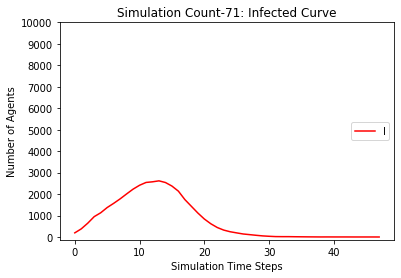

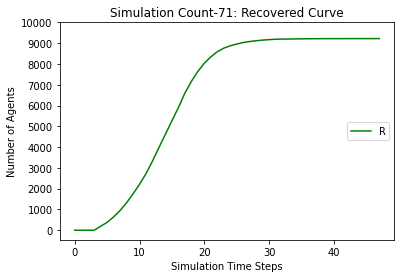

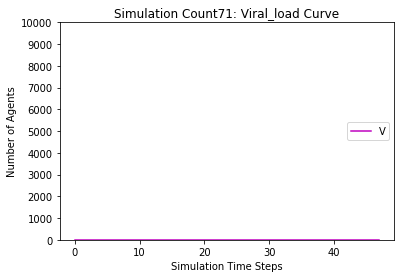

[9807, 9634, 9352, 9014, 8607, 8121, 7619, 6951, 6215, 5401, 4673, 3825, 3034, 2393, 1865, 1454, 1160, 996, 877, 779, 722, 687, 667, 647, 630, 622, 621, 621, 619, 619, 618, 618, 618, 618, 618]
[193, 366, 648, 986, 1200, 1513, 1733, 2063, 2392, 2720, 2946, 3126, 3181, 3008, 2808, 2371, 1874, 1397, 988, 675, 438, 309, 210, 132, 92, 65, 46, 26, 11, 3, 3, 3, 1, 1, 0]
[0, 0, 0, 0, 193, 366, 648, 986, 1393, 1879, 2381, 3049, 3785, 4599, 5327, 6175, 6966, 7607, 8135, 8546, 8840, 9004, 9123, 9221, 9278, 9313, 9333, 9353, 9370, 9378, 9379, 9379, 9381, 9381, 9382]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 84

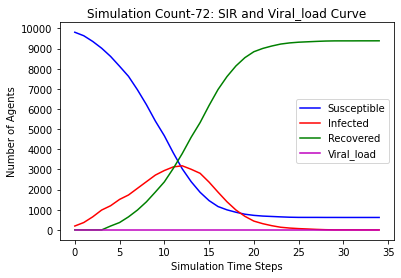

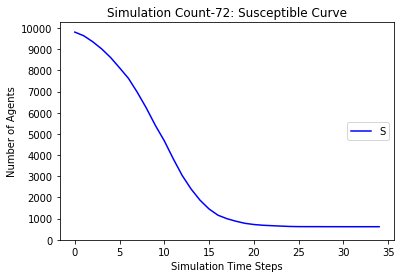

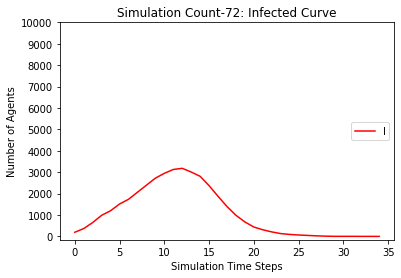

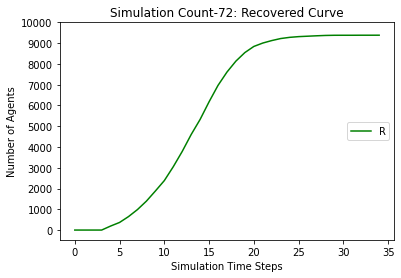

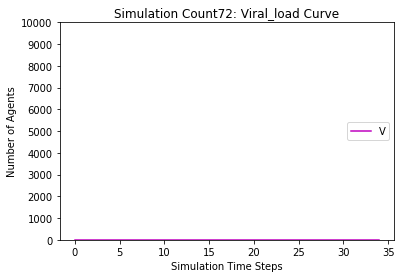

[9807, 9616, 9354, 9037, 8713, 8408, 8018, 7566, 7113, 6616, 5866, 5100, 4407, 3662, 2999, 2420, 1928, 1552, 1295, 1076, 927, 850, 802, 759, 729, 711, 696, 687, 684, 681, 679, 676, 674, 673, 673, 672, 672, 672, 672, 672]
[193, 384, 646, 963, 1094, 1208, 1336, 1471, 1600, 1792, 2152, 2466, 2706, 2954, 2867, 2680, 2479, 2110, 1704, 1344, 1001, 702, 493, 317, 198, 139, 106, 72, 45, 30, 17, 11, 10, 8, 6, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 384, 646, 963, 1287, 1592, 1982, 2434, 2887, 3384, 4134, 4900, 5593, 6338, 7001, 7580, 8072, 8448, 8705, 8924, 9073, 9150, 9198, 9241, 9271, 9289, 9304, 9313, 9316, 9319, 9321, 9324, 9326, 9327, 9327, 9328]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 9

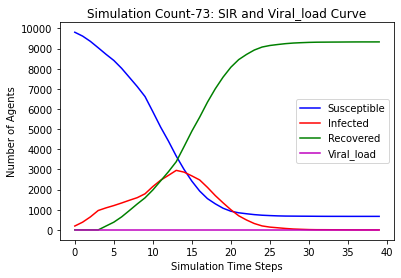

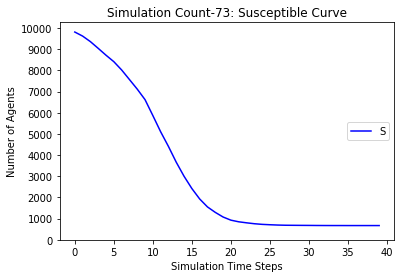

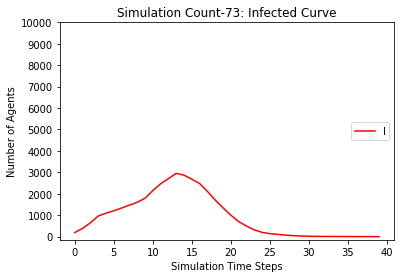

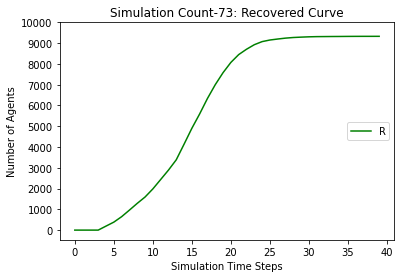

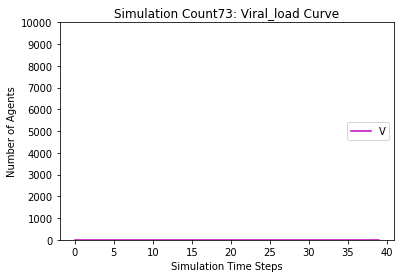

[9807, 9610, 9343, 9009, 8617, 8143, 7648, 7123, 6524, 5827, 5081, 4281, 3476, 2803, 2231, 1766, 1402, 1115, 912, 778, 711, 648, 617, 585, 571, 558, 549, 543, 541, 540, 540, 540, 540, 540]
[193, 390, 657, 991, 1190, 1467, 1695, 1886, 2093, 2316, 2567, 2842, 3048, 3024, 2850, 2515, 2074, 1688, 1319, 988, 691, 467, 295, 193, 140, 90, 68, 42, 30, 18, 9, 3, 1, 0]
[0, 0, 0, 0, 193, 390, 657, 991, 1383, 1857, 2352, 2877, 3476, 4173, 4919, 5719, 6524, 7197, 7769, 8234, 8598, 8885, 9088, 9222, 9289, 9352, 9383, 9415, 9429, 9442, 9451, 9457, 9459, 9460]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665,

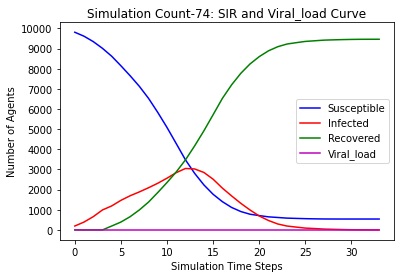

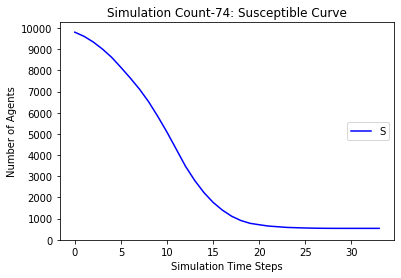

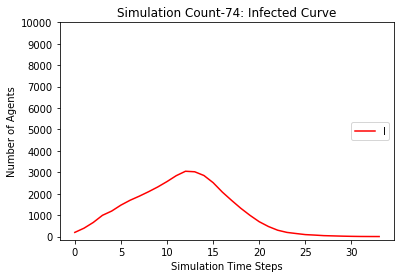

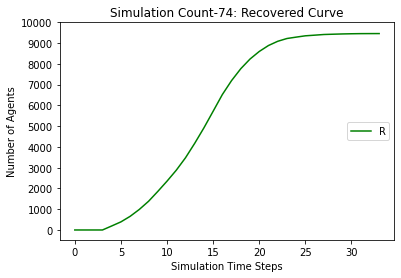

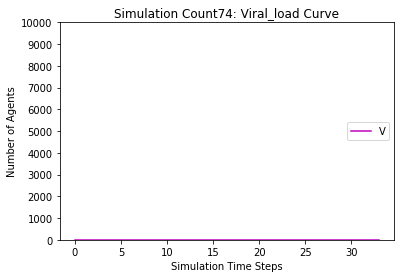

[9807, 9629, 9373, 9034, 8680, 8364, 7940, 7439, 6966, 6401, 5789, 5168, 4625, 4030, 3486, 2952, 2561, 2234, 1942, 1721, 1558, 1444, 1354, 1292, 1237, 1193, 1156, 1125, 1112, 1094, 1086, 1084, 1082, 1081, 1079, 1078, 1076, 1076, 1076, 1076, 1076]
[193, 371, 627, 966, 1127, 1265, 1433, 1595, 1714, 1963, 2151, 2271, 2341, 2371, 2303, 2216, 2064, 1796, 1544, 1231, 1003, 790, 588, 429, 321, 251, 198, 167, 125, 99, 70, 41, 30, 13, 7, 6, 6, 5, 3, 2, 0]
[0, 0, 0, 0, 193, 371, 627, 966, 1320, 1636, 2060, 2561, 3034, 3599, 4211, 4832, 5375, 5970, 6514, 7048, 7439, 7766, 8058, 8279, 8442, 8556, 8646, 8708, 8763, 8807, 8844, 8875, 8888, 8906, 8914, 8916, 8918, 8919, 8921, 8922, 8924]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593

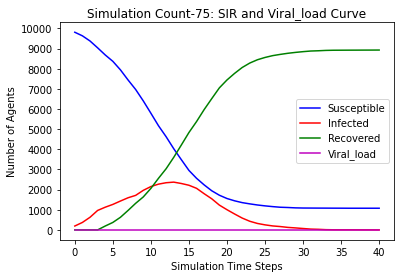

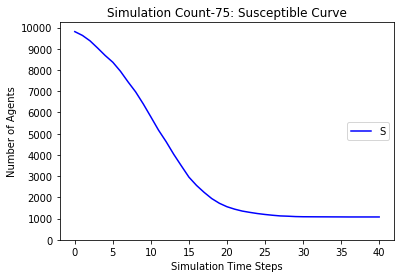

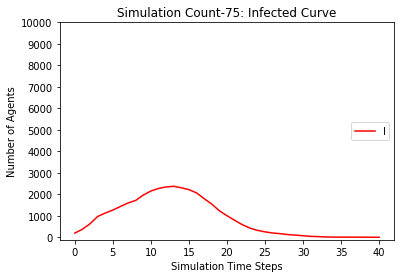

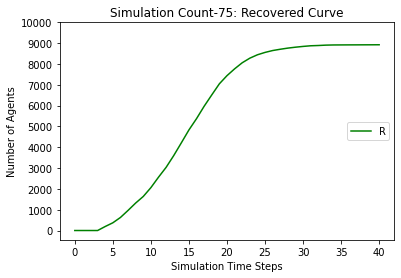

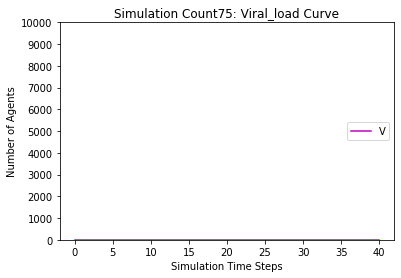

[9807, 9624, 9346, 9014, 8643, 8256, 7813, 7344, 6773, 6152, 5373, 4577, 3815, 3076, 2432, 1990, 1621, 1358, 1181, 1034, 930, 857, 805, 782, 764, 749, 743, 739, 738, 738, 738, 738, 738]
[193, 376, 654, 986, 1164, 1368, 1533, 1670, 1870, 2104, 2440, 2767, 2958, 3076, 2941, 2587, 2194, 1718, 1251, 956, 691, 501, 376, 252, 166, 108, 62, 43, 26, 11, 5, 1, 0]
[0, 0, 0, 0, 193, 376, 654, 986, 1357, 1744, 2187, 2656, 3227, 3848, 4627, 5423, 6185, 6924, 7568, 8010, 8379, 8642, 8819, 8966, 9070, 9143, 9195, 9218, 9236, 9251, 9257, 9261, 9262]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7238, 6750, 625

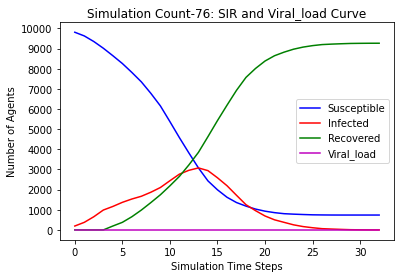

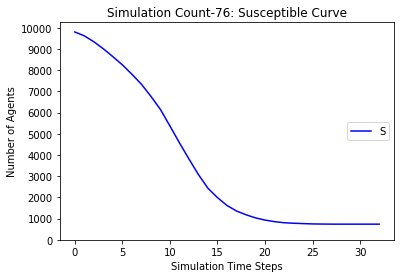

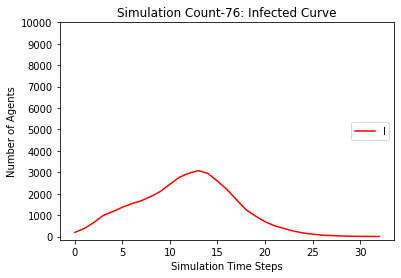

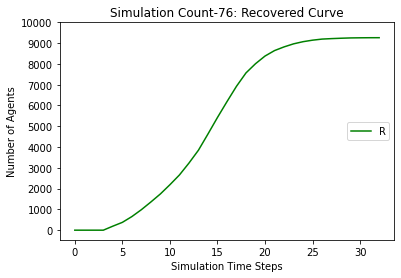

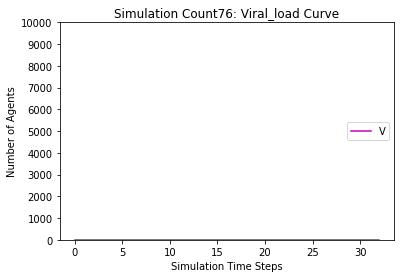

[9807, 9629, 9362, 9067, 8736, 8405, 7995, 7506, 6930, 6244, 5510, 4714, 3974, 3282, 2639, 2147, 1730, 1419, 1175, 1062, 952, 894, 835, 796, 768, 754, 746, 736, 729, 726, 723, 722, 721, 721, 720, 720, 720, 720, 720]
[193, 371, 638, 933, 1071, 1224, 1367, 1561, 1806, 2161, 2485, 2792, 2956, 2962, 2871, 2567, 2244, 1863, 1464, 1085, 778, 525, 340, 266, 184, 140, 89, 60, 39, 28, 23, 14, 8, 5, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 371, 638, 933, 1264, 1595, 2005, 2494, 3070, 3756, 4490, 5286, 6026, 6718, 7361, 7853, 8270, 8581, 8825, 8938, 9048, 9106, 9165, 9204, 9232, 9246, 9254, 9264, 9271, 9274, 9277, 9278, 9279, 9279, 9280]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903

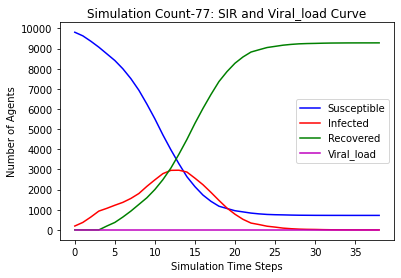

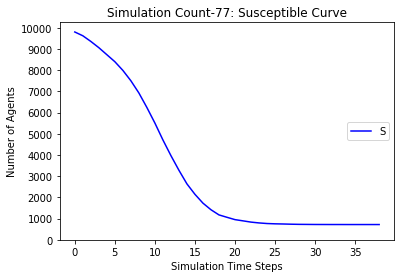

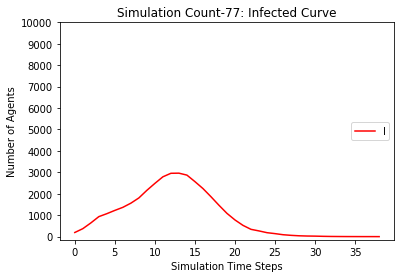

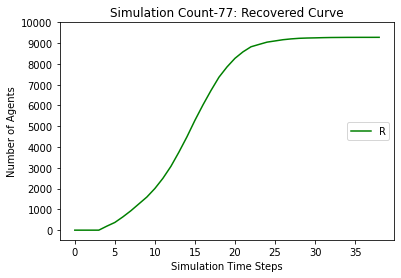

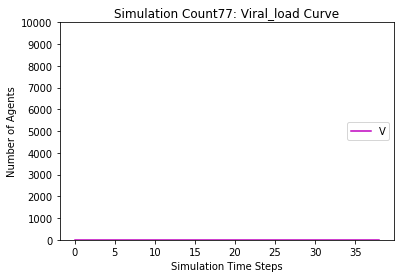

[9807, 9612, 9337, 9046, 8704, 8341, 7948, 7447, 6868, 6240, 5573, 4798, 4069, 3355, 2674, 2165, 1796, 1547, 1385, 1252, 1160, 1105, 1054, 996, 968, 948, 933, 924, 915, 911, 908, 907, 907, 907, 907, 907]
[193, 388, 663, 954, 1103, 1271, 1389, 1599, 1836, 2101, 2375, 2649, 2799, 2885, 2899, 2633, 2273, 1808, 1289, 913, 636, 442, 331, 256, 192, 157, 121, 72, 53, 37, 25, 17, 8, 4, 1, 0]
[0, 0, 0, 0, 193, 388, 663, 954, 1296, 1659, 2052, 2553, 3132, 3760, 4427, 5202, 5931, 6645, 7326, 7835, 8204, 8453, 8615, 8748, 8840, 8895, 8946, 9004, 9032, 9052, 9067, 9076, 9085, 9089, 9092, 9093]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [

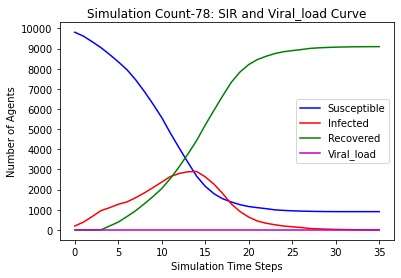

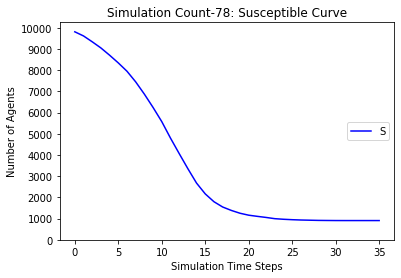

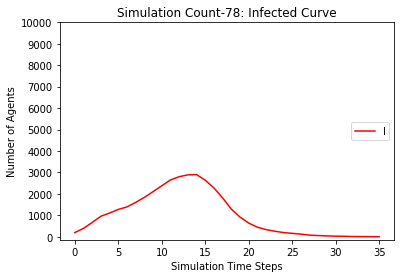

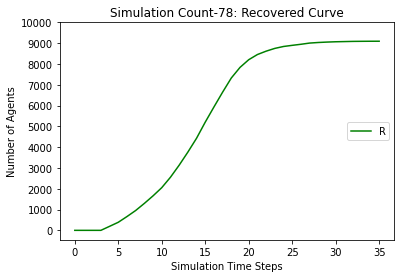

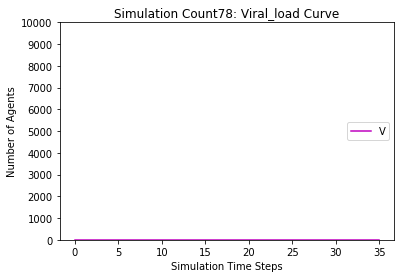

[9807, 9614, 9388, 9039, 8618, 8190, 7703, 7214, 6676, 5943, 5215, 4343, 3510, 2778, 2196, 1781, 1447, 1164, 970, 844, 749, 704, 668, 640, 635, 625, 621, 620, 618, 618, 617, 617, 616, 616, 616, 616, 616]
[193, 386, 612, 961, 1189, 1424, 1685, 1825, 1942, 2247, 2488, 2871, 3166, 3165, 3019, 2562, 2063, 1614, 1226, 937, 698, 460, 302, 204, 114, 79, 47, 20, 17, 7, 4, 3, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 386, 612, 961, 1382, 1810, 2297, 2786, 3324, 4057, 4785, 5657, 6490, 7222, 7804, 8219, 8553, 8836, 9030, 9156, 9251, 9296, 9332, 9360, 9365, 9375, 9379, 9380, 9382, 9382, 9383, 9383, 9384]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895

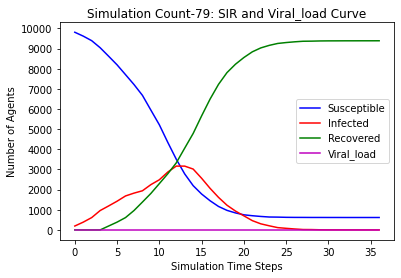

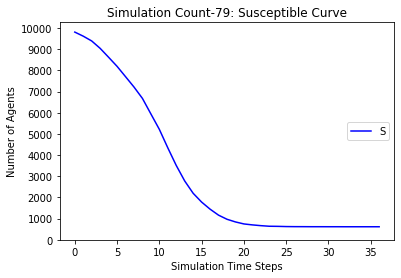

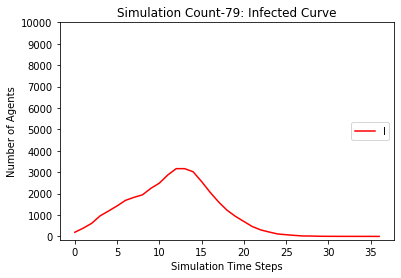

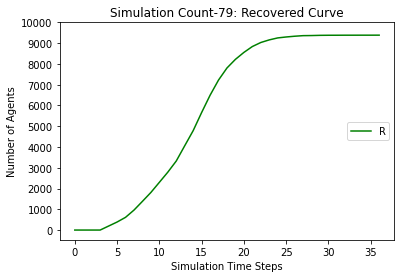

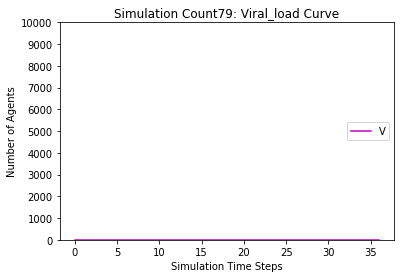

[9807, 9622, 9361, 9016, 8628, 8155, 7617, 6992, 6297, 5431, 4571, 3703, 2966, 2333, 1832, 1441, 1171, 1010, 903, 824, 775, 720, 695, 678, 664, 657, 651, 650, 650, 649, 649, 649, 649, 649]
[193, 378, 639, 984, 1179, 1467, 1744, 2024, 2331, 2724, 3046, 3289, 3331, 3098, 2739, 2262, 1795, 1323, 929, 617, 396, 290, 208, 146, 111, 63, 44, 28, 14, 8, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 378, 639, 984, 1372, 1845, 2383, 3008, 3703, 4569, 5429, 6297, 7034, 7667, 8168, 8559, 8829, 8990, 9097, 9176, 9225, 9280, 9305, 9322, 9336, 9343, 9349, 9350, 9350, 9351]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7

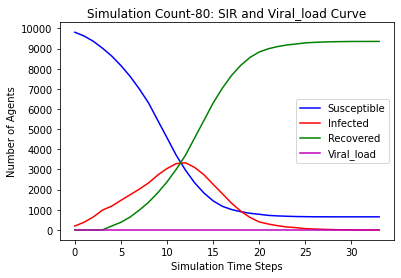

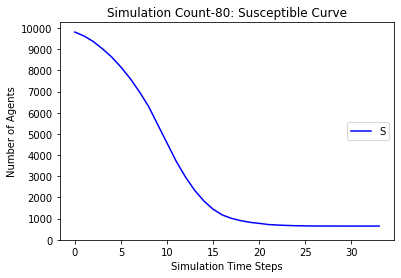

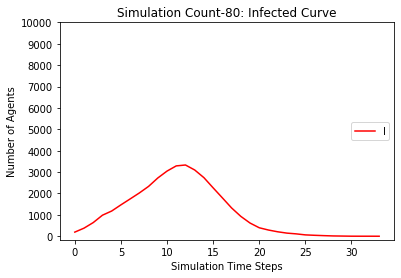

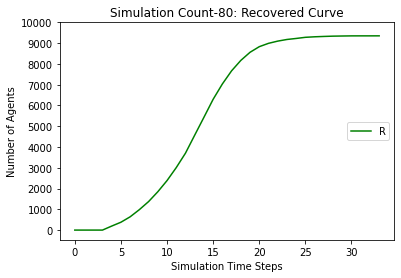

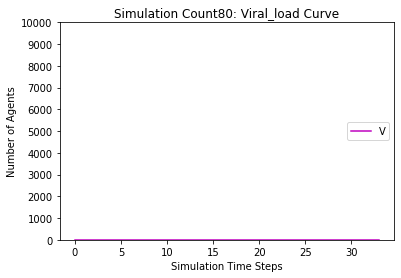

[9807, 9597, 9329, 9020, 8640, 8259, 7721, 7141, 6474, 5640, 4807, 4057, 3242, 2516, 1969, 1591, 1311, 1111, 990, 911, 866, 832, 806, 786, 771, 762, 756, 753, 752, 751, 751, 751, 751, 751]
[193, 403, 671, 980, 1167, 1338, 1608, 1879, 2166, 2619, 2914, 3084, 3232, 3124, 2838, 2466, 1931, 1405, 979, 680, 445, 279, 184, 125, 95, 70, 50, 33, 19, 11, 5, 2, 1, 0]
[0, 0, 0, 0, 193, 403, 671, 980, 1360, 1741, 2279, 2859, 3526, 4360, 5193, 5943, 6758, 7484, 8031, 8409, 8689, 8889, 9010, 9089, 9134, 9168, 9194, 9214, 9229, 9238, 9244, 9247, 9248, 9249]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7

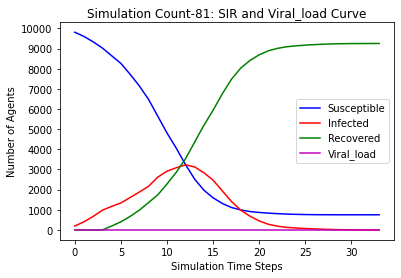

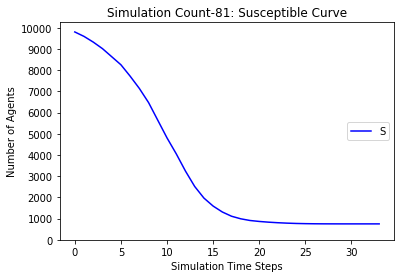

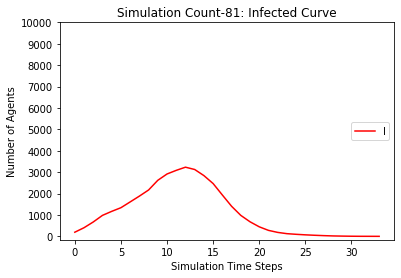

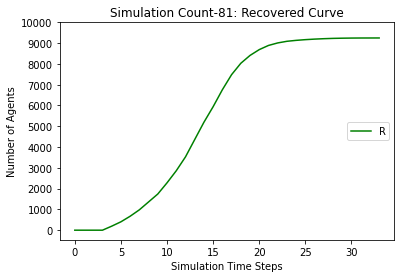

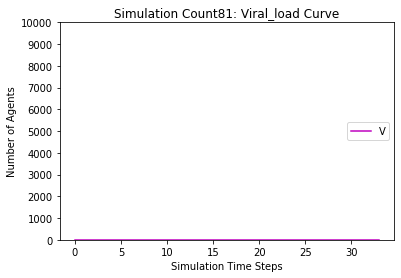

[9807, 9625, 9359, 9055, 8693, 8366, 7987, 7454, 6820, 6060, 5192, 4361, 3614, 2842, 2190, 1713, 1365, 1098, 935, 836, 761, 699, 656, 622, 606, 595, 587, 583, 583, 581, 580, 580, 580, 580, 580]
[193, 375, 641, 945, 1114, 1259, 1372, 1601, 1873, 2306, 2795, 3093, 3206, 3218, 3002, 2648, 2249, 1744, 1255, 877, 604, 399, 279, 214, 155, 104, 69, 39, 23, 14, 7, 3, 3, 1, 0]
[0, 0, 0, 0, 193, 375, 641, 945, 1307, 1634, 2013, 2546, 3180, 3940, 4808, 5639, 6386, 7158, 7810, 8287, 8635, 8902, 9065, 9164, 9239, 9301, 9344, 9378, 9394, 9405, 9413, 9417, 9417, 9419, 9420]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 873

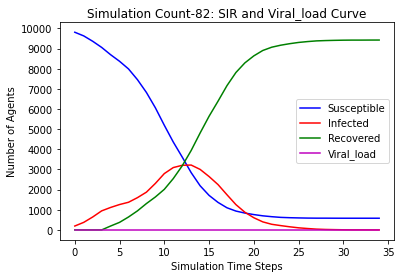

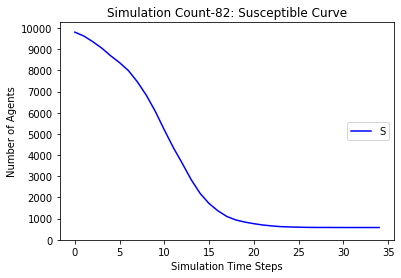

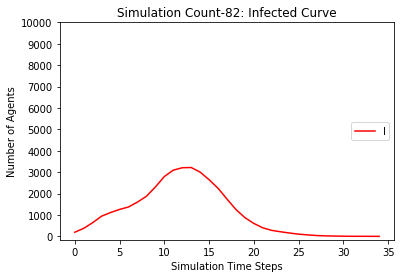

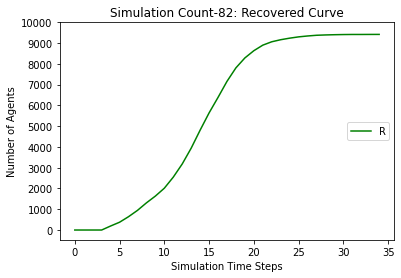

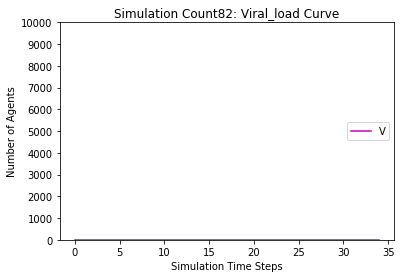

[9807, 9607, 9342, 9049, 8713, 8370, 8013, 7526, 6919, 6242, 5564, 4882, 4224, 3610, 3030, 2502, 2143, 1850, 1608, 1411, 1273, 1179, 1100, 1026, 982, 950, 932, 915, 904, 895, 886, 884, 881, 881, 880, 879, 879, 879, 879, 879]
[193, 393, 658, 951, 1094, 1237, 1329, 1523, 1794, 2128, 2449, 2644, 2695, 2632, 2534, 2380, 2081, 1760, 1422, 1091, 870, 671, 508, 385, 291, 229, 168, 111, 78, 55, 46, 31, 23, 14, 6, 5, 2, 2, 1, 0]
[0, 0, 0, 0, 193, 393, 658, 951, 1287, 1630, 1987, 2474, 3081, 3758, 4436, 5118, 5776, 6390, 6970, 7498, 7857, 8150, 8392, 8589, 8727, 8821, 8900, 8974, 9018, 9050, 9068, 9085, 9096, 9105, 9114, 9116, 9119, 9119, 9120, 9121]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 9

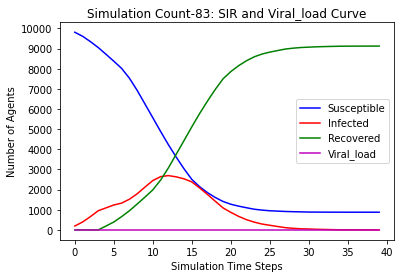

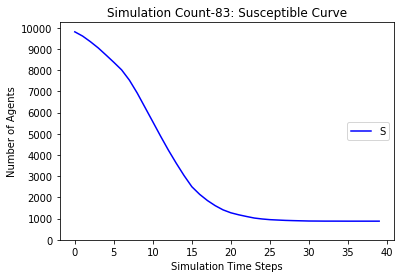

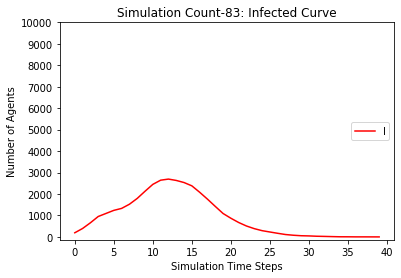

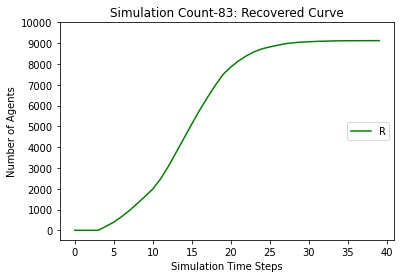

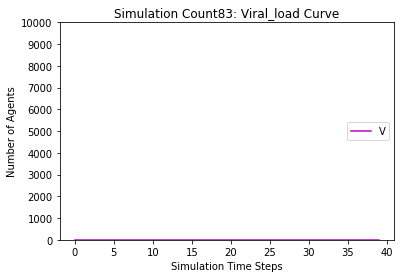

[9807, 9626, 9363, 9048, 8709, 8340, 7930, 7466, 6947, 6339, 5657, 4920, 4227, 3550, 2901, 2415, 2046, 1721, 1486, 1307, 1162, 1075, 987, 920, 883, 867, 855, 849, 849, 849, 849, 849]
[193, 374, 637, 952, 1098, 1286, 1433, 1582, 1762, 2001, 2273, 2546, 2720, 2789, 2756, 2505, 2181, 1829, 1415, 1108, 884, 646, 499, 387, 279, 208, 132, 71, 34, 18, 6, 0]
[0, 0, 0, 0, 193, 374, 637, 952, 1291, 1660, 2070, 2534, 3053, 3661, 4343, 5080, 5773, 6450, 7099, 7585, 7954, 8279, 8514, 8693, 8838, 8925, 9013, 9080, 9117, 9133, 9145, 9151]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7238, 6750, 6256, 5765, 5284, 

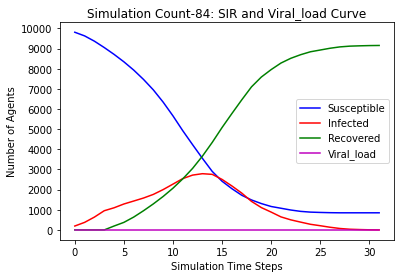

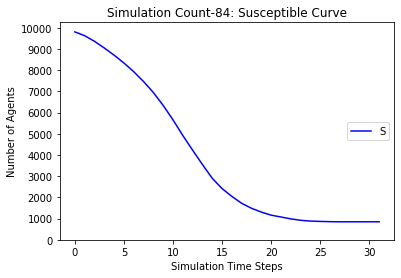

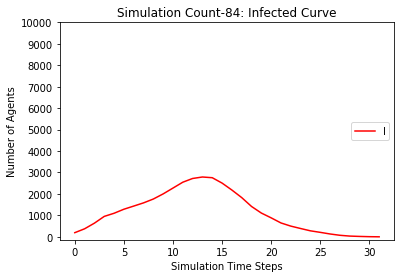

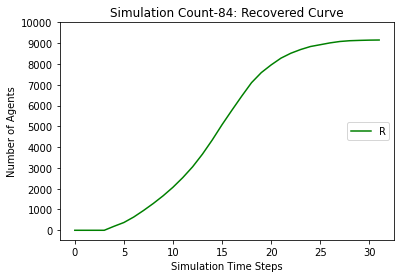

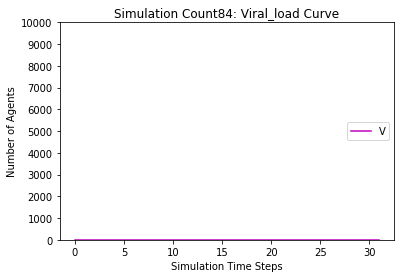

[9807, 9647, 9391, 9084, 8712, 8302, 7840, 7247, 6531, 5808, 5027, 4195, 3431, 2799, 2292, 1854, 1552, 1308, 1143, 1024, 961, 919, 884, 865, 849, 839, 832, 828, 827, 827, 825, 823, 821, 821, 821, 821, 821]
[193, 353, 609, 916, 1095, 1345, 1551, 1837, 2181, 2494, 2813, 3052, 3100, 3009, 2735, 2341, 1879, 1491, 1149, 830, 591, 389, 259, 159, 112, 80, 52, 37, 22, 12, 7, 5, 6, 6, 4, 2, 0]
[0, 0, 0, 0, 193, 353, 609, 916, 1288, 1698, 2160, 2753, 3469, 4192, 4973, 5805, 6569, 7201, 7708, 8146, 8448, 8692, 8857, 8976, 9039, 9081, 9116, 9135, 9151, 9161, 9168, 9172, 9173, 9173, 9175, 9177, 9179]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 

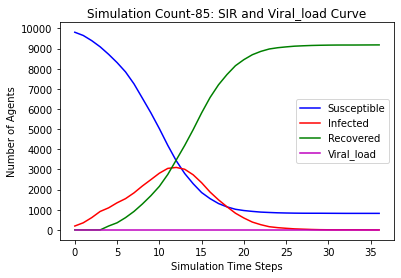

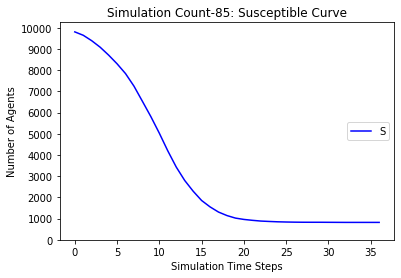

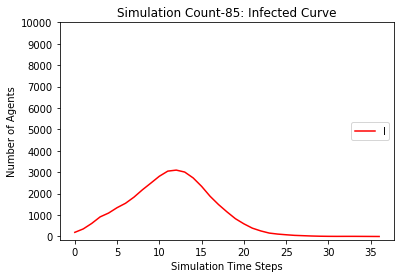

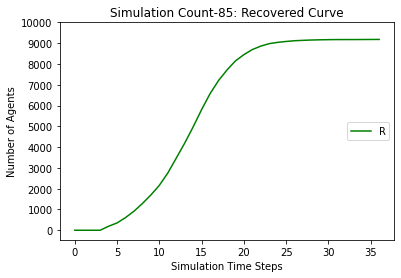

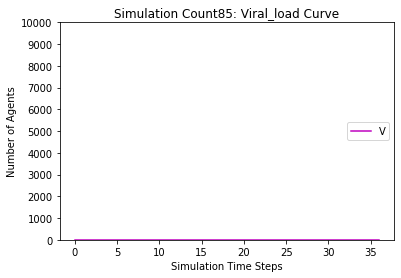

[9807, 9624, 9346, 9054, 8735, 8406, 8023, 7584, 7106, 6554, 5822, 5144, 4563, 3947, 3448, 3015, 2629, 2339, 2092, 1859, 1708, 1589, 1489, 1410, 1359, 1308, 1273, 1246, 1230, 1215, 1205, 1201, 1199, 1195, 1194, 1194, 1194, 1194, 1194]
[193, 376, 654, 946, 1072, 1218, 1323, 1470, 1629, 1852, 2201, 2440, 2543, 2607, 2374, 2129, 1934, 1608, 1356, 1156, 921, 750, 603, 449, 349, 281, 216, 164, 129, 93, 68, 45, 31, 20, 11, 7, 5, 1, 0]
[0, 0, 0, 0, 193, 376, 654, 946, 1265, 1594, 1977, 2416, 2894, 3446, 4178, 4856, 5437, 6053, 6552, 6985, 7371, 7661, 7908, 8141, 8292, 8411, 8511, 8590, 8641, 8692, 8727, 8754, 8770, 8785, 8795, 8799, 8801, 8805, 8806]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955

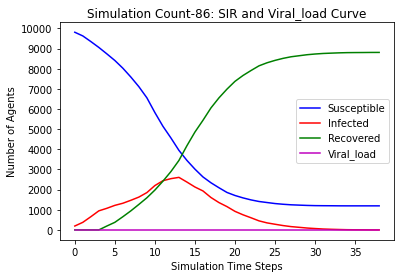

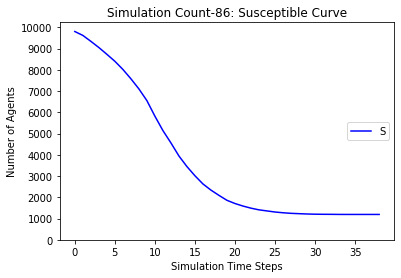

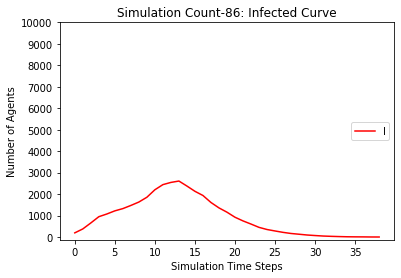

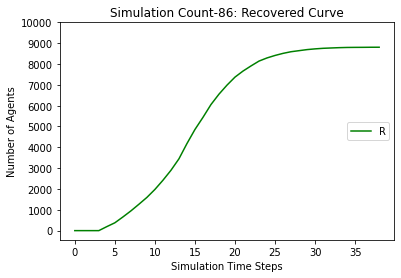

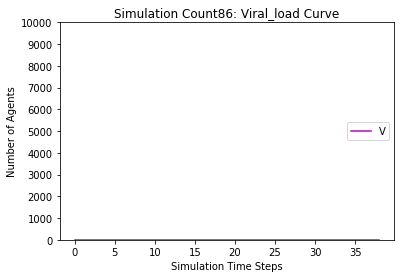

[9807, 9630, 9369, 9041, 8719, 8395, 8047, 7583, 7063, 6533, 5891, 5176, 4445, 3759, 2992, 2445, 1967, 1587, 1342, 1178, 1093, 979, 899, 846, 815, 786, 767, 758, 745, 740, 730, 726, 724, 721, 720, 719, 719, 719, 718, 717, 717, 717, 717, 717]
[193, 370, 631, 959, 1088, 1235, 1322, 1458, 1656, 1862, 2156, 2407, 2618, 2774, 2899, 2731, 2478, 2172, 1650, 1267, 874, 608, 443, 332, 278, 193, 132, 88, 70, 46, 37, 32, 21, 19, 10, 7, 5, 2, 2, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 193, 370, 631, 959, 1281, 1605, 1953, 2417, 2937, 3467, 4109, 4824, 5555, 6241, 7008, 7555, 8033, 8413, 8658, 8822, 8907, 9021, 9101, 9154, 9185, 9214, 9233, 9242, 9255, 9260, 9270, 9274, 9276, 9279, 9280, 9281, 9281, 9281, 9282, 9283]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637,

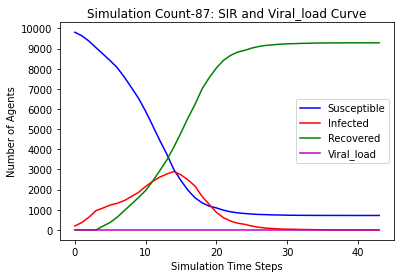

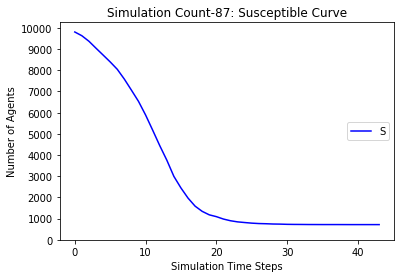

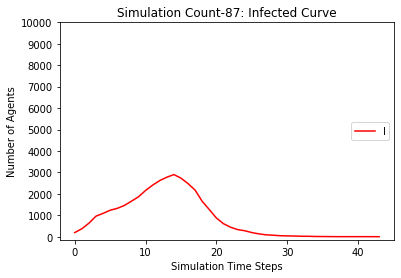

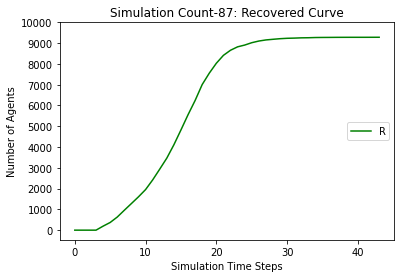

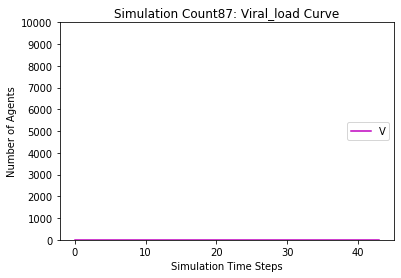

[9807, 9619, 9371, 9030, 8625, 8252, 7723, 7124, 6388, 5584, 4764, 3936, 3149, 2471, 1950, 1576, 1311, 1111, 967, 865, 796, 753, 727, 712, 706, 696, 691, 690, 689, 688, 688, 688, 688, 688]
[193, 381, 629, 970, 1182, 1367, 1648, 1906, 2237, 2668, 2959, 3188, 3239, 3113, 2814, 2360, 1838, 1360, 983, 711, 515, 358, 240, 153, 90, 57, 36, 22, 17, 8, 3, 2, 1, 0]
[0, 0, 0, 0, 193, 381, 629, 970, 1375, 1748, 2277, 2876, 3612, 4416, 5236, 6064, 6851, 7529, 8050, 8424, 8689, 8889, 9033, 9135, 9204, 9247, 9273, 9288, 9294, 9304, 9309, 9310, 9311, 9312]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 72

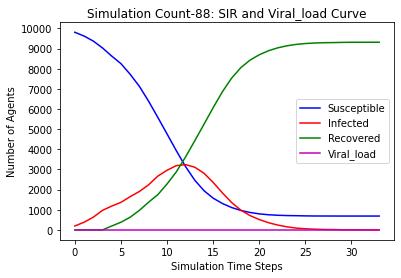

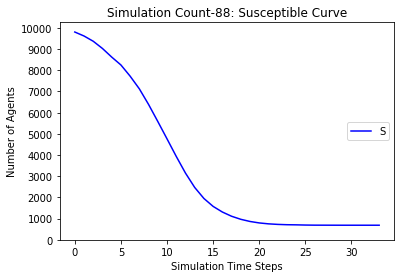

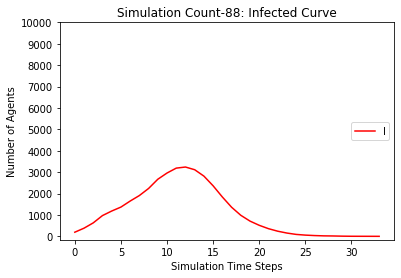

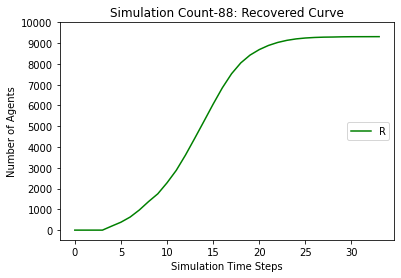

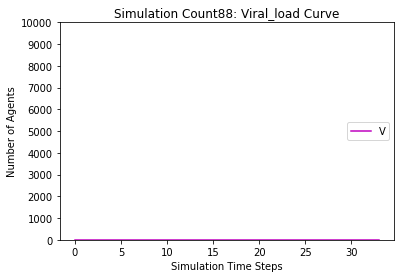

[9807, 9615, 9347, 9037, 8691, 8321, 7899, 7475, 6957, 6435, 5828, 5238, 4629, 4072, 3462, 2939, 2502, 2160, 1875, 1651, 1487, 1372, 1277, 1208, 1154, 1124, 1102, 1090, 1089, 1080, 1076, 1074, 1070, 1069, 1068, 1067, 1067, 1067, 1067, 1067]
[193, 385, 653, 963, 1116, 1294, 1448, 1562, 1734, 1886, 2071, 2237, 2328, 2363, 2366, 2299, 2127, 1912, 1587, 1288, 1015, 788, 598, 443, 333, 248, 175, 118, 65, 44, 26, 16, 19, 11, 8, 7, 3, 2, 1, 0]
[0, 0, 0, 0, 193, 385, 653, 963, 1309, 1679, 2101, 2525, 3043, 3565, 4172, 4762, 5371, 5928, 6538, 7061, 7498, 7840, 8125, 8349, 8513, 8628, 8723, 8792, 8846, 8876, 8898, 8910, 8911, 8920, 8924, 8926, 8930, 8931, 8932, 8933]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1

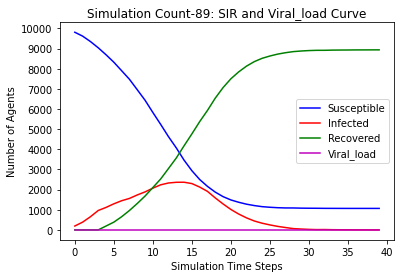

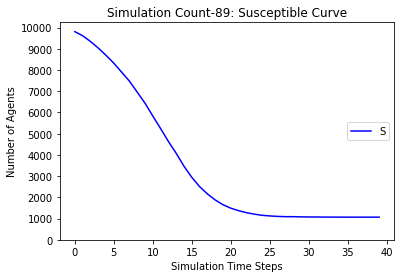

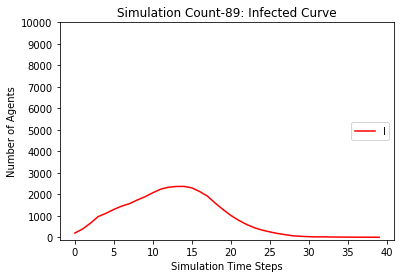

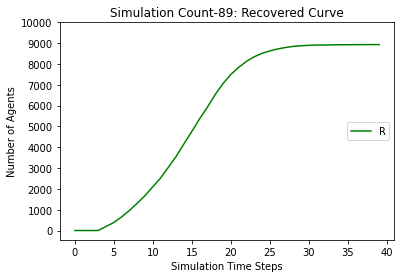

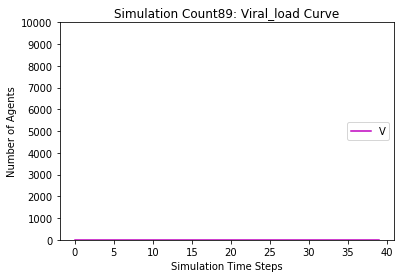

[9807, 9601, 9347, 9005, 8614, 8186, 7657, 7082, 6406, 5684, 4865, 4052, 3270, 2552, 2094, 1683, 1399, 1219, 1084, 986, 916, 861, 828, 809, 796, 792, 789, 785, 783, 782, 782, 782, 782, 782]
[193, 399, 653, 995, 1193, 1415, 1690, 1923, 2208, 2502, 2792, 3030, 3136, 3132, 2771, 2369, 1871, 1333, 1010, 697, 483, 358, 256, 177, 120, 69, 39, 24, 13, 10, 7, 3, 1, 0]
[0, 0, 0, 0, 193, 399, 653, 995, 1386, 1814, 2343, 2918, 3594, 4316, 5135, 5948, 6730, 7448, 7906, 8317, 8601, 8781, 8916, 9014, 9084, 9139, 9172, 9191, 9204, 9208, 9211, 9215, 9217, 9218]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665

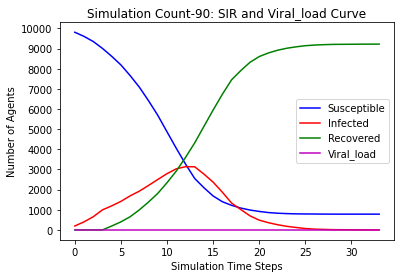

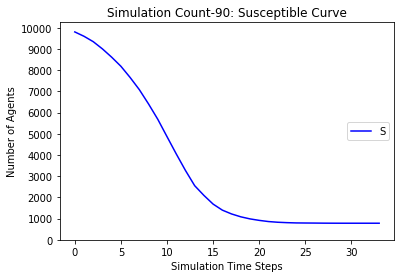

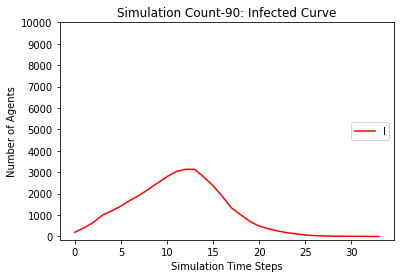

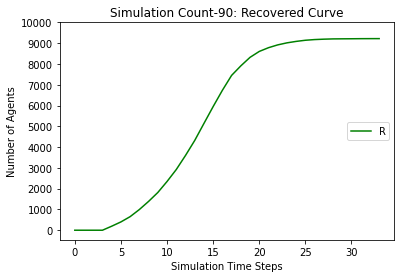

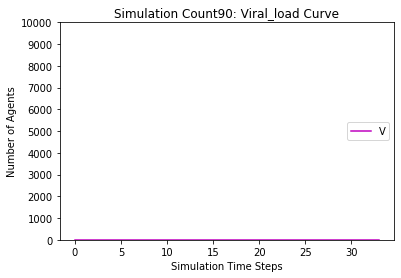

[9807, 9632, 9369, 9052, 8664, 8249, 7802, 7313, 6733, 6156, 5430, 4740, 4073, 3379, 2807, 2286, 1853, 1562, 1305, 1135, 993, 917, 867, 816, 778, 757, 750, 747, 741, 737, 734, 733, 732, 730, 730, 729, 729, 729, 729, 729]
[193, 368, 631, 948, 1143, 1383, 1567, 1739, 1931, 2093, 2372, 2573, 2660, 2777, 2623, 2454, 2220, 1817, 1502, 1151, 860, 645, 438, 319, 215, 160, 117, 69, 37, 20, 16, 14, 9, 7, 4, 4, 3, 1, 1, 0]
[0, 0, 0, 0, 193, 368, 631, 948, 1336, 1751, 2198, 2687, 3267, 3844, 4570, 5260, 5927, 6621, 7193, 7714, 8147, 8438, 8695, 8865, 9007, 9083, 9133, 9184, 9222, 9243, 9250, 9253, 9259, 9263, 9266, 9267, 9268, 9270, 9270, 9271]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929

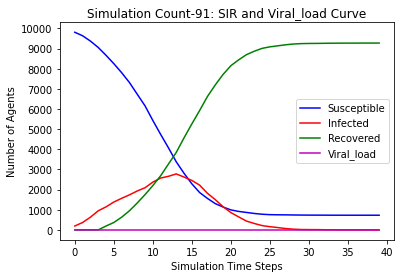

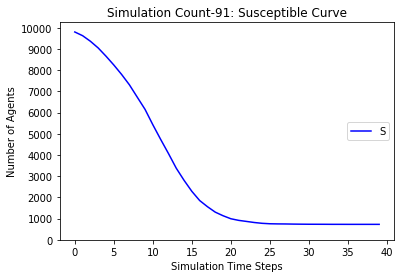

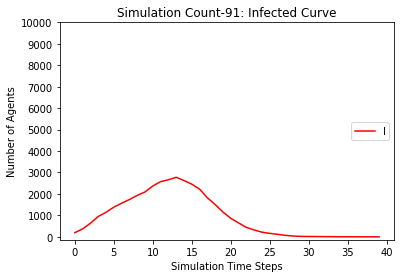

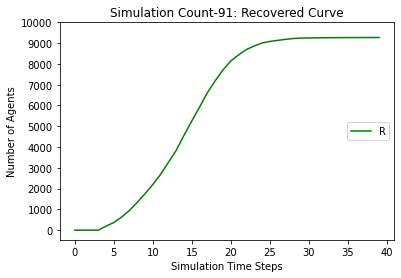

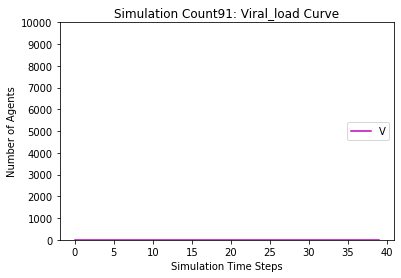

[9807, 9626, 9367, 9081, 8768, 8422, 7990, 7458, 6832, 6173, 5472, 4797, 4138, 3528, 3047, 2529, 2070, 1742, 1496, 1309, 1143, 1029, 962, 910, 853, 824, 804, 793, 781, 778, 775, 775, 774, 772, 772, 772, 772, 772]
[193, 374, 633, 919, 1039, 1204, 1377, 1623, 1936, 2249, 2518, 2661, 2694, 2645, 2425, 2268, 2068, 1786, 1551, 1220, 927, 713, 534, 399, 290, 205, 158, 117, 72, 46, 29, 18, 7, 6, 3, 3, 2, 0]
[0, 0, 0, 0, 193, 374, 633, 919, 1232, 1578, 2010, 2542, 3168, 3827, 4528, 5203, 5862, 6472, 6953, 7471, 7930, 8258, 8504, 8691, 8857, 8971, 9038, 9090, 9147, 9176, 9196, 9207, 9219, 9222, 9225, 9225, 9226, 9228]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896

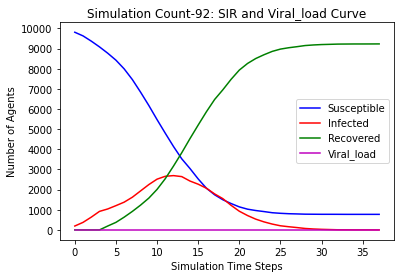

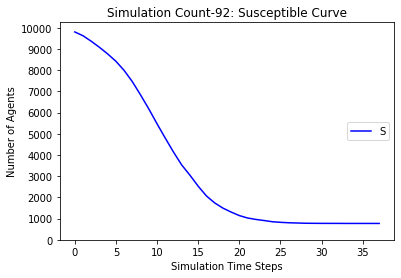

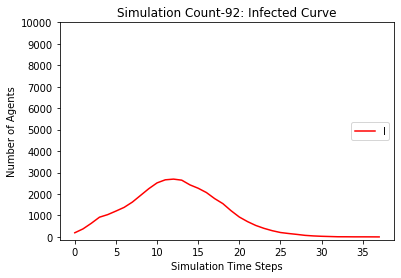

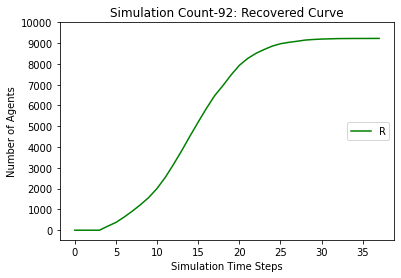

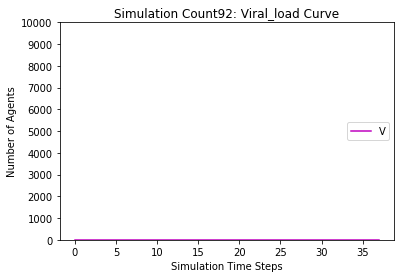

[9807, 9632, 9366, 9050, 8719, 8373, 8001, 7539, 7058, 6531, 5818, 5072, 4317, 3689, 3073, 2586, 2157, 1831, 1574, 1381, 1238, 1136, 1073, 1011, 965, 933, 921, 911, 907, 902, 902, 900, 899, 899, 898, 898, 898, 898, 898]
[193, 368, 634, 950, 1088, 1259, 1365, 1511, 1661, 1842, 2183, 2467, 2741, 2842, 2745, 2486, 2160, 1858, 1499, 1205, 919, 695, 501, 370, 273, 203, 152, 100, 58, 31, 19, 11, 8, 3, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 368, 634, 950, 1281, 1627, 1999, 2461, 2942, 3469, 4182, 4928, 5683, 6311, 6927, 7414, 7843, 8169, 8426, 8619, 8762, 8864, 8927, 8989, 9035, 9067, 9079, 9089, 9093, 9098, 9098, 9100, 9101, 9101, 9102]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 90

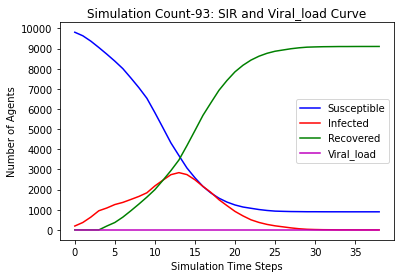

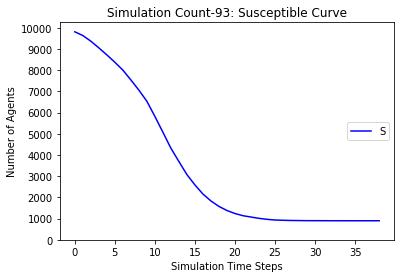

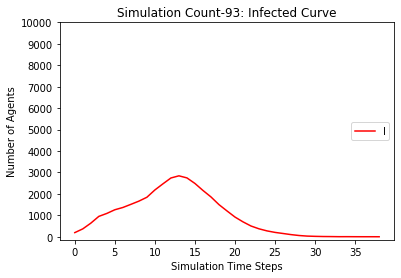

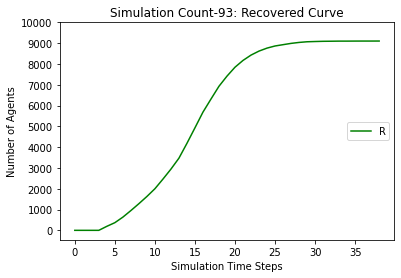

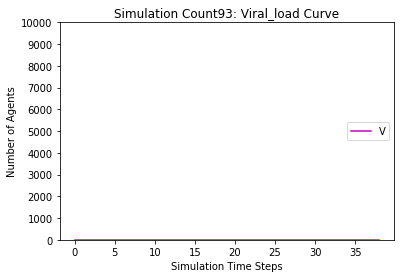

[9807, 9604, 9343, 9016, 8684, 8326, 7932, 7536, 7088, 6593, 5960, 5278, 4611, 3986, 3367, 2800, 2294, 1903, 1611, 1356, 1177, 1050, 971, 875, 838, 808, 786, 773, 766, 763, 762, 758, 757, 756, 755, 755, 755, 755, 755]
[193, 396, 657, 984, 1123, 1278, 1411, 1480, 1596, 1733, 1972, 2258, 2477, 2607, 2593, 2478, 2317, 2083, 1756, 1444, 1117, 853, 640, 481, 339, 242, 185, 102, 72, 45, 24, 15, 9, 7, 7, 3, 2, 1, 0]
[0, 0, 0, 0, 193, 396, 657, 984, 1316, 1674, 2068, 2464, 2912, 3407, 4040, 4722, 5389, 6014, 6633, 7200, 7706, 8097, 8389, 8644, 8823, 8950, 9029, 9125, 9162, 9192, 9214, 9227, 9234, 9237, 9238, 9242, 9243, 9244, 9245]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905

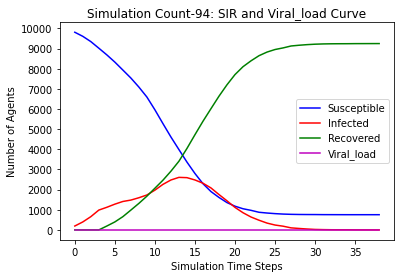

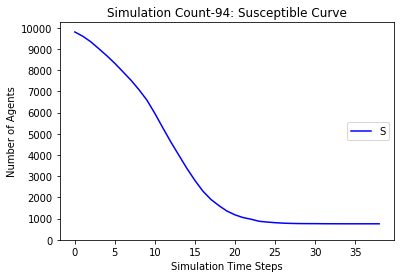

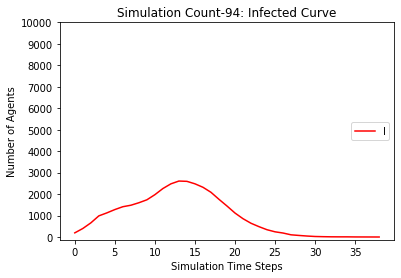

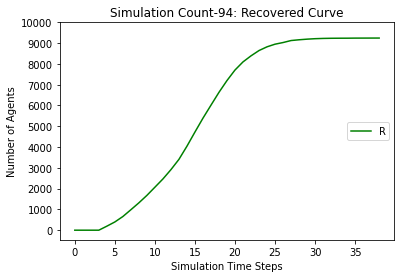

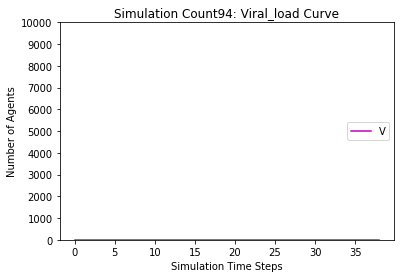

[9807, 9622, 9356, 9032, 8648, 8293, 7861, 7424, 6839, 6193, 5544, 4838, 4067, 3339, 2646, 2045, 1576, 1282, 1094, 984, 917, 867, 835, 819, 807, 802, 797, 792, 791, 791, 791, 791, 791]
[193, 378, 644, 968, 1159, 1329, 1495, 1608, 1809, 2100, 2317, 2586, 2772, 2854, 2898, 2793, 2491, 2057, 1552, 1061, 659, 415, 259, 165, 110, 65, 38, 27, 16, 11, 6, 1, 0]
[0, 0, 0, 0, 193, 378, 644, 968, 1352, 1707, 2139, 2576, 3161, 3807, 4456, 5162, 5933, 6661, 7354, 7955, 8424, 8718, 8906, 9016, 9083, 9133, 9165, 9181, 9193, 9198, 9203, 9208, 9209]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 7665, 7238, 6750, 6256

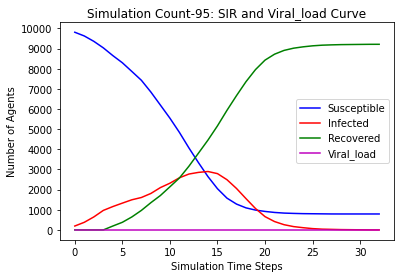

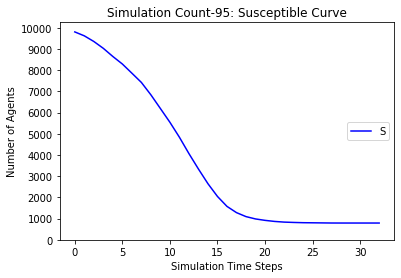

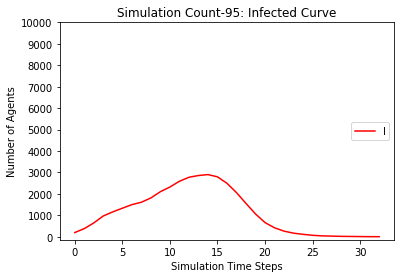

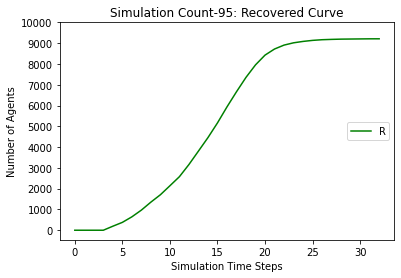

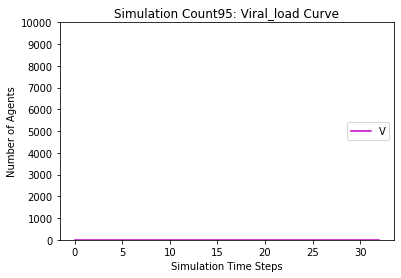

[9807, 9621, 9369, 9065, 8689, 8239, 7712, 7046, 6335, 5505, 4634, 3845, 3112, 2408, 1837, 1456, 1204, 1039, 905, 831, 787, 762, 731, 702, 690, 678, 671, 665, 663, 661, 660, 660, 659, 658, 656, 656, 656, 656, 656]
[193, 379, 631, 935, 1118, 1382, 1657, 2019, 2354, 2734, 3078, 3201, 3223, 3097, 2797, 2389, 1908, 1369, 932, 625, 417, 277, 174, 129, 97, 84, 60, 37, 27, 17, 11, 5, 4, 3, 4, 4, 3, 2, 0]
[0, 0, 0, 0, 193, 379, 631, 935, 1311, 1761, 2288, 2954, 3665, 4495, 5366, 6155, 6888, 7592, 8163, 8544, 8796, 8961, 9095, 9169, 9213, 9238, 9269, 9298, 9310, 9322, 9329, 9335, 9337, 9339, 9340, 9340, 9341, 9342, 9344]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 

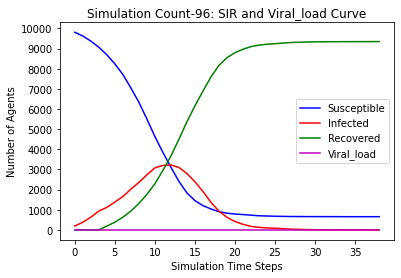

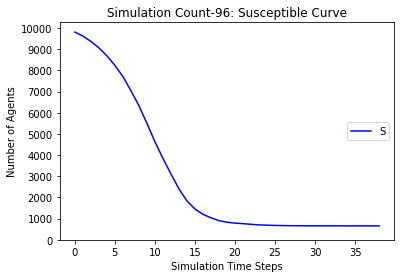

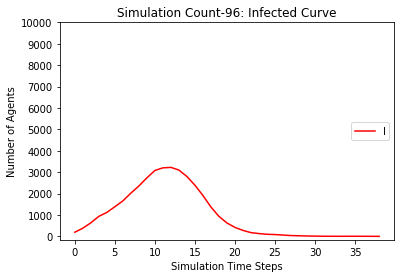

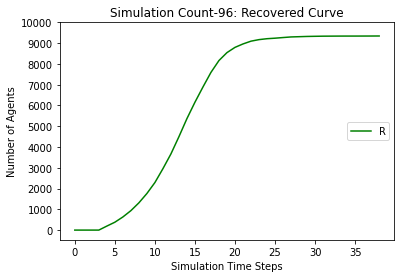

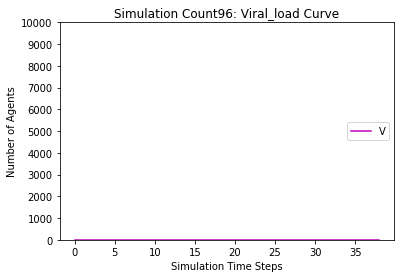

[9807, 9629, 9368, 9054, 8698, 8368, 7977, 7433, 6800, 6030, 5147, 4324, 3563, 2961, 2472, 2049, 1713, 1489, 1318, 1212, 1145, 1097, 1060, 1048, 1031, 1018, 1004, 999, 996, 996, 994, 993, 993, 993, 993, 993]
[193, 371, 632, 946, 1109, 1261, 1391, 1621, 1898, 2338, 2830, 3109, 3237, 3069, 2675, 2275, 1850, 1472, 1154, 837, 568, 392, 258, 164, 114, 79, 56, 49, 35, 22, 10, 6, 3, 3, 1, 0]
[0, 0, 0, 0, 193, 371, 632, 946, 1302, 1632, 2023, 2567, 3200, 3970, 4853, 5676, 6437, 7039, 7528, 7951, 8287, 8511, 8682, 8788, 8855, 8903, 8940, 8952, 8969, 8982, 8996, 9001, 9004, 9004, 9006, 9007]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], 

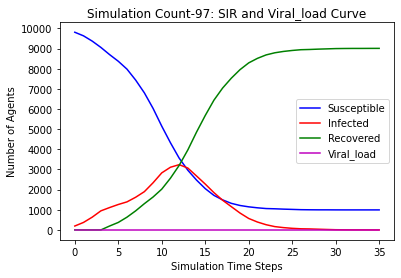

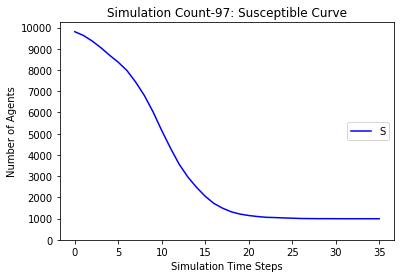

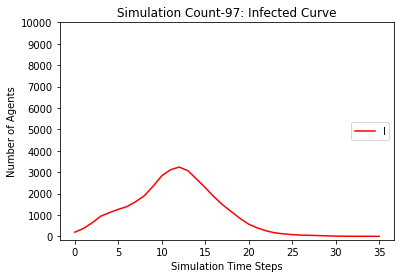

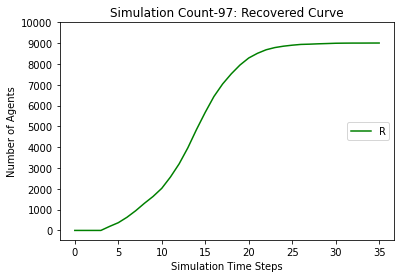

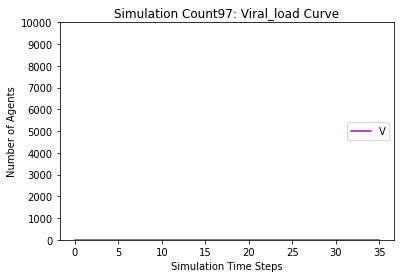

[9807, 9630, 9379, 9069, 8705, 8333, 7932, 7462, 6915, 6200, 5426, 4682, 3953, 3114, 2406, 1840, 1418, 1124, 941, 823, 730, 667, 620, 593, 573, 562, 556, 554, 550, 548, 548, 548, 548, 548]
[193, 370, 621, 931, 1102, 1297, 1447, 1607, 1790, 2133, 2506, 2780, 2962, 3086, 3020, 2842, 2535, 1990, 1465, 1017, 688, 457, 321, 230, 157, 105, 64, 39, 23, 14, 8, 6, 2, 0]
[0, 0, 0, 0, 193, 370, 621, 931, 1295, 1667, 2068, 2538, 3085, 3800, 4574, 5318, 6047, 6886, 7594, 8160, 8582, 8876, 9059, 9177, 9270, 9333, 9380, 9407, 9427, 9438, 9444, 9446, 9450, 9452]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 9635, 9391, 9084, 8736, 8413, 8053, 766

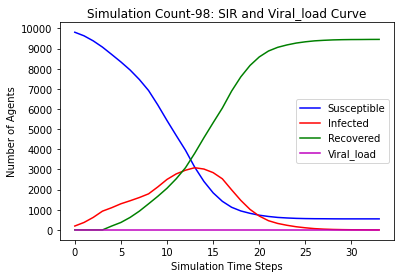

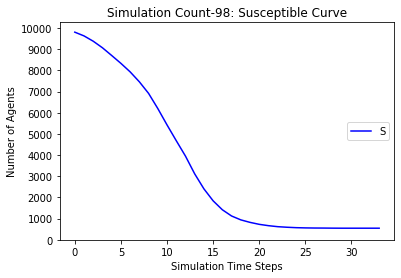

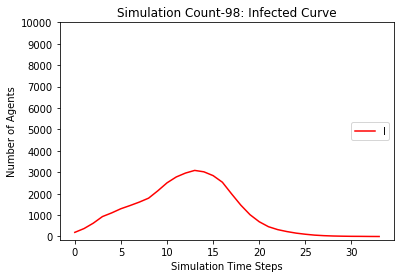

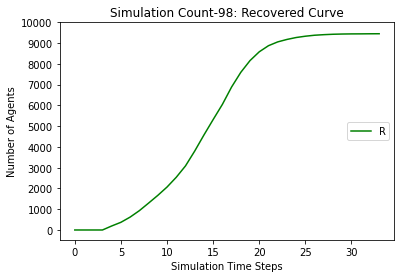

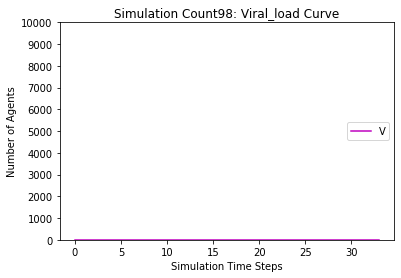

[9807, 9613, 9343, 8991, 8573, 8099, 7549, 6920, 6191, 5419, 4643, 3957, 3296, 2622, 2082, 1677, 1396, 1167, 1038, 946, 893, 866, 818, 795, 772, 766, 760, 760, 759, 758, 758, 757, 757, 757, 757, 757]
[193, 387, 657, 1009, 1234, 1514, 1794, 2071, 2382, 2680, 2906, 2963, 2895, 2797, 2561, 2280, 1900, 1455, 1044, 731, 503, 301, 220, 151, 121, 100, 58, 35, 13, 8, 2, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 193, 387, 657, 1009, 1427, 1901, 2451, 3080, 3809, 4581, 5357, 6043, 6704, 7378, 7918, 8323, 8604, 8833, 8962, 9054, 9107, 9134, 9182, 9205, 9228, 9234, 9240, 9240, 9241, 9242, 9242, 9243]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 895, 895], [9807, 

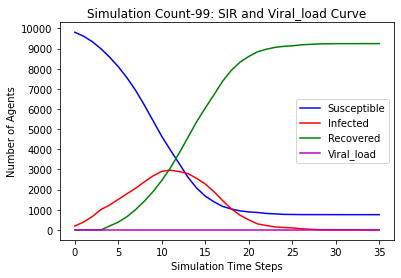

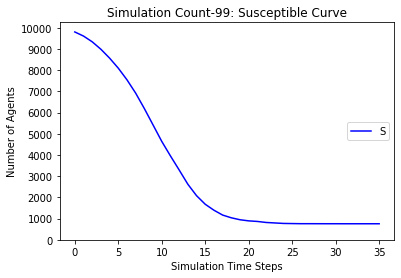

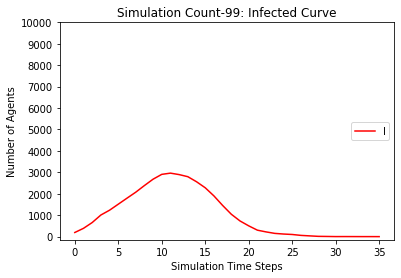

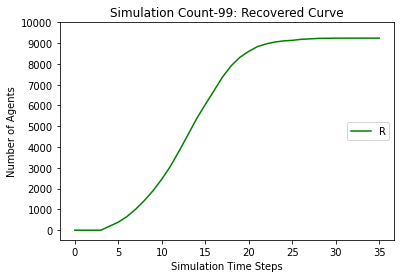

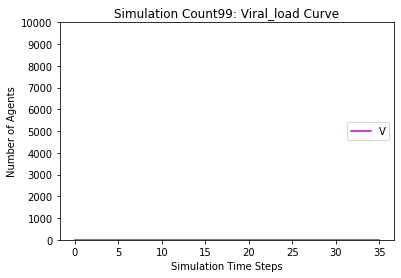

[9807, 9616, 9341, 9049, 8731, 8332, 7876, 7242, 6549, 5755, 4949, 4083, 3248, 2570, 2042, 1587, 1298, 1089, 962, 882, 830, 775, 740, 725, 714, 700, 695, 693, 691, 690, 690, 689, 688, 688, 688, 688, 688]
[193, 384, 659, 951, 1076, 1284, 1465, 1807, 2182, 2577, 2927, 3159, 3301, 3185, 2907, 2496, 1950, 1481, 1080, 705, 468, 314, 222, 157, 116, 75, 45, 32, 23, 10, 5, 4, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 193, 384, 659, 951, 1269, 1668, 2124, 2758, 3451, 4245, 5051, 5917, 6752, 7430, 7958, 8413, 8702, 8911, 9038, 9118, 9170, 9225, 9260, 9275, 9286, 9300, 9305, 9307, 9309, 9310, 9310, 9311, 9312]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[], [9807, 9639, 9358, 9061, 8741, 8360, 7915, 7416, 6818, 6168, 5442, 4637, 3911, 3281, 2740, 2283, 1896, 1593, 1409, 1264, 1159, 1086, 1031, 992, 955, 929, 920, 912, 905, 903, 901, 899, 896, 896, 896, 895, 895, 895, 89

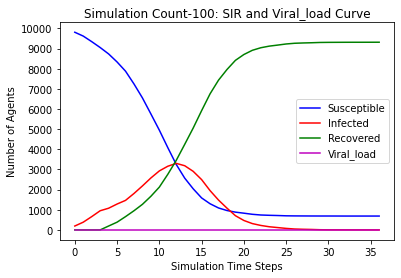

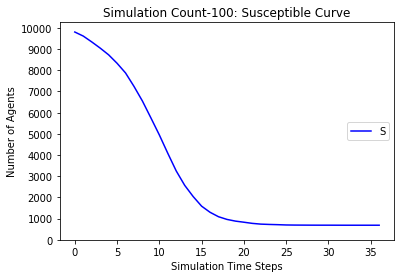

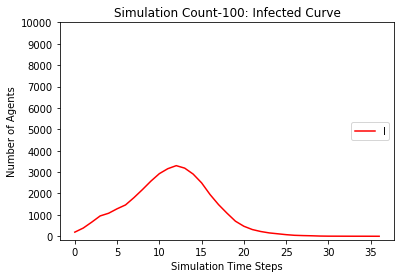

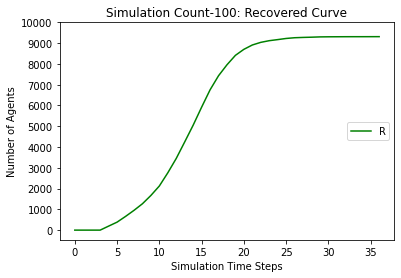

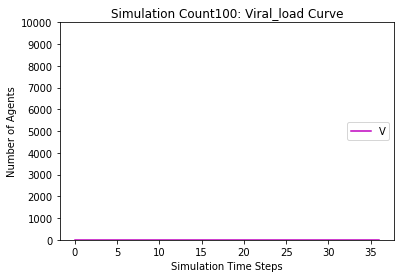

In [10]:
SS,II,RR,VV,TT = [[]],[[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  Sj,Ij,Rj,Vj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,V,T = [],[],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  V.append(Vj)
  T.append(j)

  while Ij > 0 or Vj >= 1 :
    Node_p,Node_n,Agent_p,Agent_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1)
    j+=1 
    Sj,Ij,Rj,Vj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    V.append(Vj)
    T.append(j)
    
  print(S)
  print(I)
  print(R)
  print(V)
  SS.append(S)
  II.append(I)
  RR.append(R)
  VV.append(V)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  print(VV)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g',T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': SIR and Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Susceptible Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Infected Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Recovered Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

  plt.plot(T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Viral_load"),loc='center right')
  plt.show()  

Susceptible Average (100 Simulations): [9807, 9620.12163976454, 9357.498358448367, 9025.663640995168, 8635.179369671238, 8213.478746656423, 7730.349044605118, 7161.206389095104, 6502.551993788342, 5752.639644037402, 4964.963459164206, 4239.783814812909, 3540.3826702020465, 2831.922584972942, 2247.942569802256, 1791.8993350689384, 1458.9392244548903, 1212.4612166333252, 1058.1902703355145, 954.5502668457777, 886.5510968007338, 844.6558248594923, 799.1532629102819, 774.734066930225, 753.7007603320776, 744.5179414042891, 737.124956419002, 735.125501502954, 732.8896629185942, 731.6519720025866, 731.3023493596595, 730.5954855076554]
Infected Average(100 Simulations): [193, 379.87836023546083, 642.5016415516336, 974.336359004833, 1171.8206303287623, 1406.642893108116, 1627.1493138432488, 1864.457251900063, 2132.6273758828956, 2460.839102619021, 2765.385585440912, 2921.4225742821945, 2962.1693235862954, 2920.7170590644605, 2717.0208893619492, 2447.884479743971, 2081.443445747156, 1619.4613683

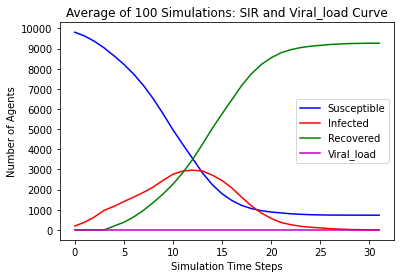

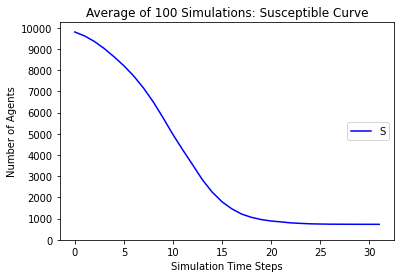

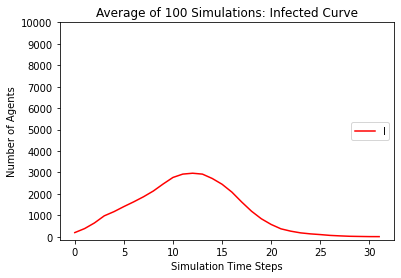

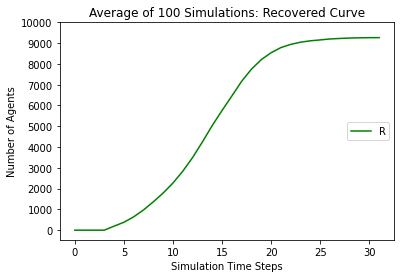

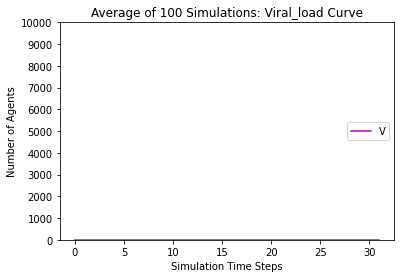

In [11]:
SC = SS[1]
IC = II[1]
RC = RR[1]
VT = VV[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  VT = [mean(i) for i in zip(VT,VV[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

print("Susceptible Average (100 Simulations):", SC)
print("Infected Average(100 Simulations):", IC)
print("Recovered Average(100 Simulations):", RC)
print("Viral_load Average(100 Simulations):", VT) 
print("Time Steps:", TC) 



plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g', TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: SIR and Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Infected Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))

plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Recovered"),loc='center right')
plt.show()  

plt.plot(TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Viral_load"),loc='center right')
plt.show() 



  
